In [13]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'

from matplotlib.dates import date2num
import matplotlib.dates as mdates
import matplotlib.patches as mpatches
from datetime import datetime
import xarray as xr
import netCDF4 as nc
import glob
import math
import subprocess
from matplotlib import colormaps
import plotly.graph_objs as go

import cartopy.crs as ccrs
import cartopy.feature as cfeature

import seaborn as sns
import csv
import pandas as pd
from scipy.optimize import curve_fit
from math import prod
from datetime import timezone
from datetime import timedelta

import numpy as np
import matplotlib.pyplot as plt
from metpy.plots import SkewT
from metpy.units import units
from metpy.calc import dewpoint_from_relative_humidity
#from metpy.io import get_test_data

import sys, os
import requests
import pyart
import h5py

import warnings
warnings.simplefilter("ignore", RuntimeWarning)
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)

#%matplotlib notebook

plt.style.use('default')


#import dask
#from dask.distributed import Client, progress, wait
#dask.config.config.get('distributed').get('dashboard').update({'link':'{JUPYTERHUB_SERVICE_PREFIX}/proxy/{port}/status'})
#client = Client()
#client

#dask.config.set(scheduler='threads', num_workers=2)

from dask.distributed import Client
import dask

# Dashboard config for JupyterHub (optional)
dask.config.config.get('distributed').get('dashboard').update({
    'link': '{JUPYTERHUB_SERVICE_PREFIX}/proxy/{port}/status'
})

# Start Dask client with controlled resources
client = Client(n_workers=4, threads_per_worker=2, memory_limit='20GB') # This will use 4*2=8 CPU threads
#client


2025-09-29 15:00:58,899 - distributed.scheduler - WARNING - Removing worker 'tcp://127.0.0.1:45333' caused the cluster to lose already computed task(s), which will be recomputed elsewhere: {('getitem-mul-slice-nanmax_skip-6fd1c281a3681075674a3715b100f66a', 2, 0, 0), 'original-open_dataset-qc-6249c81d5763a94f7107f93f7db6b476', 'original-open_dataset-rho-c594cf299ba7422d4f83607be1180227'} (stimulus_id='handle-worker-cleanup-1759150858.8992813')
2025-09-29 15:00:58,913 - distributed.nanny - WARNING - Restarting worker


In [4]:

file_path='/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/latent_heat/sull_ds';

ds_4sip = xr.open_mfdataset(f'{file_path}/4sip/orcestra_2mom/NWP_LAM_icongrid_DOM04_*.nc',
                           chunks={'time': 4, 'height': 10}, parallel=True);
ds_4sip_hfreq = xr.open_mfdataset(f'{file_path}/4sip/orcestra_2mom/NWP_LAM_highfreq_DOM04_*.nc',
                                 chunks={'time': 4, 'height': 10}, parallel=True);


/home/b/b382718/own_env/lib/python3.9/site-packages/xarray/backends/plugins.py:80: RuntimeWarning: Engine 'earthkit' loading failed:
unsupported operand type(s) for |: 'type' and 'types.GenericAlias'
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)
/home/b/b382718/own_env/lib/python3.9/site-packages/xarray/backends/plugins.py:80: RuntimeWarning: Engine 'earthkit' loading failed:
unsupported operand type(s) for |: 'type' and 'types.GenericAlias'
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)
/home/b/b382718/own_env/lib/python3.9/site-packages/xarray/backends/plugins.py:80: RuntimeWarning: Engine 'earthkit' loading failed:
unsupported operand type(s) for |: 'type' and 'types.GenericAlias'
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)
/home/b/b382718/own_env/lib/python3.9/site-packages/xarray/backends/plugins.py:80: RuntimeWarning: Engine 'earthkit' loading failed:
unsupported operand type(s) for |: 'type' and

In [5]:

file_path='/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/latent_heat/sull_ds';

ds_nosip = xr.open_mfdataset(f'{file_path}/nosip/orcestra_2mom/NWP_LAM_icongrid_DOM04_*.nc',
                            chunks={'time': 4, 'height': 10}, parallel=True);
ds_nosip_hfreq = xr.open_mfdataset(f'{file_path}/nosip/orcestra_2mom/NWP_LAM_highfreq_DOM04_*.nc',
                                  chunks={'time': 4, 'height': 10}, parallel=True);


In [6]:

file_path='/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/latent_heat/sull_ds';
ds_4sip_regcord = xr.open_mfdataset(f'{file_path}/4sip/orcestra_2mom/NWP_LAM_highfreq_regcoord*.nc',
                                   chunks={'time': 4, 'height': 10}, parallel=True);
#ds_nosip_regcord = xr.open_mfdataset(f'{file_path}/nosip/orcestra_2mom/NWP_LAM_highfreq_regcoord*.nc');


In [3]:

file_path='/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/latent_heat/sull_ds'
ds_nosip_hfreq = xr.open_mfdataset(f'{file_path}/nosip/orcestra_2mom/NWP_LAM_highfreq_DOM04_2024*.nc');


In [7]:


ds_4sip['w_vel'] = -1.*ds_4sip.omega/(9.8*ds_4sip.rho)
ds_4sip['tempc'] = ds_4sip.temp-273.16;
ds_4sip['lwc_gperm3']  = ds_4sip.qc*ds_4sip.rho*1.e3 # kgperm3 to gperm3
ds_4sip['tqi'] = ds_4sip.qi+ds_4sip.qs+ds_4sip.qg+ds_4sip.qh
ds_4sip['tq'] = ds_4sip.qc+ds_4sip.qi+ds_4sip.qs+ds_4sip.qg+ds_4sip.qh
ds_4sip['ciwc_gperm3'] = ds_4sip.qi*ds_4sip.rho*1.e3 # kgperm3 to gperm3
ds_4sip['tiwc_gperm3'] = (ds_4sip.qi+ds_4sip.qs+ds_4sip.qg+ds_4sip.qh)*ds_4sip.rho*1.e3 # kgperm3 to gperm3
ds_4sip['ciwc_gperm3'] = (ds_4sip.qi)*ds_4sip.rho*1.e3 # kgperm3 to gperm3
ds_4sip['cdnc_percm3'] = ds_4sip.qnc*ds_4sip.rho*1.e-6  # perkg to percm3
ds_4sip['inc_perl'] = (ds_4sip.qni+ds_4sip.qns+ds_4sip.qng+ds_4sip.qnh)*ds_4sip.rho*1.e-3 # perkg to perl


ds_4sip_hfreq['w_vel'] = -1.*ds_4sip_hfreq.omega/(9.8*ds_4sip_hfreq.rho)
ds_4sip_hfreq['tempc'] = ds_4sip_hfreq.temp-273.16;
ds_4sip_hfreq['lwc_gperm3']  = ds_4sip_hfreq.qc*ds_4sip_hfreq.rho*1.e3 # kgperm3 to gperm3
ds_4sip_hfreq['tqi'] = ds_4sip_hfreq.qi+ds_4sip_hfreq.qs+ds_4sip_hfreq.qg+ds_4sip_hfreq.qh
ds_4sip_hfreq['tq'] = ds_4sip_hfreq.qc+ds_4sip_hfreq.qi+ds_4sip_hfreq.qs+ds_4sip_hfreq.qg+ds_4sip_hfreq.qh
ds_4sip_hfreq['ciwc_gperm3'] = ds_4sip_hfreq.qi*ds_4sip_hfreq.rho*1.e3 # kgperm3 to gperm3
ds_4sip_hfreq['tiwc_gperm3'] = (ds_4sip_hfreq.qi+ds_4sip_hfreq.qs+ds_4sip_hfreq.qg+ds_4sip_hfreq.qh)*ds_4sip_hfreq.rho*1.e3 # kgperm3 to gperm3
ds_4sip_hfreq['ciwc_gperm3'] = (ds_4sip_hfreq.qi)*ds_4sip_hfreq.rho*1.e3 # kgperm3 to gperm3
ds_4sip_hfreq['cdnc_percm3'] = ds_4sip_hfreq.qnc*ds_4sip_hfreq.rho*1.e-6  # perkg to percm3
ds_4sip_hfreq['inc_perl'] = (ds_4sip_hfreq.qni+ds_4sip_hfreq.qns+ds_4sip_hfreq.qng+ds_4sip_hfreq.qnh)*ds_4sip_hfreq.rho*1.e-3 # perkg to perl


ds_nosip_hfreq['w_vel'] = -1.*ds_nosip_hfreq.omega/(9.8*ds_nosip_hfreq.rho)
ds_nosip_hfreq['tempc'] = ds_nosip_hfreq.temp-273.16;
ds_nosip_hfreq['lwc_gperm3']  = ds_nosip_hfreq.qc*ds_nosip_hfreq.rho*1.e3 # kgperm3 to gperm3
ds_nosip_hfreq['tqi'] = ds_nosip_hfreq.qi+ds_nosip_hfreq.qs+ds_nosip_hfreq.qg+ds_nosip_hfreq.qh
ds_nosip_hfreq['tq'] = ds_nosip_hfreq.qc+ds_nosip_hfreq.qi+ds_nosip_hfreq.qs+ds_nosip_hfreq.qg+ds_nosip_hfreq.qh
ds_nosip_hfreq['ciwc_gperm3'] = ds_nosip_hfreq.qi*ds_nosip_hfreq.rho*1.e3 # kgperm3 to gperm3
ds_nosip_hfreq['tiwc_gperm3'] = (ds_nosip_hfreq.qi+ds_nosip_hfreq.qs+ds_nosip_hfreq.qg+ds_nosip_hfreq.qh)*ds_nosip_hfreq.rho*1.e3 # kgperm3 to gperm3
ds_nosip_hfreq['ciwc_gperm3'] = (ds_nosip_hfreq.qi)*ds_nosip_hfreq.rho*1.e3 # kgperm3 to gperm3
ds_nosip_hfreq['cdnc_percm3'] = ds_nosip_hfreq.qnc*ds_nosip_hfreq.rho*1.e-6  # perkg to percm3
ds_nosip_hfreq['tinc_perl'] = (ds_nosip_hfreq.qni+ds_nosip_hfreq.qns+ds_nosip_hfreq.qng+ds_nosip_hfreq.qnh)*ds_nosip_hfreq.rho*1.e-3 # perkg to perl
ds_nosip_hfreq['cinc_perl'] = (ds_nosip_hfreq.qni)*ds_nosip_hfreq.rho*1.e-3

ds_4sip_hfreq['dz'] = ds_4sip_hfreq.z_mc.diff(dim='height').pad(height=(0,1), constant_values=0)
ds_4sip_hfreq['clwp_kgperm2'] = (ds_4sip_hfreq.qc*ds_4sip_hfreq.rho*(-1.*ds_4sip_hfreq.dz)).sum(dim='height')
ds_4sip_hfreq['ciwp_kgperm2'] = (ds_4sip_hfreq.qi*ds_4sip_hfreq.rho*(-1.*ds_4sip_hfreq.dz)).sum(dim='height')
ds_4sip_hfreq['rwp_kgperm2'] = (ds_4sip_hfreq.qr*ds_4sip_hfreq.rho*(-1.*ds_4sip_hfreq.dz)).sum(dim='height')

avg_clwp_kgperm2_4sip_hf = ds_4sip_hfreq.clwp_kgperm2.mean('ncells')
avg_ciwp_kgperm2_4sip_hf = ds_4sip_hfreq.ciwp_kgperm2.mean('ncells')
avg_rwp_kgperm2_4sip_hf = ds_4sip_hfreq.rwp_kgperm2.mean('ncells')


ds_4sip_regcord['w_vel'] = -1.*ds_4sip_regcord.omega/(9.8*ds_4sip_regcord.rho)
ds_4sip_regcord['tempc'] = ds_4sip_regcord.temp-273.16;
ds_4sip_regcord['lwc_gperm3']  = ds_4sip_regcord.qc*ds_4sip_regcord.rho*1.e3 # kgperm3 to gperm3
ds_4sip_regcord['tqi'] = ds_4sip_regcord.qi+ds_4sip_regcord.qs+ds_4sip_regcord.qg+ds_4sip_regcord.qh
ds_4sip_regcord['tq'] = ds_4sip_regcord.qc+ds_4sip_regcord.qi+ds_4sip_regcord.qs+ds_4sip_regcord.qg+ds_4sip_regcord.qh
ds_4sip_regcord['ciwc_gperm3'] = ds_4sip_regcord.qi*ds_4sip_regcord.rho*1.e3 # kgperm3 to gperm3
ds_4sip_regcord['tiwc_gperm3'] = (ds_4sip_regcord.qi+ds_4sip_regcord.qs+ds_4sip_regcord.qg+ds_4sip_regcord.qh)*ds_4sip_regcord.rho*1.e3 # kgperm3 to gperm3
ds_4sip_regcord['ciwc_gperm3'] = (ds_4sip_regcord.qi)*ds_4sip_regcord.rho*1.e3 # kgperm3 to gperm3
ds_4sip_regcord['cdnc_percm3'] = ds_4sip_regcord.qnc*ds_4sip_regcord.rho*1.e-6  # perkg to percm3
ds_4sip_regcord['tinc_perl'] = (ds_4sip_regcord.qni+ds_4sip_regcord.qns+ds_4sip_regcord.qng+ds_4sip_regcord.qnh)*ds_4sip_regcord.rho*1.e-3 # perkg to perl
ds_4sip_regcord['cinc_perl'] = (ds_4sip_regcord.qni)*ds_4sip_regcord.rho*1.e-3


ds_4sip_regcord['dz'] = ds_4sip_regcord.z_mc.diff(dim='height').pad(height=(0,1), constant_values=0)
ds_4sip_regcord['clwp_kgperm2'] = (ds_4sip_regcord.qc*ds_4sip_regcord.rho*(-1.*ds_4sip_regcord.dz)).sum(dim='height')
ds_4sip_regcord['ciwp_kgperm2'] = (ds_4sip_regcord.qi*ds_4sip_regcord.rho*(-1.*ds_4sip_regcord.dz)).sum(dim='height')
ds_4sip_regcord['rwp_kgperm2'] = (ds_4sip_regcord.qr*ds_4sip_regcord.rho*(-1.*ds_4sip_regcord.dz)).sum(dim='height')


In [6]:
ds_4sip_regcord

<xarray.Dataset> Size: 198GB
Dimensions:       (time: 121, lon: 401, lat: 401, height: 65, height_2: 66,
                   plev: 1, plev_2: 1, plev_3: 1, bnds: 2)
Coordinates:
  * time          (time) datetime64[ns] 968B 2024-09-03T15:00:00 ... 2024-09-...
  * lon           (lon) float64 3kB -32.0 -31.99 -31.98 ... -28.02 -28.01 -28.0
  * lat           (lat) float64 3kB 7.0 7.01 7.02 7.03 ... 10.98 10.99 11.0
  * height        (height) float64 520B 1.0 2.0 3.0 4.0 ... 62.0 63.0 64.0 65.0
  * height_2      (height_2) float64 528B 1.0 2.0 3.0 4.0 ... 64.0 65.0 66.0
  * plev          (plev) float64 8B 800.0
  * plev_2        (plev_2) float64 8B 400.0
  * plev_3        (plev_3) float64 8B 0.0
Dimensions without coordinates: bnds
Data variables: (12/53)
    height_bnds   (time, height, bnds) float64 126kB dask.array<chunksize=(1, 65, 2), meta=np.ndarray>
    plev_bnds     (time, plev, bnds) float64 2kB dask.array<chunksize=(1, 1, 2), meta=np.ndarray>
    plev_2_bnds   (time, plev_2, bnds) float64 2kB dask.array<chunksize=(1, 1, 2), meta=np.ndarray>
    plev_3_bnds   (time, plev_3, bnds) float64 2kB dask.array<chunksize=(1, 1, 2), meta=np.ndarray>
    z_mc          (time, height, lat, lon) float32 5GB dask.array<chunksize=(1, 65, 401, 401), meta=np.ndarray>
    u             (time, height, lat, lon) float32 5GB dask.array<chunksize=(1, 65, 401, 401), meta=np.ndarray>
    ...            ...
    cdnc_percm3   (time, height, lat, lon) float32 5GB dask.array<chunksize=(1, 65, 401, 401), meta=np.ndarray>
    inc_perl      (time, height, lat, lon) float32 5GB dask.array<chunksize=(1, 65, 401, 401), meta=np.ndarray>
    dz            (time, height, lat, lon) float32 5GB dask.array<chunksize=(1, 32, 401, 401), meta=np.ndarray>
    clwp_kgperm2  (time, lat, lon) float32 78MB dask.array<chunksize=(1, 401, 401), meta=np.ndarray>
    ciwp_kgperm2  (time, lat, lon) float32 78MB dask.array<chunksize=(1, 401, 401), meta=np.ndarray>
    rwp_kgperm2   (time, lat, lon) float32 78MB dask.array<chunksize=(1, 401, 401), meta=np.ndarray>
Attributes:
    CDI:          Climate Data Interface version 2.4.0 (https://mpimet.mpg.de...
    Conventions:  CF-1.6
    uuidOfVGrid:  567425a0-32bf-151c-3811-4389b7cd21e0
    institution:  Max Planck Institute for Meteorology/Deutscher Wetterdienst
    title:        ICON simulation
    source:       version: 2024.10; revision: f3f9a5624ca4223a7fe2f0c972e0850...
    history:      /home/b/b382718/continental_cases/4sip/icon-oct2024/bin/ico...
    references:   see MPIM/DWD publications
    comment:      Deepak Waman (b382718) on l20392 (Linux 4.18.0-513.24.1.el8...

In [8]:

file_path='/work/bk1415/b382718/output/orcestra/nested_run/icon_output/marine_ccn/latent_heat';
grid_orc = xr.open_mfdataset(f'{file_path}/sull_ds/4sip/orcestra_2mom/domain4_DOM04.nc');


clon_deg = np.degrees(grid_orc.clon)
clat_deg = np.degrees(grid_orc.clat)

print(clon_deg.min().values); print(clon_deg.max().values);
print(clat_deg.min().values); print(clat_deg.max().values);

okla_x, okla_y = np.array([-30., 9.])
#print(okla_x), print(okla_y)
dx_deg = 2.; dy_deg = 2.0
left_bound = okla_x - dx_deg
right_bound = okla_x + dx_deg
top_bound = okla_y + dy_deg
bottom_bound = okla_y - dy_deg

print(left_bound), print(right_bound)
print(top_bound), print(bottom_bound)


window_cell = (
    (grid_orc.clat >= np.deg2rad(bottom_bound))
    & (grid_orc.clat <= np.deg2rad(top_bound))
    & (grid_orc.clon >= np.deg2rad(left_bound))
    & (grid_orc.clon <= np.deg2rad(right_bound))
).values

(window_cell_indices,) = np.where(window_cell)


# select cells matching with the area of interest (windows_cell_indices:: matching to that with the area sampled by the aircraft)
window_vertex_indices = (np.unique(grid_orc.vertex_of_cell.isel(cell=window_cell_indices).values) - 1)
print('window_vertex_indices ::',window_vertex_indices)

# select edges matching with the area of interest (corresponding to the windows_cell_indices)
window_edge_indices = (np.unique(grid_orc.edge_of_cell.isel(cell=window_cell_indices).values) - 1)
print('window_edge_indices ::',window_edge_indices)

selected_indices = xr.Dataset(
    {
        "cell": ("cell", window_cell_indices),
        "vertex": ("vertex", window_vertex_indices),
        "edge": ("edge", window_edge_indices),
    }
)

vars_to_renumber = {
    "cell": [
        "adjacent_cell_of_edge",
        "cells_of_vertex",
        "neighbor_cell_index",
    ],
    "vertex": ["vertex_of_cell", "edge_vertices", "vertices_of_vertex"],
    "edge": ["edge_of_cell", "edges_of_vertex"],
}


def reindex_grid(grid, indices, vars_to_renumber):
    new_grid = grid.load().isel(
        cell=indices.cell, vertex=indices.vertex, edge=indices.edge
    )
    for dim, idx in indices.coords.items():
        renumbering = np.full(grid.dims[dim], -2, dtype="int")
        renumbering[idx] = np.arange(len(idx))
        for name in vars_to_renumber[dim]:
            new_grid[name].data = renumbering[new_grid[name].data - 1] + 1
    return new_grid


new_grid_orc = reindex_grid(grid_orc, selected_indices, vars_to_renumber)
mask_ncells_orc=np.isin(ds_4sip['ncells'], selected_indices.cell)


-32.03759442634206
-27.96236307373933
6.967468001138239
11.031985309167817
-32.0
-28.0
11.0
7.0
window_vertex_indices :: [    4     7    15 ... 37370 37371 37372]
window_edge_indices :: [    63     64     65 ... 111329 111330 111331]


In [9]:

ds_4sip_new = ds_4sip.sel(ncells=mask_ncells_orc)

ds_4sip_hfreq_new = ds_4sip_hfreq.sel(ncells=mask_ncells_orc, time=slice('2024-09-03T16:00:00.000000000','2024-09-03T16:10:00.000000000'))
ds_nosip_hfreq_new = ds_nosip_hfreq.sel(ncells=mask_ncells_orc, time=slice('2024-09-03T16:00:00.000000000','2024-09-03T16:10:00.000000000'))


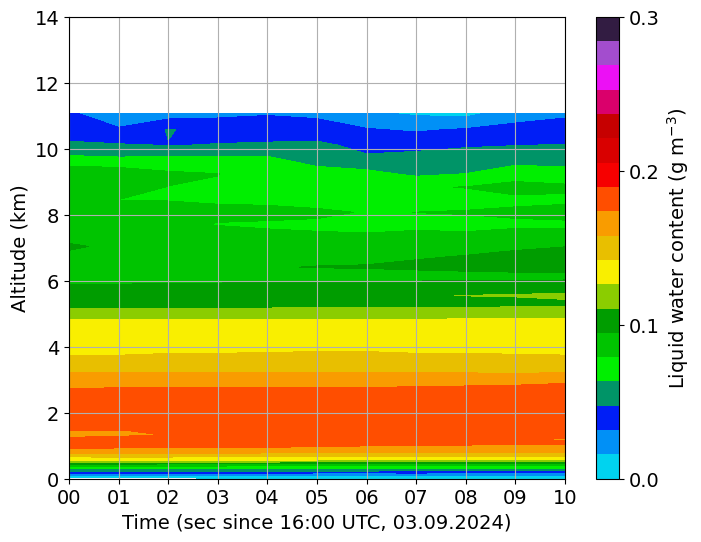

In [12]:

filt_lwc_4sip = xr.where(ds_4sip_regcord.lwc_gperm3 > 1.e-6, ds_4sip_regcord.lwc_gperm3, np.nan)
fnt=14
lev_lwc = np.linspace(0, 0.3, 20)
lev_iwc = np.linspace(0, 0.3, 20)
lev_tinc = np.linspace(0, 1000, 20)
lev_tcwnc = np.linspace(0, 240, 20)

plt.figure(figsize=(8,6))
plt.style.use('default')

cnt=plt.contourf(ds_4sip_regcord.time, 1.e-3*ds_4sip_regcord.z_mc.mean(dim=('time','lon','lat')), filt_lwc_4sip.mean(dim=('lon','lat')).T, levels=lev_lwc, cmap='pyart_NWSRef')#'HomeyerRainbow')
colorbar = plt.colorbar(cnt, ticks=[0, 0.1, 0.2, 0.3], label='Liquid water content (g m$^{-3}$)')
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Liquid water content (g m$^{-3}$)', size=fnt)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%M'))
start_date = datetime(2024, 9, 3, 16, 0) 
end_date = datetime(2024, 9, 3, 16, 10)
plt.ylim(0, 14.)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Time (sec since 16:00 UTC, 03.09.2024)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.grid()

plt.show()


In [14]:
import numpy as np
import matplotlib.pyplot as plt
import h5py


file = '/work/bk1415/b382718/output/orcestra/observations/earthcare_new/ECA_J_CPR_CLP_2AS_20240903T1605_20240903T1616_01520E_vBb.h5'

# Open the HDF5 file
with h5py.File(file, 'r') as f:
    #processing_group = f['/Level_1_attributes']
    
    ## List all datasets in the /Processing_attributes group
    #print("Datasets in /Level_1_attributes:")
    #for dataset_name in processing_group:
    #    print(f"- {dataset_name}")
        
    time_data = f['/ScienceData/Geo/time'][:]
    pres_1km_data  = f['/ScienceData/Data/GRID_pressure_1km'][:]              # 2D (4863/Inf, 206)    (time, height)
    temp_1km_data  = f['/ScienceData/Data/GRID_temperature_1km'][:]           # 2D (4863/Inf, 206)    (time, height)
    relhum_1km_data  = f['/ScienceData/Data/GRID_relativeHumidity_1km'][:]    # 2D (4863/Inf, 206)    (time, height)  
    height_data  = f['/ScienceData/Geo/height'][:]                        # 2D (4863/Inf, 206)    (time, height)
    
    # cloud products
    lwc1_10km_data = f['/ScienceData/Data/cloud_water_content1_10km'][:]                       # 2D (4863/Inf, 206) (time, height) 
    lwc1_1km_data = f['/ScienceData/Data/cloud_water_content1_1km'][:]                         # 2D (4863/Inf, 206)   
    lwc2_10km_data = f['/ScienceData/Data/cloud_water_content2_10km'][:]                       # 2D (4863/Inf, 206)                        
    lwc2_1km_data = f['/ScienceData/Data/cloud_water_content2_1km'][:]                         # 2D (4863/Inf, 206) 
    lwc_10km_data = f['/ScienceData/Data/cloud_water_content_10km'][:]                         # 2D (4863/Inf, 206)                        
    lwc_1km_data = f['/ScienceData/Data/cloud_water_content_1km'][:]                           # 2D (4863/Inf, 206)  
    lwc_10km_uncert_data = f['/ScienceData/Data/cloud_water_content_10km_uncertainty'][:]      # 2D (4863/Inf, 206)                        
    lwc_1km_uncert_data = f['/ScienceData/Data/cloud_water_content_1km_uncertainty'][:]        # 2D (4863/Inf, 206)

    cld_water_eff_rad_10km_data = f['/ScienceData/Data/cloud_water_effective_radius_10km'][:]                      # 2D (4863/Inf, 206)
    cld_water_eff_rad_10km_uncert_data = f['/ScienceData/Data/cloud_water_effective_radius_10km_uncertainty'][:]   # 2D (4863/Inf, 206)
    cld_water_eff_rad_1km_data = f['/ScienceData/Data/cloud_water_effective_radius_1km'][:]                        # 2D (4863/Inf, 206)
    cld_water_eff_rad_1km_uncert_data = f['/ScienceData/Data/cloud_water_effective_radius_1km_uncertainty'][:]     # 2D (4863/Inf, 206)
    lwp_10km_data = f['/ScienceData/Data/cloud_water_path_10km'][:]                                                # 1D (4863/Inf)
    lwp_1km_data = f['/ScienceData/Data/cloud_water_path_1km'][:]                                                  # 1D (4863/Inf)
    
    cld_air_vel_10km_data = f['/ScienceData/Data/cloud_air_velocity_10km'][:]                  
    cld_air_vel_1km_data = f['/ScienceData/Data/cloud_air_velocity_1km'][:]                    
    cld_doppler_vel_10km_data = f['/ScienceData/Data/cloud_doppler_velocity_10km'][:]          
    cld_doppler_vel_1km_data = f['/ScienceData/Data/cloud_doppler_velocity_1km'][:]            
    iwc_10km_data = f['/ScienceData/Data/cloud_ice_content_10km'][:]          
    iwc_1km_data = f['/ScienceData/Data/cloud_ice_content_1km'][:]            
    iwc_10km_uncert_data = f['/ScienceData/Data/cloud_ice_content_10km_uncertainty'][:]          
    iwc_1km_uncert_data = f['/ScienceData/Data/cloud_ice_content_1km_uncertainty'][:]    
    cld_ice_eff_rad_10km_data = f['/ScienceData/Data/cloud_ice_effective_radius_10km'][:]
    cld_ice_eff_rad_1km_data = f['/ScienceData/Data/cloud_ice_effective_radius_1km'][:] 
    cld_ice_eff_rad_10km_uncert_data = f['/ScienceData/Data/cloud_ice_effective_radius_10km_uncertainty'][:]
    cld_ice_eff_rad_1km_uncert_data = f['/ScienceData/Data/cloud_ice_effective_radius_1km_uncertainty'][:]
    iwp_10km_data = f['/ScienceData/Data/cloud_ice_water_path_10km'][:]                                         # 1D (4863/Inf)
    iwp_1km_data = f['/ScienceData/Data/cloud_ice_water_path_1km'][:]                                           # 1D (4863/Inf)
    cdnc1_10km_data = f['/ScienceData/Data/cloud_number_concentration1_10km'][:]                                # 2D (4863/Inf, 206)
    cdnc1_1km_data = f['/ScienceData/Data/cloud_number_concentration1_1km'][:]                                  # 2D (4863/Inf, 206)
    cdnc2_10km_data = f['/ScienceData/Data/cloud_number_concentration2_10km'][:]                                # 2D (4863/Inf, 206)
    cdnc2_1km_data = f['/ScienceData/Data/cloud_number_concentration2_1km'][:]                                  # 2D (4863/Inf, 206)
    cld_particle_cat_10km_data = f['/ScienceData/Data/cloud_particle_category_cpr_10km'][:]                     # 2D (4863/Inf, 206)
    cld_particle_cat_1km_data = f['/ScienceData/Data/cloud_particle_category_cpr_1km'][:]                       # 2D (4863/Inf, 206)
    cld_particle_type_10km_data = f['/ScienceData/Data/cloud_particle_type_cpr_10km'][:]                        # 2D (4863/Inf, 206)
    cld_particle_type_1km_data = f['/ScienceData/Data/cloud_particle_type_cpr_1km'][:]                          # 2D (4863/Inf, 206)
    cld_phase1_10km_data = f['/ScienceData/Data/cloud_phase1_10km'][:]                                          # 2D (4863/Inf, 206)
    cld_phase1_1km_data = f['/ScienceData/Data/cloud_phase1_1km'][:]                                            # 2D (4863/Inf, 206)
    cld_phase2_10km_data = f['/ScienceData/Data/cloud_phase1_10km'][:]                                          # 2D (4863/Inf, 206)
    cld_phase2_1km_data = f['/ScienceData/Data/cloud_phase1_1km'][:]                                            # 2D (4863/Inf, 206)
    
    cld_radar_refl_10km_data = f['/ScienceData/Data/cloud_radar_reflectivity_10km'][:]                          # 2D (4863/Inf, 206)
    cld_radar_refl_1km_data = f['/ScienceData/Data/cloud_radar_reflectivity_1km'][:]                            # 2D (4863/Inf, 206)

    tinc_10km_data = f['/ScienceData/Data/total_cloud_ice_number_concentration_10km'][:]                        # 2D (4863/Inf, 206)
    tinc_1km_data = f['/ScienceData/Data/total_cloud_ice_number_concentration_1km'][:]                          # 2D (4863/Inf, 206)
    
    tcwnc_10km_data = f['/ScienceData/Data/total_cloud_water_number_concentration_10km'][:]                     # 2D (4863/Inf, 206)
    tcwnc_1km_data = f['/ScienceData/Data/total_cloud_water_number_concentration_1km'][:]                       # 2D (4863/Inf, 206)
    
    lon_ec_data = f['/ScienceData/Geo/longitude'][:]                          # 1D (4863/Inf)
    lat_ec_data = f['/ScienceData/Geo/latitude'][:]                           # 1D (4863/Inf)
    
    
    lwc1_10km = lwc1_10km_data[:]                 # explicitly read the data into memory using slicing ([:]), h5 to numpy
    lon_ec_1605 = f['/ScienceData/Geo/longitude'][:] 
    lat_ec_1605 =  f['/ScienceData/Geo/latitude'][:]
    #ice_effrad_DN = cler_ice_data[:]
    #liq_opt_DN = clot_wat_data[:]
    #ice_opt_DN = clot_ice_data[:]
    #obs_time_DN = time_data[:]
    
    # Attributes
    print("\clwcr_10km_data_Attributes:")
    for key, val in f['/ScienceData/Data/cloud_water_effective_radius_1km'].attrs.items():
        print(f"  {key}: {val}")
    print("\tcwnc1_1km_data_Attributes:")
    for key, val in f['/ScienceData/Data/cloud_ice_effective_radius_1km'].attrs.items():
        print(f"  {key}: {val}")
    print("\ninc_1km_ec_data_Attributes:")
    for key, val in f['/ScienceData/Data/total_cloud_ice_number_concentration_1km'].attrs.items():
        print(f"  {key}: {val}")
    print("\ninc_10km_ec_data_Attributes:")
    for key, val in f['/ScienceData/Data/total_cloud_ice_number_concentration_10km'].attrs.items():
        print(f"  {key}: {val}")
    print("\ntcwnc_1km_ec_data_Attributes:")
    for key, val in f['/ScienceData/Data/total_cloud_water_number_concentration_1km'].attrs.items():
        print(f" {key}: {val}")
    print("\nReff cld-liq Attributes:")
    for key, val in f['/ScienceData/Data/cloud_water_effective_radius_1km'].attrs.items():
        print(f"{key}: {val}")
    print("\nCloud phase Attributes:")
    for key, val in f['/ScienceData/Data/cloud_phase1_1km'].attrs.items():
        print(f"{key}:{val}")
    #print("\nCLOT_ICE_Attributes:")
    #for key, val in clot_ice_data.attrs.items():
    #    print(f"  {key}: {val}")
    #print("\nTIME_Attributes:")
    #for key, val in time_data.attrs.items():
    #    print(f"  {key}: {val}")

mask_lwc_10km = (lwc1_10km < 10.)
#lwc1_10km[(lwc1_10km > 10.) & (lwc1_10km < 0.)] = np.nan 
lwc1_10km[(lwc1_10km == 9.96921e+36)] = np.nan 
lwc1_10km[lwc1_10km < 0.] = np.nan 


#print('TIME :: ',time_data.shape)
#print('LWC  :: ',lwc_10km_data.shape)

#print('LWC  :: ',lwc_10km_data)

unix_seconds = time_data[0]
epoch_ec = datetime(2000, 1, 1, tzinfo=timezone.utc)
dt = epoch_ec + timedelta(seconds=float(unix_seconds))

time_ec1605 = np.array([epoch_ec + timedelta(seconds=float(s)) for s in time_data])

#print(time_ec1605.shape)
#print(time_data.shape)

ds_ec = xr.Dataset(
    data_vars={
        'longitude': (('time'), lon_ec_1605),
        'latitude': (('time'), lat_ec_1605),
        'altitude': (('time', 'height'), height_data),
        'pressure': (('time', 'height'), pres_1km_data),
        'temperature': (('time', 'height'), temp_1km_data),
        'relhum_1km': (('time', 'height'), relhum_1km_data),
        'lwc1_10km': (('time', 'height'), lwc1_10km_data),
        'lwc1_1km': (('time', 'height'), lwc1_1km_data),
        'lwc2_10km': (('time', 'height'), lwc2_10km_data),
        'lwc2_1km': (('time', 'height'), lwc2_1km_data),
        'lwc_10km': (('time', 'height'), lwc_10km_data),
        'lwc_1km': (('time', 'height'), lwc_1km_data),
        'lwc_10km_uncert': (('time', 'height'), lwc_10km_uncert_data),
        'lwc_1km_uncert': (('time', 'height'), lwc_1km_uncert_data),
        'clwer_10km': (('time', 'height'), cld_water_eff_rad_10km_data),
        'clwer_10km_uncert': (('time', 'height'), cld_water_eff_rad_10km_uncert_data),
        'clwer_1km': (('time', 'height'), cld_water_eff_rad_1km_data),
        'clwer_1km_uncert': (('time', 'height'), cld_water_eff_rad_1km_uncert_data),
        'lwp_10km': (('time'), lwp_10km_data),
        'lwp_1km': (('time'), lwp_1km_data),
        'cld_air_vel_10km': (('time', 'height'), cld_air_vel_10km_data),
        'cld_air_vel_1km': (('time', 'height'), cld_air_vel_1km_data),
        'cld_doppler_vel_10km': (('time', 'height'), cld_doppler_vel_10km_data),
        'cld_doppler_vel_1km': (('time', 'height'), cld_doppler_vel_1km_data),
        'iwc_10km':(('time', 'height'), iwc_10km_data),
        'iwc_1km':(('time', 'height'), iwc_1km_data),
        'iwc_10km_uncert':(('time', 'height'), iwc_10km_uncert_data),
        'iwc_1km_uncert':(('time', 'height'), iwc_1km_uncert_data),
        'cier_10km':(('time', 'height'), cld_ice_eff_rad_10km_data),
        'cier_1km':(('time', 'height'), cld_ice_eff_rad_1km_data),
        'cier_10km_uncert': (('time', 'height'), cld_ice_eff_rad_10km_uncert_data),
        'cier_1km_uncert': (('time', 'height'), cld_ice_eff_rad_1km_uncert_data),
        'iwp_10km': (('time'), iwp_10km_data),
        'iwp_1km': (('time'), iwp_1km_data),
        'cld_number_conc1_10km': (('time', 'height'), cdnc1_10km_data),
        'cld_number_conc1_1km': (('time', 'height'), cdnc1_1km_data),
        'cld_number_conc2_10km': (('time', 'height'), cdnc2_10km_data),
        'cld_number_conc2_1km': (('time', 'height'), cdnc2_1km_data),
        'cld_particle_cat_10km': (('time', 'height'), cld_particle_cat_10km_data),
        'cld_particle_cat_1km': (('time', 'height'), cld_particle_cat_1km_data),
        'cld_particle_type_10km': (('time', 'height'), cld_particle_type_10km_data),
        'cld_particle_type_1km': (('time', 'height'), cld_particle_type_1km_data),
        'cld_phase1_10km': (('time', 'height'), cld_phase1_10km_data),
        'cld_phase1_1km': (('time', 'height'), cld_phase1_1km_data),
        'cld_phase2_10km': (('time', 'height'), cld_phase2_10km_data),
        'cld_phase2_1km': (('time', 'height'), cld_phase2_1km_data),
        'tinc_10km': (('time', 'height'), tinc_10km_data),
        'tinc_1km': (('time', 'height'), tinc_1km_data),
        'tcwnc_10km': (('time', 'height'), tcwnc_10km_data),
        'tcwnc_1km': (('time', 'height'), tcwnc_1km_data),
        'refl_cpr_10km': (('time','height'), cld_radar_refl_10km_data),
        'refl_cpr_1km': (('time','height'), cld_radar_refl_1km_data)
        # ... [add all other variables]
        #'cloud_ice_water_path_1km': (('time'), f['/ScienceData/Data/cloud_ice_water_path_1km'][:])
    },
    coords={
        'time': time_ec1605, #time_data
        'height': (('time', 'height'), height_data),
        'lon': (('time',), lon_ec_1605),
        'lat': (('time',), lat_ec_1605),
    }
)

#plt.plot(lwc1_10km);

## Satellite time (epoch) starts from 01.01.1993, so time_0345 is actually recorded in seconds, say from epoch
## Get this converted to dd.mm.yyyy.hh.mm.ss format 
unix_seconds = time_data[0]
epoch_ec = datetime(2000, 1, 1, tzinfo=timezone.utc)
dt = epoch_ec + timedelta(seconds=float(unix_seconds))

time_ec1605 = np.array([epoch_ec + timedelta(seconds=float(s)) for s in time_data])


ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

#print(lwc1_10km.shape)
#plt.plot(1.e-6*filt_tcwnc_1km);
#plt.yscale('log')

\clwcr_10km_data_Attributes:
  _FillValue: [9.96921e+36]
  long_name: b'Effective Radius of Liquid Water Cloud (1km)'
  units: b'micro m'
  valid_range: [    0. 10000.]
	cwnc1_1km_data_Attributes:
  _FillValue: [9.96921e+36]
  long_name: b'Effective Radius of Ice Cloud (1km)'
  units: b'micro m'
  valid_range: [    0. 10000.]

inc_1km_ec_data_Attributes:
  _FillValue: [9.96921e+36]
  longname: b'Total Cloud Ice Number Concentration(1km)'
  units: b'g/m^3'
  valid_range: [0.e+00 1.e+21]

inc_10km_ec_data_Attributes:
  _FillValue: [9.96921e+36]
  longname: b'Total Cloud Ice Number Concentration(10km)'
  units: b'1/m^3'
  valid_range: [0.e+00 1.e+21]

tcwnc_1km_ec_data_Attributes:
 _FillValue: [9.96921e+36]
 longname: b'total Cloud Water Number Concentration(1km)'
 units: b'1/m^3'
 valid_range: [0.e+00 1.e+21]

Reff cld-liq Attributes:
_FillValue: [9.96921e+36]
long_name: b'Effective Radius of Liquid Water Cloud (1km)'
units: b'micro m'
valid_range: [    0. 10000.]

Cloud phase Attributes

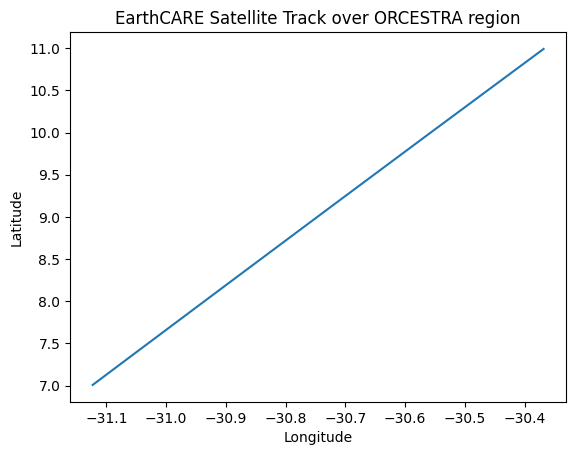

In [15]:

plt.style.use('default')
plt.plot(ds_ec_orc.lon, ds_ec_orc.lat)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('EarthCARE Satellite Track over ORCESTRA region')
plt.show()


In [12]:

print(ds_ec.longitude.min().values, ds_ec.longitude.max().values)
print(ds_ec.latitude.min().values, ds_ec.latitude.max().values)

-36.77469407066508 -28.092698790642174
-22.495799585453383 22.48955028296846


In [80]:

ds_ec_orc

<xarray.Dataset> Size: 17MB
Dimensions:                 (time: 431, height: 206)
Coordinates:
  * time                    (time) object 3kB 2024-09-03T16:08:25.639902+00:0...
    height                  (time, height) float32 355kB 2e+04 ... -500.0
    lon                     (time) float64 3kB -30.37 -30.37 ... -31.12 -31.12
    lat                     (time) float64 3kB 10.99 10.98 10.97 ... 7.019 7.007
Data variables: (12/52)
    longitude               (time) float64 3kB -30.37 -30.37 ... -31.12 -31.12
    latitude                (time) float64 3kB 10.99 10.98 10.97 ... 7.019 7.007
    altitude                (time, height) float32 355kB 2e+04 ... -500.0
    pressure                (time, height) float32 355kB -9.999e+03 ... -9.99...
    temperature             (time, height) float32 355kB -9.999e+03 ... -9.99...
    relhum_1km              (time, height) float32 355kB -9.999e+03 ... -9.99...
    ...                      ...
    tinc_10km               (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tinc_1km                (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tcwnc_10km              (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tcwnc_1km               (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    refl_cpr_10km           (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    refl_cpr_1km            (time, height) float32 355kB 9.969e+36 ... 9.969e+36

In [81]:

ds_ec_orc.tinc_1km.max().values

array(9.96921e+36, dtype=float32)

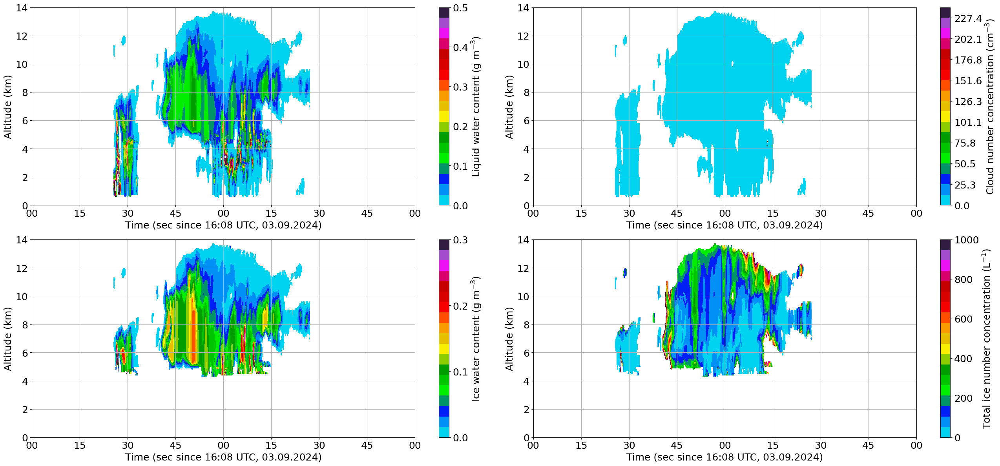

In [16]:

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)


#ds_ec_orc = ds_ec.sel(lon=slice(-32, -28), lat=slice(7, 11))

ds_ec_orc.lwc1_1km

mask_lwc = (ds_ec_orc.lwc1_1km > 0.) & (ds_ec_orc.lwc1_1km < 12.)
mask_tinc = (ds_ec_orc.tinc_1km > 0.) & (ds_ec_orc.tinc_1km != 9.96921e+36)
mask_iwc = (ds_ec_orc.iwc_1km > 0.) & (ds_ec_orc.iwc_1km != 9.96921e+36)
mask_tcwnc = (ds_ec_orc.cld_number_conc1_1km > 0.) & (ds_ec_orc.cld_number_conc1_1km != 9.96921e+36)
#mask_tcwnc = (ds_ec_orc.tcwnc_1km > 0.) & (ds_ec_orc.tcwnc_1km != 9.96921e+36)

filt_lwc1_1km = xr.where(mask_lwc, ds_ec_orc.lwc1_1km, np.nan)
filt_tinc_1km = xr.where(mask_tinc, ds_ec_orc.tinc_1km, np.nan)
filt_iwc_1km = xr.where(mask_iwc, ds_ec_orc.iwc_1km, np.nan)
filt_tcwnc_1km = xr.where(mask_tcwnc, ds_ec_orc.cld_number_conc1_1km, np.nan)
#filt_tcwnc_1km = xr.where(mask_tcwnc, ds_ec_orc.tcwnc_1km, np.nan)

fnt=18
lev_lwc = np.linspace(0, 0.5, 20)
lev_iwc = np.linspace(0, 0.3, 20)
lev_tinc = np.linspace(0, 1000, 20)
lev_tcwnc = np.linspace(0, 240, 20)

plt.figure(figsize=(26,12))
plt.style.use('default')

plt.subplot(2,2,1)
cnt=plt.contourf(ds_ec_orc.time, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_lwc1_1km.T, levels=lev_lwc, cmap='pyart_NWSRef')#'HomeyerRainbow')
colorbar = plt.colorbar(cnt, ticks=[0, 0.1, 0.2, 0.3, 0.4, 0.5], label='Liquid water content (g m$^{-3}$)')
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Liquid water content (g m$^{-3}$)', size=fnt)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%S'))
start_date = datetime(2024, 9, 3, 16, 8) 
end_date = datetime(2024, 9, 3, 16, 10)
plt.ylim(0, 14.)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Time (sec since 16:08 UTC, 03.09.2024)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.grid()

plt.subplot(2,2,2)
cnt=plt.contourf(ds_ec_orc.time, 1.e-3*ds_ec_orc.altitude.mean('time'), 1.e-6*filt_tcwnc_1km.T, levels=lev_tcwnc, cmap='pyart_NWSRef')#'HomeyerRainbow')
colorbar = plt.colorbar(cnt, label='Cloud number concentration (cm$^{-3}$)')
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Cloud number concentration (cm$^{-3}$)', size=fnt)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%S'))
start_date = datetime(2024, 9, 3, 16, 8) 
end_date = datetime(2024, 9, 3, 16, 10)
plt.ylim(0, 14.)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Time (sec since 16:08 UTC, 03.09.2024)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.grid()

plt.subplot(2,2,3)
cnt=plt.contourf(ds_ec_orc.time, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_iwc_1km.T, levels=lev_iwc, cmap='pyart_NWSRef')#'HomeyerRainbow')
colorbar = plt.colorbar(cnt, ticks=[0, 0.1, 0.2, 0.3], label='Ice water content (g m$^{-3}$)')
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Ice water content (g m$^{-3}$)', size=fnt)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%S'))
start_date = datetime(2024, 9, 3, 16, 8) 
end_date = datetime(2024, 9, 3, 16, 10)
plt.ylim(0, 14.)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Time (sec since 16:08 UTC, 03.09.2024)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.grid()

plt.subplot(2,2,4)
cnt=plt.contourf(ds_ec_orc.time, 1.e-3*ds_ec_orc.altitude.mean('time'), 1.e-3*filt_tinc_1km.T, levels=lev_tinc, cmap='pyart_NWSRef')#'HomeyerRainbow')
colorbar = plt.colorbar(cnt, ticks=[0, 200, 400, 600, 800, 1000], label='Total ice number concentration (L$^{-1}$)')
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Total ice number concentration (L$^{-1}$)', size=fnt)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%S'))
start_date = datetime(2024, 9, 3, 16, 8) 
end_date = datetime(2024, 9, 3, 16, 10)
plt.ylim(0, 14.)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Time (sec since 16:08 UTC, 03.09.2024)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.grid()

plt.tight_layout()
plt.show()

In [14]:

plt.hist(filt_clwer_1km.values.flatten())

NameError: name 'filt_clwer_1km' is not defined

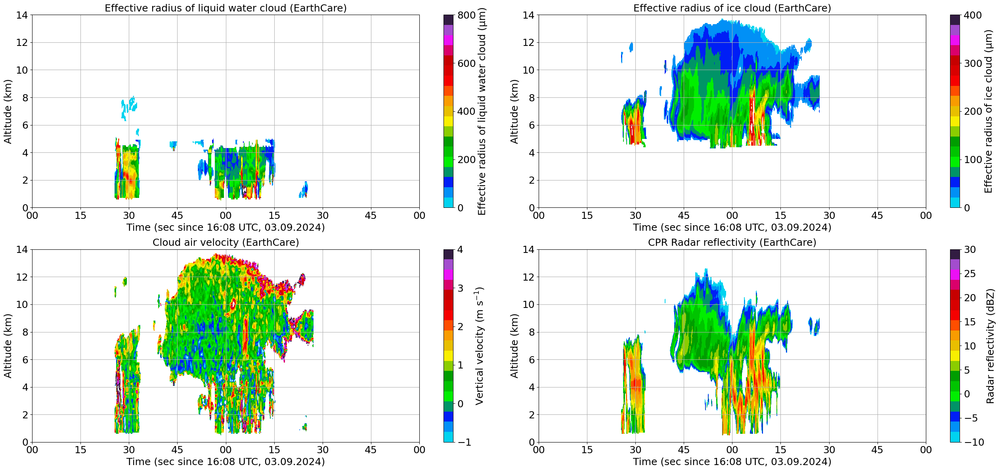

In [17]:


ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)


#ds_ec_orc = ds_ec.sel(lon=slice(-32, -28), lat=slice(7, 11))

ds_ec_orc.lwc1_1km

mask_clwer = (ds_ec_orc.clwer_1km > 0.) & (ds_ec_orc.clwer_1km != 9.96921e+36)
mask_cier = (ds_ec_orc.cier_1km > 0.) & (ds_ec_orc.cier_1km <= 300.) #!= 9.96921e+36)

mask_vertvel = (ds_ec_orc.cld_air_vel_1km > -10.) & (ds_ec_orc.cld_air_vel_1km != 9.96921e+36)
mask_refl = (ds_ec_orc.refl_cpr_1km > -10.) & (ds_ec_orc.refl_cpr_1km != 9.96921e+36)
#mask_tcwnc = (ds_ec_orc.tcwnc_1km > 0.) & (ds_ec_orc.tcwnc_1km != 9.96921e+36)

filt_clwer_1km = xr.where(mask_clwer, ds_ec_orc.clwer_1km, np.nan)
filt_cier_1km = xr.where(mask_cier, ds_ec_orc.cier_1km, np.nan)
filt_vertvel_1km = xr.where(mask_vertvel, ds_ec_orc.cld_air_vel_1km, np.nan)
filt_refl_1km = xr.where(mask_refl, ds_ec_orc.refl_cpr_1km, np.nan)
#filt_tcwnc_1km = xr.where(mask_tcwnc, ds_ec_orc.tcwnc_1km, np.nan)

fnt=18
lev_clwer = np.linspace(0, 800, 20)
lev_cier = np.linspace(0, 400, 20)
lev_vertvel = np.linspace(-1, 4, 20)
lev_refl = np.linspace(-10, 30, 20)

plt.figure(figsize=(26,12))
plt.style.use('default')

plt.subplot(2,2,1)
cnt=plt.contourf(ds_ec_orc.time, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_clwer_1km.T, levels=lev_clwer, cmap='pyart_NWSRef')#'HomeyerRainbow')
colorbar = plt.colorbar(cnt, ticks=[0, 200, 400, 600, 800], label='Cloud water effective radius (µm)')
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Effective radius of liquid water cloud (µm)', size=fnt)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%S'))
start_date = datetime(2024, 9, 3, 16, 8) 
end_date = datetime(2024, 9, 3, 16, 10)
plt.ylim(0, 14.)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Time (sec since 16:08 UTC, 03.09.2024)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Effective radius of liquid water cloud (EarthCare)', fontsize=fnt)
plt.grid()

plt.subplot(2,2,2)
cnt=plt.contourf(ds_ec_orc.time, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')#'HomeyerRainbow')
colorbar = plt.colorbar(cnt, ticks=[0, 100, 200, 300, 400], label='Cloud ice effective radius (µm)')
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Effective radius of ice cloud (µm)', size=fnt)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%S'))
start_date = datetime(2024, 9, 3, 16, 8) 
end_date = datetime(2024, 9, 3, 16, 10)
plt.ylim(0, 14.)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Time (sec since 16:08 UTC, 03.09.2024)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Effective radius of ice cloud (EarthCare)', fontsize=fnt)
plt.grid()

plt.subplot(2,2,3)
cnt=plt.contourf(ds_ec_orc.time, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_vertvel_1km.T, levels=lev_vertvel, cmap='pyart_NWSRef')#'HomeyerRainbow')
colorbar = plt.colorbar(cnt, ticks=[-1, 0, 1, 2, 3, 4])#, label='Ice water content (g m$^{-3}$)')
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Vertical velocity (m s$^{-1}$)', size=fnt)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%S'))
start_date = datetime(2024, 9, 3, 16, 8) 
end_date = datetime(2024, 9, 3, 16, 10)
plt.ylim(0, 14.)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Time (sec since 16:08 UTC, 03.09.2024)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Cloud air velocity (EarthCare)', fontsize=fnt)
plt.grid()

plt.subplot(2,2,4)
cnt=plt.contourf(ds_ec_orc.time, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_refl_1km.T, levels=lev_refl, cmap='pyart_NWSRef')#'HomeyerRainbow')
colorbar = plt.colorbar(cnt, ticks=[-10, -5, 0, 5, 10, 15, 20, 25, 30])#, label='Total ice number concentration (L$^{-1}$)')
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Radar reflectivity (dBZ)', size=fnt)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%S'))
start_date = datetime(2024, 9, 3, 16, 8) 
end_date = datetime(2024, 9, 3, 16, 10)
plt.ylim(0, 14.)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Time (sec since 16:08 UTC, 03.09.2024)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('CPR Radar reflectivity (EarthCare)', fontsize=fnt)
plt.grid()

plt.tight_layout()
plt.show()

In [54]:
ds_ec_orc.iwp_1km

<xarray.DataArray 'iwp_1km' (time: 431)> Size: 2kB
array([ 2.77468252e+00,  3.10788631e+00,  2.06720567e+00,  1.04566059e+01,
        2.66209927e+01,  4.03766708e+01,  4.00684479e+02,  5.39006409e+02,
        3.62311890e+02,  3.54127258e+02,  1.20259018e+02,  1.32521912e+02,
        7.66445160e+01,  1.09238029e+02,  1.43341385e+02,  1.70920609e+02,
        1.97548523e+02,  2.32264648e+02,  2.54665115e+02,  2.91644928e+02,
        3.24601929e+02,  3.45888214e+02,  3.17154633e+02,  3.06818085e+02,
        2.61243134e+02,  2.18698273e+02,  2.18903397e+02,  1.97493118e+02,
        1.75400391e+02,  2.92639435e+02,  2.18055084e+02,  2.28843674e+02,
        2.11800537e+02,  2.05726944e+02,  2.32285980e+02,  2.43626480e+02,
        2.78382843e+02,  2.41848328e+02,  1.80455078e+02,  1.15560951e+02,
        8.66410599e+01,  8.01063232e+01,  6.17237396e+01,  3.89504967e+01,
        2.88018532e+01,  2.10432968e+01,  1.78271236e+01,  1.84854202e+01,
        1.29785538e+01,  1.93312054e+01,  1.67782307e+01,  2.91113968e+01,
        1.53552265e+01,  7.25558615e+00,  1.36083412e+00,  4.40963238e-01,
        8.49897638e-02,  0.00000000e+00, -9.99900000e+03,  0.00000000e+00,
       -9.99900000e+03, -9.99900000e+03, -9.99900000e+03, -9.99900000e+03,
       -9.99900000e+03, -9.99900000e+03, -9.99900000e+03, -9.99900000e+03,
       -9.99900000e+03, -9.99900000e+03, -9.99900000e+03, -9.99900000e+03,
       -9.99900000e+03, -9.99900000e+03, -9.99900000e+03, -9.99900000e+03,
       -9.99900000e+03, -9.99900000e+03, -9.99900000e+03, -9.99900000e+03,
...
        2.60867401e+02,  2.45205429e+02,  2.43322372e+02,  2.43150711e+02,
        2.56088531e+02,  2.73292938e+02,  2.71788757e+02,  2.41057343e+02,
        2.08653183e+02,  1.82558472e+02,  1.49773514e+02,  1.36091736e+02,
        1.23689583e+02,  1.04692764e+02,  7.70276871e+01,  5.37628975e+01,
        4.40431099e+01,  4.29117470e+01,  4.14177170e+01,  3.62537651e+01,
        2.54409142e+01,  1.63707085e+01,  9.08590317e+00,  7.94890356e+00,
        8.68195915e+00,  8.83008289e+00,  8.09955788e+00,  1.12181025e+01,
        1.14880848e+01,  1.12700510e+01,  1.24827166e+01,  1.16500387e+01,
        7.92954731e+00,  4.97255468e+00,  4.55801010e+00,  3.58521700e+00,
        4.24809885e+00,  3.24657750e+00,  3.58287120e+00,  1.82806277e+00,
        2.32997799e+00,  3.12360477e+00,  4.67959547e+00,  6.12361288e+00,
        7.18382740e+00,  7.84456730e+00,  9.98402786e+00,  9.89185905e+00,
        1.13101854e+01,  1.37374973e+01,  1.24626675e+01,  1.77965660e+01,
        1.93603535e+01,  3.05506039e+01,  4.19853630e+01,  5.44621315e+01,
        6.86165314e+01,  7.20749664e+01,  7.72068100e+01,  6.54547424e+01,
        4.71272545e+01,  3.51616783e+01,  2.06612778e+01,  1.53546810e+01,
        1.63747005e+01,  1.83672028e+01,  2.56698456e+01,  3.41482620e+01,
        4.42329750e+01,  6.13044281e+01,  7.30051422e+01,  7.77667465e+01,
        7.03936539e+01,  5.90173111e+01,  4.38227577e+01,  3.82420998e+01,
        4.09954605e+01,  3.62429886e+01,  4.59180450e+01], dtype=float32)
Coordinates:
  * time     (time) object 3kB 2024-09-03T16:08:25.639902+00:00 ... 2024-09-0...
    lon      (time) float64 3kB -30.37 -30.37 -30.37 ... -31.12 -31.12 -31.12
    lat      (time) float64 3kB 10.99 10.98 10.97 10.96 ... 7.028 7.019 7.007

0.00022397167 0.9320307
0.00022397167 0.9320307


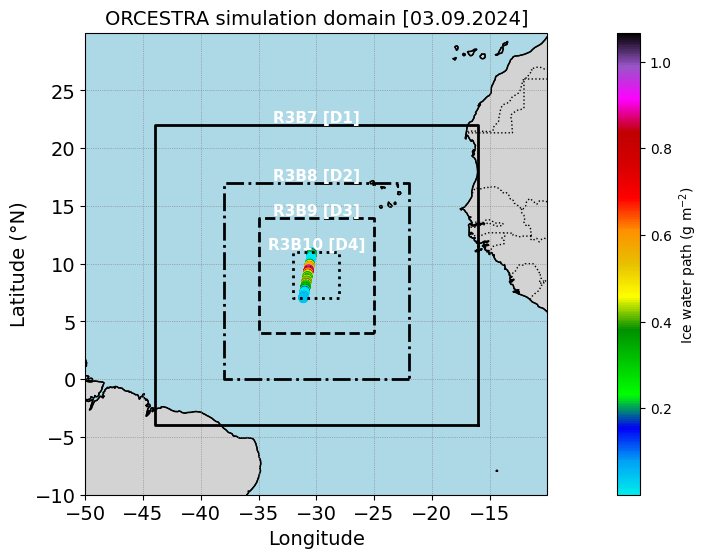

In [7]:

mask_iwp = (ds_ec_orc.iwp_1km > 0.) & (ds_ec_orc.iwp_1km != 9.96921e+36)
filt_iwp_1km = xr.where(mask_iwp, ds_ec_orc.iwp_1km, np.nan)

## ORCESTRA 3 Sept 2024 domain

lon1 = [-16., -44.];
lat1 = [-4., 22.];

lon2 = [-22., -38.];
lat2 = [-0., 17.];
#lat2 = [-0.85, 17.];

lon3 = [-25., -35.];
lat3 = [4, 14.];

lon4 = [-28., -32.];
lat4 = [7., 11.];

lev = np.linspace(0, 1, 15)
fnt=14;

fig, ax = plt.subplots(figsize=(18, 6), subplot_kw={'projection': ccrs.PlateCarree()})


# Add coastlines and features for context
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS, linestyle=':')


ax.plot([lon1[0], lon1[1], lon1[1], lon1[0], lon1[0]], 
        [lat1[0], lat1[0], lat1[1], lat1[1], lat1[0]], 
        color='black', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())

ax.plot([lon2[0], lon2[1], lon2[1], lon2[0], lon2[0]], 
        [lat2[0], lat2[0], lat2[1], lat2[1], lat2[0]], 
        color='black', linewidth=2, linestyle='-.', transform=ccrs.PlateCarree())

ax.plot([lon3[0], lon3[1], lon3[1], lon3[0], lon3[0]], 
        [lat3[0], lat3[0], lat3[1], lat3[1], lat3[0]], 
        color='black', linewidth=2, linestyle='--', transform=ccrs.PlateCarree())

ax.plot([lon4[0], lon4[1], lon4[1], lon4[0], lon4[0]], 
        [lat4[0], lat4[0], lat4[1], lat4[1], lat4[0]], 
        color='black', linewidth=2, linestyle=':', transform=ccrs.PlateCarree())

cnt=plt.scatter(ds_ec_orc.lon, ds_ec_orc.lat, c=1.e-3*filt_iwp_1km, cmap='pyart_NWSRef')#'HomeyerRainbow')#'pyart_NWSRef')
plt.colorbar(cnt, ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], label='Ice water path (g m$^{-2}$) ')
ax.text(-30., 22.2, "R3B7 [D1]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')
ax.text(-30., 17.2, "R3B8 [D2]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')
ax.text(-30., 14.2, "R3B9 [D3]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')
ax.text(-30., 11.2, "R3B10 [D4]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')

ax.set_xlim(-50., -10.)
ax.set_ylim(-10., 30.)
ax.set_xticks(range(-50, -10, 5))  
ax.set_yticks(range(-10, 30, 5))

#ax.set_xlim(-180., 180.)
#ax.set_ylim(-90., 90.)
#ax.set_xticks(range(-180, 180, 30))  
#ax.set_yticks(range(-90, 90, 30))

ax.tick_params(axis='x', labelsize=fnt)
ax.tick_params(axis='y', labelsize=fnt)
ax.set_xlabel("Longitude", fontsize=fnt)
ax.set_ylabel("Latitude (°N)", fontsize=fnt)
ax.grid(True, linestyle=':', linewidth=0.5, color='grey')
ax.set_title('ORCESTRA simulation domain [03.09.2024]', fontsize=fnt)#, fontweight='bold')

# Add oceans and continents features
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')

#ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')
#ax.text(-30, 26, "Atlantic Ocean", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='white')
#ax.text(-14, 14, "Senegal", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='blue')
#ax.text(-46, -8, "Brazil", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='blue')


#ax.text(-38, 1, "EC overpass1", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
#ax.text(-39, -1, "[04:06-04:10 UTC]", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
#ax.text(-19, -6, "EC overpass2", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
#ax.text(-19, -8, "[14:55-14:59 UTC]", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
#plt.colorbar(label='CLWP (kg m$^{-2}$)')

plt.show()

In [18]:
file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/lwp_iwp/GW1AM2_202409030345_218D_L2SGCLWLD2220220.h5'

# Open the HDF5 file
with h5py.File(file, 'r') as f:
    geophysical_gcom_data = f['Geophysical Data'][:]        # 3D (1976, 243, 1)
    #The original geophysical_data is in g/m2 (although defined as kg/m2) and its scale factor is given, apply it later 
    #to get 'true' CLWP 
    #geophysical_data = geophysical_data * g_data.attrs['SCALE FACTOR'][0]
    lat_gcom_0345 = f['Latitude of Observation Point'][:]   # 2D (1976, 243)
    lon_gcom_0345 = f['Longitude of Observation Point'][:]  # 2D (1976, 243)
    tim_gcom_0345 = f['Scan Time'][:]                       # 1D (1976)
    scan_gcom_time = f['Scan Time']
    g_gcom_data = f['Geophysical Data']
    for key in g_gcom_data.attrs.keys():                 
        print(f"{key}: {g_gcom_data.attrs[key]}")
    for key in scan_gcom_time.attrs.keys():                 # check the unit of time used
        print(f"{key}: {scan_gcom_time.attrs[key]}")

#time_hr_0345 = np.linspace(3.45, 4.34, 1976)

scale_gcom_factor = 0.001 # from the description of the data
# Extract LWP data and convert to float32
lwp_gcom_0345 = scale_gcom_factor*geophysical_gcom_data[:, :, 0].astype(np.float32) # 2D (1976, 243) [True CLWP in kg/m2]
lwp_gcom_0345[lwp_gcom_0345 < 0.] = np.nan

file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/lwp_iwp/GW1AM2_202409031427_081A_L2SGCLWLD2220220.h5'

# Open the HDF5 file
with h5py.File(file, 'r') as f:
    geophysical_gcom_data = f['Geophysical Data'][:]        # 3D (1976, 243, 1)
    lat_gcom_1427 = f['Latitude of Observation Point'][:]   # 2D (1976, 243)
    lon_gcom_1427 = f['Longitude of Observation Point'][:]  # 2D (1976, 243)
    tim_gcom_1427 = f['Scan Time'][:]                       # 1D (1976)
    #The original geophysical_data is in g/m2 (although defined as kg/m2) and its scale factor is given, apply it to get 'true' CLWP 
    #geophysical_data = geophysical_data * g_data.attrs['SCALE FACTOR'][0]
    scan_gcom_time = f['Scan Time']
    g_gcom_data = f['Geophysical Data']
    for key in g_gcom_data.attrs.keys():                 
        print(f"{key}: {g_gcom_data.attrs[key]}")
    for key in scan_gcom_time.attrs.keys():                 # check the unit of time used
        print(f"{key}: {scan_gcom_time.attrs[key]}")

#time_hr_1427 = np.linspace(14.27, 15.17, 1976)


scale_gcom_factor = 0.001 # from the description of the data

# Extract LWP data and convert to float32
lwp_gcom_1427 = scale_gcom_factor*geophysical_gcom_data[:, :, 0].astype(np.float32) # 2D (1976, 243) [True CLWP in kg/m2]
lwp_gcom_1427[lwp_gcom_1427 < 0.] = np.nan


SCALE FACTOR: [0.001]
UNIT: [b'Kg/m2']
SCALE FACTOR: [1.]
UNIT: [b'sec']
SCALE FACTOR: [0.001]
UNIT: [b'Kg/m2']
SCALE FACTOR: [1.]
UNIT: [b'sec']


In [19]:
### GCOM path

import numpy as np
import matplotlib.pyplot as plt
import h5py
from datetime import datetime

file_0345 = '/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/lwp_iwp/GW1AM2_202409030345_218D_L2SGCLWLD2220220.h5'
file_1427 = '/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/lwp_iwp/GW1AM2_202409031427_081A_L2SGCLWLD2220220.h5'

# Open the HDF5 file
with h5py.File(file_0345, 'r') as f:
    geophysical_data = f['Geophysical Data'][:]        # 3D (1976, 243, 1)
    #The original geophysical_data is in g/m2 (although defined as kg/m2) and its scale factor is given, apply it later 
    #to get 'true' CLWP 
    #geophysical_data = geophysical_data * g_data.attrs['SCALE FACTOR'][0]
    lat_0345 = f['Latitude of Observation Point'][:]   # 2D (1976, 243)
    lon_0345 = f['Longitude of Observation Point'][:]  # 2D (1976, 243)
    tim_0345 = f['Scan Time'][:]                       # 1D (1976)
    scan_time = f['Scan Time']
    g_data = f['Geophysical Data']
    for key in g_data.attrs.keys():                 
        print(f"{key}: {g_data.attrs[key]}")
    for key in scan_time.attrs.keys():                 # check the unit of time used
        print(f"{key}: {scan_time.attrs[key]}")

#time_hr_0345 = np.linspace(3.45, 4.34, 1976)

scale_factor = 0.001 # from the description of the data
# Extract LWP data and convert to float32
lwp_0345 = scale_factor*geophysical_data[:, :, 0].astype(np.float32) # 2D (1976, 243) [True CLWP in kg/m2]
lwp_0345[lwp_0345 < 0.] = np.nan

# Satellite time (epoch) starts from 01.01.1993, so time_0345 is actually recorded in seconds, say from epoch
# Get this converted to dd.mm.yyyy.hh.mm.ss format 
unix_seconds = tim_0345[0]
epoch_ec = datetime(1993, 1, 1, tzinfo=timezone.utc)
dt = epoch_ec + timedelta(seconds=float(unix_seconds))

time_ec0345 = np.array([epoch_ec + timedelta(seconds=float(s)) for s in tim_0345])

### Resample this data for ORCESTRA region
lon_min, lon_max = -32., -28.
lat_min, lat_max = 7, 11

mask_orc0345 = (lon_0345 >= lon_min) & (lon_0345 <= lon_max) & (lat_0345 >= lat_min) & (lat_0345 <= lat_max)

# Get indices of mask to get 'time' for which the EC sampled the ORCESTRA region: Update, this is not really needed as 
#time_ec0345 is enough for the selected region
indices_i, indices_j = np.where(mask_orc0345)
time_ec_orc = tim_0345[indices_j]

# Longitude & Latitude
lon_ec_orc0345 = np.ma.masked_where(~mask_orc0345, lon_0345)
lat_ec_orc0345 = np.ma.masked_where(~mask_orc0345, lat_0345)

#unix_seconds = time_ec_orc[0]
#time_ec_orc = np.array([epoch_ec + timedelta(seconds=float(s)) for s in time_ec_orc])

# Get lwp
lwp_ec_orc0345 = np.ma.masked_where(~mask_orc0345, lwp_0345)




# Open the HDF5 file
with h5py.File(file_1427, 'r') as f:
    geophysical_data = f['Geophysical Data'][:]        # 3D (1976, 243, 1)
    lat_1427 = f['Latitude of Observation Point'][:]   # 2D (1976, 243)
    lon_1427 = f['Longitude of Observation Point'][:]  # 2D (1976, 243)
    tim_1427 = f['Scan Time'][:]                       # 1D (1976)
    #The original geophysical_data is in g/m2 (although defined as kg/m2) and its scale factor is given, apply it to get 'true' CLWP 
    #geophysical_data = geophysical_data * g_data.attrs['SCALE FACTOR'][0]
    scan_time = f['Scan Time']
    g_data = f['Geophysical Data']
    for key in g_data.attrs.keys():                 
        print(f"{key}: {g_data.attrs[key]}")
    for key in scan_time.attrs.keys():                 # check the unit of time used
        print(f"{key}: {scan_time.attrs[key]}")

#time_hr_1427 = np.linspace(14.27, 15.17, 1976)


scale_factor = 0.001 # from the description of the data

# Extract LWP data and convert to float32
lwp_1427 = scale_factor*geophysical_data[:, :, 0].astype(np.float32) # 2D (1976, 243) [True CLWP in kg/m2]
lwp_1427[lwp_1427 < 0.] = np.nan

# Satellite time (epoch) starts from 01.01.1993, so time_1427 is actually recorded in seconds, say from epoch
# Get this converted to dd.mm.yyyy.hh.mm.ss format 
unix_seconds = tim_1427[0]
epoch_ec = datetime(1993, 1, 1, tzinfo=timezone.utc)
dt = epoch_ec + timedelta(seconds=float(unix_seconds))

time_ec1427 = np.array([epoch_ec + timedelta(seconds=float(s)) for s in tim_1427])

### Resample this data for ORCESTRA region
lon_min, lon_max = -32., -28.
lat_min, lat_max = 7, 11

mask_orc1427 = (lon_1427 >= lon_min) & (lon_1427 <= lon_max) & (lat_1427 >= lat_min) & (lat_1427 <= lat_max)

# Get indices of mask to get 'time' for which the EC sampled the ORCESTRA region: Update, this is not really needed as 
#time_ec1427 is enough for the selected region
indices_i, indices_j = np.where(mask_orc1427)
time_ec_orc = tim_1427[indices_j]

# Longitude & Latitude
lon_ec_orc = np.ma.masked_where(~mask_orc1427, lon_1427)
lat_ec_orc = np.ma.masked_where(~mask_orc1427, lat_1427)

#unix_seconds = time_ec_orc[0]
#time_ec_orc = np.array([epoch_ec + timedelta(seconds=float(s)) for s in time_ec_orc])

# Get lwp
lwp_ec_orc1427 = np.ma.masked_where(~mask_orc1427, lwp_1427)


SCALE FACTOR: [0.001]
UNIT: [b'Kg/m2']
SCALE FACTOR: [1.]
UNIT: [b'sec']
SCALE FACTOR: [0.001]
UNIT: [b'Kg/m2']
SCALE FACTOR: [1.]
UNIT: [b'sec']


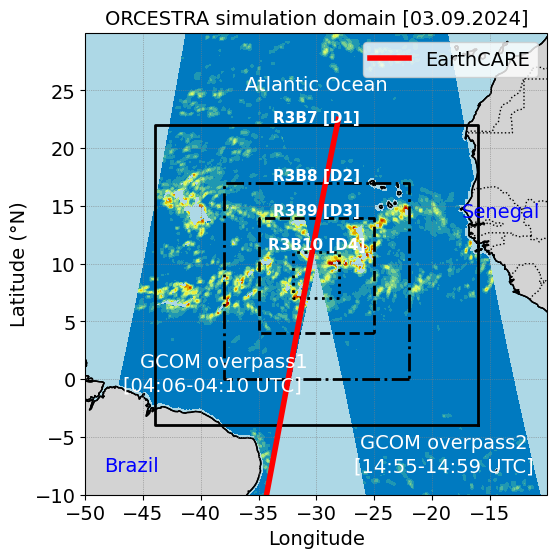

In [20]:


mask_ec_orc_iwp = (ds_ec_orc.iwp_1km > 0.) & (ds_ec_orc.iwp_1km != 9.96921e+36)
filt_iwp_ec_orc_1km = xr.where(mask_ec_orc_iwp, ds_ec_orc.iwp_1km, np.nan)

mask_ec_iwp = (ds_ec.iwp_1km > 0.) & (ds_ec.iwp_1km != 9.96921e+36)
filt_iwp_ec_1km = xr.where(mask_ec_iwp, ds_ec.iwp_1km, np.nan)

## ORCESTRA 3 Sept 2024 domain

lon1 = [-16., -44.];
lat1 = [-4., 22.];

lon2 = [-22., -38.];
lat2 = [-0., 17.];
#lat2 = [-0.85, 17.];

lon3 = [-25., -35.];
lat3 = [4, 14.];

lon4 = [-28., -32.];
lat4 = [7., 11.];

lev = np.linspace(0, 1, 15)
fnt=14;

plt.style.use('default')

fig, ax = plt.subplots(figsize=(18, 6), subplot_kw={'projection': ccrs.PlateCarree()})


# Add coastlines and features for context
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS, linestyle=':')


ax.plot([lon1[0], lon1[1], lon1[1], lon1[0], lon1[0]], 
        [lat1[0], lat1[0], lat1[1], lat1[1], lat1[0]], 
        color='black', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())

ax.plot([lon2[0], lon2[1], lon2[1], lon2[0], lon2[0]], 
        [lat2[0], lat2[0], lat2[1], lat2[1], lat2[0]], 
        color='black', linewidth=2, linestyle='-.', transform=ccrs.PlateCarree())

ax.plot([lon3[0], lon3[1], lon3[1], lon3[0], lon3[0]], 
        [lat3[0], lat3[0], lat3[1], lat3[1], lat3[0]], 
        color='black', linewidth=2, linestyle='--', transform=ccrs.PlateCarree())

ax.plot([lon4[0], lon4[1], lon4[1], lon4[0], lon4[0]], 
        [lat4[0], lat4[0], lat4[1], lat4[1], lat4[0]], 
        color='black', linewidth=2, linestyle=':', transform=ccrs.PlateCarree())

plt.contourf(lon_0345, lat_0345, lwp_0345, levels=lev, shading='auto', cmap='pyart_HomeyerRainbow')#'HomeyerRainbow')#'pyart_NWSRef')
plt.contourf(lon_1427, lat_1427, lwp_1427, levels=lev, shading='auto', cmap='pyart_HomeyerRainbow')#'HomeyerRainbow')#'pyart_NWSRef')

ax.text(-30., 22.2, "R3B7 [D1]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')
ax.text(-30., 17.2, "R3B8 [D2]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')
ax.text(-30., 14.2, "R3B9 [D3]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')
ax.text(-30., 11.2, "R3B10 [D4]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')

#cnt=plt.scatter(ds_ec_orc.lon, ds_ec_orc.lat, c=1.e-3*filt_iwp_ec_1km, cmap='pyart_NWSRef')
#plt.plot(ds_ec_orc.lon, ds_ec_orc.lat, color='black')
plt.plot(ds_ec.lon, ds_ec.lat, 'r-', linewidth=4, label='EarthCARE')

plt.legend(frameon=True, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

ax.set_xlim(-50., -10.)
ax.set_ylim(-10., 30.)
ax.set_xticks(range(-50, -10, 5))  
ax.set_yticks(range(-10, 30, 5))

#ax.set_xlim(-180., 180.)
#ax.set_ylim(-90., 90.)
#ax.set_xticks(range(-180, 180, 30))  
#ax.set_yticks(range(-90, 90, 30))

ax.tick_params(axis='x', labelsize=fnt)
ax.tick_params(axis='y', labelsize=fnt)
ax.set_xlabel("Longitude", fontsize=fnt)
ax.set_ylabel("Latitude (°N)", fontsize=fnt)
ax.grid(True, linestyle=':', linewidth=0.5, color='grey')
ax.set_title('ORCESTRA simulation domain [03.09.2024]', fontsize=fnt)#, fontweight='bold')

# Add oceans and continents features
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')

ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')
ax.text(-30, 25, "Atlantic Ocean", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='white')
ax.text(-14, 14, "Senegal", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='blue')
ax.text(-46, -8, "Brazil", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='blue')


ax.text(-38, 1, "GCOM overpass1", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
ax.text(-39, -1, "[04:06-04:10 UTC]", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
ax.text(-19, -6, "GCOM overpass2", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
ax.text(-19, -8, "[14:55-14:59 UTC]", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
#plt.colorbar(label='CLWP (kg m$^{-2}$)')

plt.show()

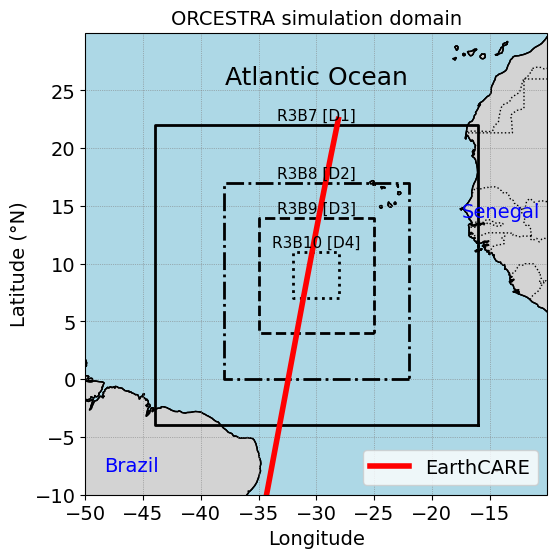

In [12]:


mask_ec_orc_iwp = (ds_ec_orc.iwp_1km > 0.) & (ds_ec_orc.iwp_1km != 9.96921e+36)
filt_iwp_ec_orc_1km = xr.where(mask_ec_orc_iwp, ds_ec_orc.iwp_1km, np.nan)

mask_ec_iwp = (ds_ec.iwp_1km > 0.) & (ds_ec.iwp_1km != 9.96921e+36)
filt_iwp_ec_1km = xr.where(mask_ec_iwp, ds_ec.iwp_1km, np.nan)

## ORCESTRA 3 Sept 2024 domain

lon1 = [-16., -44.];
lat1 = [-4., 22.];

lon2 = [-22., -38.];
lat2 = [-0., 17.];
#lat2 = [-0.85, 17.];

lon3 = [-25., -35.];
lat3 = [4, 14.];

lon4 = [-28., -32.];
lat4 = [7., 11.];

lev = np.linspace(0, 1, 15)
fnt=14;

fig, ax = plt.subplots(figsize=(18, 6), subplot_kw={'projection': ccrs.PlateCarree()})


# Add coastlines and features for context
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS, linestyle=':')


ax.plot([lon1[0], lon1[1], lon1[1], lon1[0], lon1[0]], 
        [lat1[0], lat1[0], lat1[1], lat1[1], lat1[0]], 
        color='black', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())

ax.plot([lon2[0], lon2[1], lon2[1], lon2[0], lon2[0]], 
        [lat2[0], lat2[0], lat2[1], lat2[1], lat2[0]], 
        color='black', linewidth=2, linestyle='-.', transform=ccrs.PlateCarree())

ax.plot([lon3[0], lon3[1], lon3[1], lon3[0], lon3[0]], 
        [lat3[0], lat3[0], lat3[1], lat3[1], lat3[0]], 
        color='black', linewidth=2, linestyle='--', transform=ccrs.PlateCarree())

ax.plot([lon4[0], lon4[1], lon4[1], lon4[0], lon4[0]], 
        [lat4[0], lat4[0], lat4[1], lat4[1], lat4[0]], 
        color='black', linewidth=2, linestyle=':', transform=ccrs.PlateCarree())

#plt.contourf(lon_0345, lat_0345, lwp_0345, levels=lev, shading='auto', cmap='pyart_HomeyerRainbow')#'HomeyerRainbow')#'pyart_NWSRef')
#plt.contourf(lon_1427, lat_1427, lwp_1427, levels=lev, shading='auto', cmap='pyart_HomeyerRainbow')#'HomeyerRainbow')#'pyart_NWSRef')

ax.text(-30., 22.4, "R3B7 [D1]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='k')#, fontweight='bold')
ax.text(-30., 17.4, "R3B8 [D2]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='k')#, fontweight='bold')
ax.text(-30., 14.4, "R3B9 [D3]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='k')#, fontweight='bold')
ax.text(-30., 11.4, "R3B10 [D4]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='k')#, fontweight='bold')

#cnt=plt.scatter(ds_ec_orc.lon, ds_ec_orc.lat, c=1.e-3*filt_iwp_ec_1km, cmap='pyart_NWSRef')
#plt.plot(ds_ec_orc.lon, ds_ec_orc.lat, color='black')
plt.plot(ds_ec.lon, ds_ec.lat, 'r-', linewidth=4, label='EarthCARE')

plt.legend(frameon=True, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

ax.set_xlim(-50., -10.)
ax.set_ylim(-10., 30.)
ax.set_xticks(range(-50, -10, 5))  
ax.set_yticks(range(-10, 30, 5))

#ax.set_xlim(-180., 180.)
#ax.set_ylim(-90., 90.)
#ax.set_xticks(range(-180, 180, 30))  
#ax.set_yticks(range(-90, 90, 30))

ax.tick_params(axis='x', labelsize=fnt)
ax.tick_params(axis='y', labelsize=fnt)
ax.set_xlabel("Longitude", fontsize=fnt)
ax.set_ylabel("Latitude (°N)", fontsize=fnt)
ax.grid(True, linestyle=':', linewidth=0.5, color='grey')
ax.set_title('ORCESTRA simulation domain', fontsize=fnt)#, fontweight='bold')

# Add oceans and continents features
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')

ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')
ax.text(-30, 25.5, "Atlantic Ocean", transform=ccrs.PlateCarree(), fontsize=fnt+4, ha='center', color='k')
ax.text(-14, 14, "Senegal", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='blue')
ax.text(-46, -8, "Brazil", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='blue')


#ax.text(-38, 1, "GCOM overpass1", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
#ax.text(-39, -1, "[04:06-04:10 UTC]", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
#ax.text(-19, -6, "GCOM overpass2", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
#ax.text(-19, -8, "[14:55-14:59 UTC]", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
#plt.colorbar(label='CLWP (kg m$^{-2}$)')

plt.show()

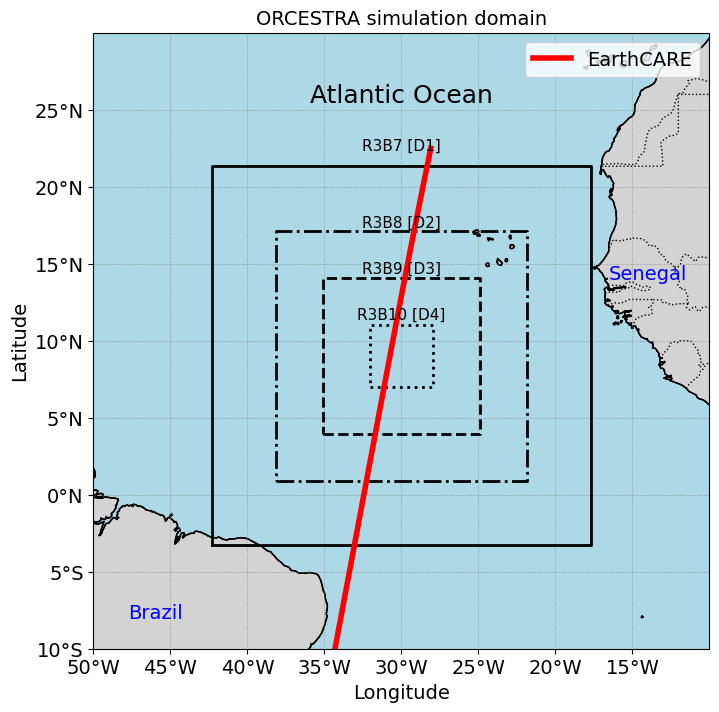

In [46]:


mask_ec_orc_iwp = (ds_ec_orc.iwp_1km > 0.) & (ds_ec_orc.iwp_1km != 9.96921e+36)
filt_iwp_ec_orc_1km = xr.where(mask_ec_orc_iwp, ds_ec_orc.iwp_1km, np.nan)

mask_ec_iwp = (ds_ec.iwp_1km > 0.) & (ds_ec.iwp_1km != 9.96921e+36)
filt_iwp_ec_1km = xr.where(mask_ec_iwp, ds_ec.iwp_1km, np.nan)

## ORCESTRA 3 Sept 2024 domain
lon1 = [np.rad2deg(-0.7382057), np.rad2deg(-0.3090404)];
lat1 = [np.rad2deg(-0.05696956), np.rad2deg(0.3720691)];

lon2 = [np.rad2deg(-0.6658707), np.rad2deg(-0.381382)];
lat2 = [np.rad2deg(0.01520532), np.rad2deg(0.2988283)];

lon3 = [np.rad2deg(-0.6120488), np.rad2deg(-0.4350379)];
lat3 = [np.rad2deg(0.06869945), np.rad2deg(0.2454873)];

lon4 = [np.rad2deg(-0.5591615), np.rad2deg(-0.4880353)];
lat4 = [np.rad2deg(0.1216053), np.rad2deg(0.1925445)];

#lon1 = [-16., -44.];
#lat1 = [-4., 22.];

#lon2 = [-22., -38.];
#lat2 = [-0., 17.];
##lat2 = [-0.85, 17.];

#lon3 = [-25., -35.];
#lat3 = [4, 14.];

#lon4 = [-28., -32.];
#lat4 = [7., 11.];

lev = np.linspace(0, 1, 15)
fnt=14;

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw={'projection': ccrs.PlateCarree()})


# Add coastlines and features for context
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS, linestyle=':')


ax.plot([lon1[0], lon1[1], lon1[1], lon1[0], lon1[0]], 
        [lat1[0], lat1[0], lat1[1], lat1[1], lat1[0]], 
        color='black', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())

ax.plot([lon2[0], lon2[1], lon2[1], lon2[0], lon2[0]], 
        [lat2[0], lat2[0], lat2[1], lat2[1], lat2[0]], 
        color='black', linewidth=2, linestyle='-.', transform=ccrs.PlateCarree())

ax.plot([lon3[0], lon3[1], lon3[1], lon3[0], lon3[0]], 
        [lat3[0], lat3[0], lat3[1], lat3[1], lat3[0]], 
        color='black', linewidth=2, linestyle='--', transform=ccrs.PlateCarree())

ax.plot([lon4[0], lon4[1], lon4[1], lon4[0], lon4[0]], 
        [lat4[0], lat4[0], lat4[1], lat4[1], lat4[0]], 
        color='black', linewidth=2, linestyle=':', transform=ccrs.PlateCarree())

#plt.contourf(lon_0345, lat_0345, lwp_0345, levels=lev, shading='auto', cmap='pyart_HomeyerRainbow')#'HomeyerRainbow')#'pyart_NWSRef')
#plt.contourf(lon_1427, lat_1427, lwp_1427, levels=lev, shading='auto', cmap='pyart_HomeyerRainbow')#'HomeyerRainbow')#'pyart_NWSRef')

ax.text(-30., 22.4, "R3B7 [D1]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='k')#, fontweight='bold')
ax.text(-30., 17.4, "R3B8 [D2]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='k')#, fontweight='bold')
ax.text(-30., 14.4, "R3B9 [D3]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='k')#, fontweight='bold')
ax.text(-30., 11.4, "R3B10 [D4]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='k')#, fontweight='bold')

#cnt=plt.scatter(ds_ec_orc.lon, ds_ec_orc.lat, c=1.e-3*filt_iwp_ec_1km, cmap='pyart_NWSRef')
#plt.plot(ds_ec_orc.lon, ds_ec_orc.lat, color='black')
plt.plot(ds_ec.lon, ds_ec.lat, 'r-', linewidth=4, label='EarthCARE')

plt.legend(frameon=True, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')


ax.set_xlim(-50., -10.)
ax.set_ylim(-10., 30.)
ax.set_xticks(range(-50, -10, 5))  
ax.set_yticks(range(-10, 30, 5))

xticks = range(-50, -9, 5)  # x-ticks from -50 to -10 with step 5
yticks = range(-10, 30, 5)  # y-ticks from -10 to 30 with step 5

xtick_labels = [f"{abs(x)}°W" if x < 0 else f"{x}°E" for x in xticks]
ytick_labels = [f"{abs(y)}°N" if y >= 0 else f"{abs(y)}°S" for y in yticks]


ax.tick_params(axis='x', labelsize=fnt)
ax.tick_params(axis='y', labelsize=fnt)
ax.set_xticklabels(xtick_labels[:-1], fontsize=fnt)
ax.set_yticklabels(ytick_labels, fontsize=fnt)

ax.set_xlabel("Longitude", fontsize=fnt)
ax.set_ylabel("Latitude", fontsize=fnt)

ax.grid(True, linestyle=':', linewidth=0.5, color='grey')
ax.set_title('ORCESTRA simulation domain', fontsize=fnt)#, fontweight='bold')

# Add oceans and continents features
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')

ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')
ax.text(-30, 25.5, "Atlantic Ocean", transform=ccrs.PlateCarree(), fontsize=fnt+4, ha='center', color='k')
ax.text(-14, 14, "Senegal", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='blue')
ax.text(-46, -8, "Brazil", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='blue')


#ax.text(-38, 1, "GCOM overpass1", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
#ax.text(-39, -1, "[04:06-04:10 UTC]", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
#ax.text(-19, -6, "GCOM overpass2", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
#ax.text(-19, -8, "[14:55-14:59 UTC]", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
#plt.colorbar(label='CLWP (kg m$^{-2}$)')

plt.show()

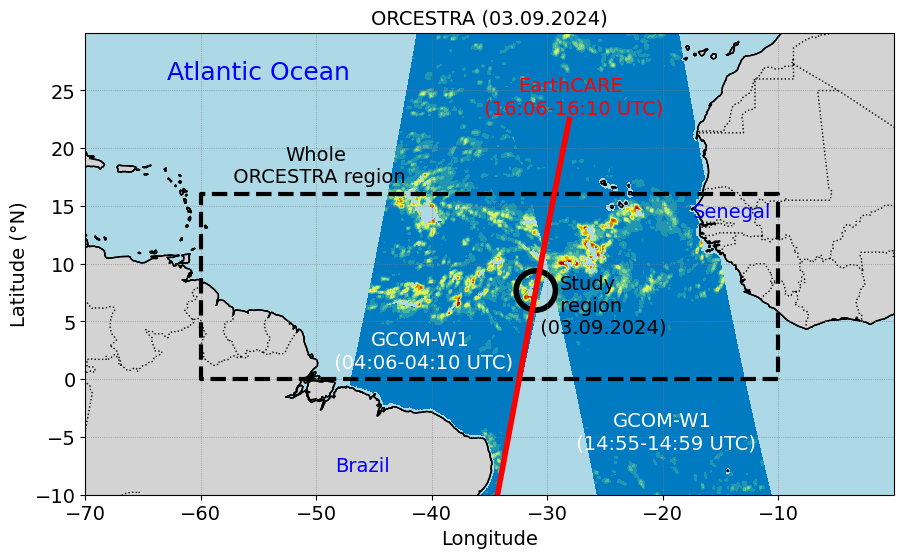

In [159]:


mask_ec_orc_iwp = (ds_ec_orc.iwp_1km > 0.) & (ds_ec_orc.iwp_1km != 9.96921e+36)
filt_iwp_ec_orc_1km = xr.where(mask_ec_orc_iwp, ds_ec_orc.iwp_1km, np.nan)

mask_ec_iwp = (ds_ec.iwp_1km > 0.) & (ds_ec.iwp_1km != 9.96921e+36)
filt_iwp_ec_1km = xr.where(mask_ec_iwp, ds_ec.iwp_1km, np.nan)

## ORCESTRA 3 Sept 2024 domain

lon1 = [-16., -44.];
lat1 = [-4., 22.];

lon2 = [-22., -38.];
lat2 = [-0., 17.];
#lat2 = [-0.85, 17.];

lon3 = [-25., -35.];
lat3 = [4, 14.];

lon4 = [-28., -32.];
lat4 = [7., 11.];

lon_orc = [-10., -60.]
lat_orc = [0., 16]

lev = np.linspace(0, 1, 15)
fnt=14;

fig, ax = plt.subplots(figsize=(18, 6), subplot_kw={'projection': ccrs.PlateCarree()})


# Add coastlines and features for context
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS, linestyle=':')



ax.plot([lon_orc[0], lon_orc[1], lon_orc[1], lon_orc[0], lon_orc[0]], 
        [lat_orc[0], lat_orc[0], lat_orc[1], lat_orc[1], lat_orc[0]], 
        color='black', linewidth=3, linestyle='--', transform=ccrs.PlateCarree())


#ax.plot([lon1[0], lon1[1], lon1[1], lon1[0], lon1[0]], 
#        [lat1[0], lat1[0], lat1[1], lat1[1], lat1[0]], 
#        color='black', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())
#
#ax.plot([lon2[0], lon2[1], lon2[1], lon2[0], lon2[0]], 
#        [lat2[0], lat2[0], lat2[1], lat2[1], lat2[0]], 
#        color='black', linewidth=2, linestyle='-.', transform=ccrs.PlateCarree())
#
#ax.plot([lon3[0], lon3[1], lon3[1], lon3[0], lon3[0]], 
#        [lat3[0], lat3[0], lat3[1], lat3[1], lat3[0]], 
#        color='black', linewidth=2, linestyle='--', transform=ccrs.PlateCarree())
#
#ax.plot([lon4[0], lon4[1], lon4[1], lon4[0], lon4[0]], 
#        [lat4[0], lat4[0], lat4[1], lat4[1], lat4[0]], 
#        color='black', linewidth=2, linestyle=':', transform=ccrs.PlateCarree())
#
plt.contourf(lon_0345, lat_0345, lwp_0345, levels=lev, shading='auto', cmap='pyart_HomeyerRainbow')#'HomeyerRainbow')#'pyart_NWSRef')
plt.contourf(lon_1427, lat_1427, lwp_1427, levels=lev, shading='auto', cmap='pyart_HomeyerRainbow')#'HomeyerRainbow')#'pyart_NWSRef')

#ax.text(-30., 22.2, "R3B7 [D1]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')
#ax.text(-30., 17.2, "R3B8 [D2]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')
#ax.text(-30., 14.2, "R3B9 [D3]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')
#ax.text(-30., 11.2, "R3B10 [D4]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')

#cnt=plt.scatter(ds_ec_orc.lon, ds_ec_orc.lat, c=1.e-3*filt_iwp_ec_1km, cmap='pyart_NWSRef')
#plt.plot(ds_ec_orc.lon, ds_ec_orc.lat, color='black')
plt.plot(ds_ec.lon, ds_ec.lat, 'r-', linewidth=4, label='EarthCARE')
plt.scatter(ds_ec.lon[1600], ds_ec.lat[1600], marker='o', facecolor='none', edgecolor='k', linewidth=4, s=800, label='Study region')

#plt.legend(frameon=True, handlelength=2, labelspacing=0.5, fontsize=fnt, loc='best')

ax.set_xlim(-70., 0.)
ax.set_ylim(-10., 30.)
ax.set_xticks(range(-70, 0, 10))  
ax.set_yticks(range(-10, 30, 5))

#ax.set_xlim(-180., 180.)
#ax.set_ylim(-90., 90.)
#ax.set_xticks(range(-180, 180, 30))  
#ax.set_yticks(range(-90, 90, 30))

ax.tick_params(axis='x', labelsize=fnt)
ax.tick_params(axis='y', labelsize=fnt)
ax.set_xlabel("Longitude", fontsize=fnt)
ax.set_ylabel("Latitude (°N)", fontsize=fnt)
ax.grid(True, linestyle=':', linewidth=0.5, color='grey')
ax.set_title('ORCESTRA (03.09.2024)', fontsize=fnt)#, fontweight='bold')

# Add oceans and continents features
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')

ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')
ax.text(-55, 26, "Atlantic Ocean", transform=ccrs.PlateCarree(), fontsize=fnt+4, ha='center', color='b')
ax.text(-14, 14, "Senegal", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='blue')
ax.text(-46, -8, "Brazil", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='blue')
ax.text(-50, 17, "Whole\n ORCESTRA region", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='k')
ax.text(-28, 23, "EarthCARE\n (16:06-16:10 UTC)", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='r')
ax.text(-26.5, 4, "Study\n region\n     (03.09.2024)", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='k')


ax.text(-41, 1, "GCOM-W1\n (04:06-04:10 UTC)", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
ax.text(-20, -6, "GCOM-W1\n (14:55-14:59 UTC)", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
#plt.colorbar(label='CLWP (kg m$^{-2}$)')

plt.show()

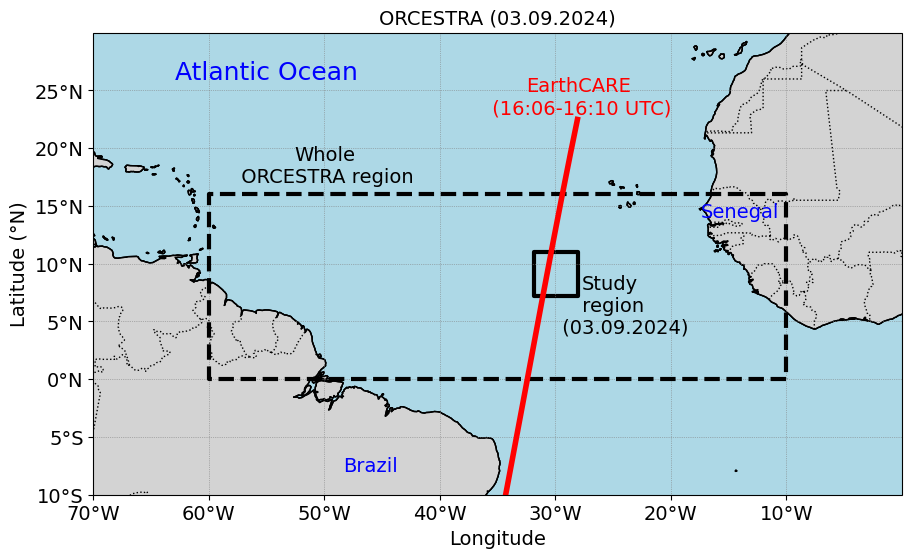

In [44]:


mask_ec_orc_iwp = (ds_ec_orc.iwp_1km > 0.) & (ds_ec_orc.iwp_1km != 9.96921e+36)
filt_iwp_ec_orc_1km = xr.where(mask_ec_orc_iwp, ds_ec_orc.iwp_1km, np.nan)

mask_ec_iwp = (ds_ec.iwp_1km > 0.) & (ds_ec.iwp_1km != 9.96921e+36)
filt_iwp_ec_1km = xr.where(mask_ec_iwp, ds_ec.iwp_1km, np.nan)

## ORCESTRA 3 Sept 2024 domain

lon1 = [-16., -44.];
lat1 = [-4., 22.];

lon2 = [-22., -38.];
lat2 = [-0., 17.];
#lat2 = [-0.85, 17.];

lon3 = [-25., -35.];
lat3 = [4, 14.];

lon4 = [-28., -32.];
lat4 = [7., 11.];

lon_orc = [-10., -60.]
lat_orc = [0., 16]

lev = np.linspace(0, 1, 15)
fnt=14;

plt.style.use('default')
fig, ax = plt.subplots(figsize=(18, 6), subplot_kw={'projection': ccrs.PlateCarree()})


# Add coastlines and features for context
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS, linestyle=':')



ax.plot([lon_orc[0], lon_orc[1], lon_orc[1], lon_orc[0], lon_orc[0]], 
        [lat_orc[0], lat_orc[0], lat_orc[1], lat_orc[1], lat_orc[0]], 
        color='black', linewidth=3, linestyle='--', transform=ccrs.PlateCarree())


#ax.plot([lon1[0], lon1[1], lon1[1], lon1[0], lon1[0]], 
#        [lat1[0], lat1[0], lat1[1], lat1[1], lat1[0]], 
#        color='black', linewidth=2, linestyle='-', transform=ccrs.PlateCarree())
#
#ax.plot([lon2[0], lon2[1], lon2[1], lon2[0], lon2[0]], 
#        [lat2[0], lat2[0], lat2[1], lat2[1], lat2[0]], 
#        color='black', linewidth=2, linestyle='-.', transform=ccrs.PlateCarree())
#
#ax.plot([lon3[0], lon3[1], lon3[1], lon3[0], lon3[0]], 
#        [lat3[0], lat3[0], lat3[1], lat3[1], lat3[0]], 
#        color='black', linewidth=2, linestyle='--', transform=ccrs.PlateCarree())
#
#ax.plot([lon4[0], lon4[1], lon4[1], lon4[0], lon4[0]], 
#        [lat4[0], lat4[0], lat4[1], lat4[1], lat4[0]], 
#        color='black', linewidth=2, linestyle=':', transform=ccrs.PlateCarree())
#

#plt.contourf(lon_0345, lat_0345, lwp_0345, levels=lev, shading='auto', cmap='pyart_HomeyerRainbow')#'HomeyerRainbow')#'pyart_NWSRef')
#plt.contourf(lon_1427, lat_1427, lwp_1427, levels=lev, shading='auto', cmap='pyart_HomeyerRainbow')#'HomeyerRainbow')#'pyart_NWSRef')

#ax.text(-30., 22.2, "R3B7 [D1]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')
#ax.text(-30., 17.2, "R3B8 [D2]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')
#ax.text(-30., 14.2, "R3B9 [D3]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')
#ax.text(-30., 11.2, "R3B10 [D4]", transform=ccrs.PlateCarree(), fontsize=fnt-3, ha='center', color='w', fontweight='bold')

#cnt=plt.scatter(ds_ec_orc.lon, ds_ec_orc.lat, c=1.e-3*filt_iwp_ec_1km, cmap='pyart_NWSRef')
#plt.plot(ds_ec_orc.lon, ds_ec_orc.lat, color='black')
plt.plot(ds_ec.lon, ds_ec.lat, 'r-', linewidth=4, label='EarthCARE')
plt.scatter(ds_ec.lon[1000], ds_ec.lat[1450], marker='s', facecolor='none', edgecolor='k', linewidth=3, s=1000, label='Study region')

#plt.legend(frameon=True, handlelength=2, labelspacing=0.5, fontsize=fnt, loc='best')


#ax.set_xlim(-180., 180.)
#ax.set_ylim(-90., 90.)
#ax.set_xticks(range(-180, 180, 30))  
#ax.set_yticks(range(-90, 90, 30))

ax.set_xlim(-70., 0.)
ax.set_ylim(-10., 30.)
ax.set_xticks(range(-70, 0, 10))  
ax.set_yticks(range(-10, 30, 5))


xticks = range(-70, -1, 10)  # x-ticks from -50 to -10 with step 5
yticks = range(-10, 30, 5)  # y-ticks from -10 to 30 with step 5

xtick_labels = [f"{abs(x)}°W" if x < 0 else f"{x}°W" for x in xticks]
#ytick_labels = [f"{abs(y)}°N" for y in yticks]
ytick_labels = [f"{abs(y)}°N" if y >= 0 else f"{abs(y)}°S" for y in yticks]

ax.tick_params(axis='x', labelsize=fnt)
ax.tick_params(axis='y', labelsize=fnt)
ax.set_xticklabels(xtick_labels[:], fontsize=fnt)
ax.set_yticklabels(ytick_labels, fontsize=fnt)

ax.set_xlabel("Longitude", fontsize=fnt)
ax.set_ylabel("Latitude (°N)", fontsize=fnt)
ax.grid(True, linestyle=':', linewidth=0.5, color='grey')
ax.set_title('ORCESTRA (03.09.2024)', fontsize=fnt)#, fontweight='bold')

# Add oceans and continents features
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')

ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='lightgray')
ax.text(-55, 26, "Atlantic Ocean", transform=ccrs.PlateCarree(), fontsize=fnt+4, ha='center', color='b')
ax.text(-14, 14, "Senegal", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='blue')
ax.text(-46, -8, "Brazil", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='blue')
ax.text(-50, 17, "Whole\n ORCESTRA region", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='k')
ax.text(-28, 23, "EarthCARE\n (16:06-16:10 UTC)", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='r')
ax.text(-25.3, 4, "Study\n region\n     (03.09.2024)", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='k')


#ax.text(-41, 1, "GCOM-W1\n (04:06-04:10 UTC)", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
#ax.text(-20, -6, "GCOM-W1\n (14:55-14:59 UTC)", transform=ccrs.PlateCarree(), fontsize=fnt, ha='center', color='w')
#plt.colorbar(label='CLWP (kg m$^{-2}$)')

plt.show()

In [63]:
ds_ec.lon

<xarray.DataArray 'lon' (time: 4863)> Size: 39kB
array([-28.09269879, -28.09450963, -28.09632042, ..., -36.77102542,
       -36.77285972, -36.77469407])
Coordinates:
  * time     (time) object 39kB 2024-09-03T16:05:28.099284+00:00 ... 2024-09-...
    lon      (time) float64 39kB -28.09 -28.09 -28.1 ... -36.77 -36.77 -36.77
    lat      (time) float64 39kB 22.49 22.48 22.47 22.46 ... -22.48 -22.49 -22.5

## Radar CFAD

### Radar Reflectivity CFAD validation

In [23]:

lon_min_deg = -31.5; 
lon_max_deg = -30.0;
lat_min_deg = 7; 
lat_max_deg = 11

# Convert to radians
lon_min, lon_max = np.deg2rad(lon_min_deg), np.deg2rad(lon_max_deg)
lat_min, lat_max = np.deg2rad(lat_min_deg), np.deg2rad(lat_max_deg)

print(lon_min, lon_max)
print(lat_min, lat_max)

# Create mask
mask = (
    (ds_4sip_hfreq.clon > lon_min) & (ds_4sip_hfreq.clon < lon_max) &
    (ds_4sip_hfreq.clat > lat_min) & (ds_4sip_hfreq.clat < lat_max)
)


#ds_icon = ds_4sip_hfreq.where(mask)

#ds_4sip_filt = ds_icon.sel(time=slice('2024-09-03T16:08:00.000000000','2024-09-03T16:16:00.000000000'))

#ds_4sip_filt = ds_4sip_hfreq.sel(time=slice('2024-09-03T16:08:00.000000000','2024-09-03T16:16:00.000000000')).where(mask)

ds_4sip_filt = ds_4sip_hfreq.where(mask)
ds_4sip_filt = ds_4sip_filt.sel(time=slice('2024-09-03T16:04:00','2024-09-03T16:16:00')).load()


filt_refl_4sip = xr.where(ds_4sip_filt.dbz > -10., ds_4sip_filt.dbz, np.nan);
alt_4sip_km = 1.e-3*ds_4sip_filt.z_mc


refl_4sip_flat = filt_refl_4sip.values.flatten()
alt_4sip_flat = alt_4sip_km.values.flatten()


-0.5497787143782138 -0.5235987755982988
0.12217304763960307 0.19198621771937624


In [86]:

nbin=25;


############## EarthCARE #############

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16
mean_ht_ec = 1.e-3*ds_ec_orc.altitude.mean('time')

mask_refl = (ds_ec_orc.refl_cpr_1km > -10.) & (ds_ec_orc.refl_cpr_1km != 9.96921e+36)
filt_refl_1km = xr.where(mask_refl, ds_ec_orc.refl_cpr_1km, np.nan)


refl_ec_filt1 = filt_refl_1km.copy()
mean_alt_ec_filt1 = mean_ht_ec.copy()


# Flatten refl to 1D
refl_flat = refl_ec_filt1.values.flatten()  # shape (864*217,)

# Repeat altitude vector for each profile (864 times)
alt_flat = np.tile(mean_alt_ec_filt1, refl_ec_filt1.shape[0])  # shape (864*217,)

# Define bins (for example, with nbin=100 or whatever you want)
dbz_ec_bins = np.linspace(np.nanmin(refl_flat), np.nanmax(refl_flat), nbin)
alt_ec_bins = np.linspace(np.nanmin(alt_flat), np.nanmax(alt_flat), nbin)

# 2D histogram
cfad_refl_ec, xedges_ec, yedges_ec = np.histogram2d(refl_flat, alt_flat, bins=[dbz_ec_bins, alt_ec_bins]) # count over all ht and dbz bins 

cfad_refl_ec_norm = cfad_refl_ec / np.sum(cfad_refl_ec, axis=0, keepdims=True) # normalized by height

refl_ec_filt1_masked = np.where((refl_ec_filt1 > -10.) & (refl_ec_filt1 < 40.), refl_ec_filt1, np.nan)
median_refl_ec = np.nanmedian(refl_ec_filt1_masked, axis=0)

#median_refl_ec[median_refl_ec > 20.] = np.nan
mean_refl_ec = np.nanmean(refl_ec_filt1_masked, axis=0)

############## EarthCARE CFAD End #######

################## ICON #################

# Filter out NaNs and physically unrealistic values
mask_4sip = (~np.isnan(refl_4sip_flat)) & (~np.isnan(alt_4sip_flat)) & (refl_4sip_flat > -10) & (alt_4sip_flat >= 0)
refl_4sip_flat = refl_4sip_flat[mask_4sip]
alt_4sip_flat = alt_4sip_flat[mask_4sip]


dbz_4sip_bins = np.linspace(np.nanmin(refl_4sip_flat), np.nanmax(refl_4sip_flat), nbin)   
alt_4sip_bins = np.linspace(0., np.nanmax(alt_4sip_flat), nbin)     

# 6. 2D Histogram (CFAD)
cfad_4sip, xedges_4sip, yedges_4sip = np.histogram2d(refl_4sip_flat, alt_4sip_flat, bins=[dbz_4sip_bins, alt_4sip_bins])

cfad_4sip_norm = cfad_4sip / np.sum(cfad_4sip, axis=0, keepdims=True) # normalized by height


med_refl_4sip = filt_refl_4sip.median(dim=('time','ncells'))
mean_refl_4sip = filt_refl_4sip.mean(dim=('time','ncells'))
mean_alt_4sip = alt_4sip_km.mean(dim=('time','ncells'))

median_refl_4sip = med_refl_4sip.compute()
mean_alt_4sip = mean_alt_4sip.compute()
median_refl_4sip[mean_alt_4sip > 15.] = np.nan

################## ICON CFAD End #################

(0.0, 14.0)

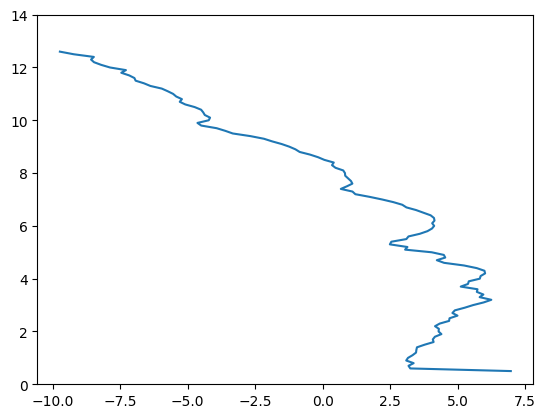

In [87]:

mask_refl = (ds_ec_orc.refl_cpr_1km > -10.) & (ds_ec_orc.refl_cpr_1km != 9.96921e+36)
filt_refl_1km = xr.where(mask_refl, ds_ec_orc.refl_cpr_1km, np.nan)
plt.plot(filt_refl_1km.mean('time'), mean_ht_ec)
plt.ylim(0, 14)

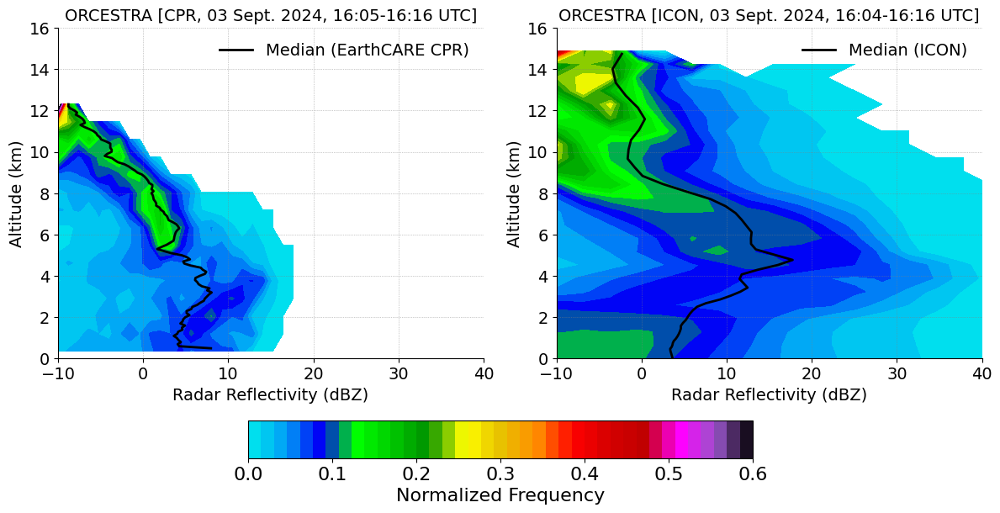

In [89]:


mean_alt_ec_filt1 = mean_alt_ec_filt1[:median_refl_ec.shape[0]]
median_refl_ec1 = median_refl_ec
median_refl_ec1[mean_alt_ec_filt1 > 12.4] = np.nan


#height_bin_centers = 0.5 * (alt_ec_bins[:-1] + alt_ec_bins[1:])
cfad_refl_ec_norm[:, height_bin_centers > 13.] = np.nan

cfad_refl_ec_norm[cfad_refl_ec_norm <= 0.] = np.nan

cfad_4sip_norm[cfad_4sip_norm <= 0.] = np.nan


fnt = 14
lev1 = np.linspace(0., 0.6, 40)
lev2 = np.linspace(0., 0.6, 40)
plt.figure(figsize=(12, 5))

plt.subplot(1,2,1)
cnt = plt.contourf(dbz_ec_bins[:-1], alt_ec_bins[:-1], (cfad_refl_ec_norm.T), levels=lev1, cmap='pyart_NWSRef')
plt.plot(median_refl_ec, mean_alt_ec_filt1, 'k-', linewidth=2, label='Median (EarthCARE CPR)')

plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Radar Reflectivity (dBZ)", fontsize=fnt)
plt.ylabel("Altitude (km)", fontsize=fnt)
plt.title("ORCESTRA [CPR, 03 Sept. 2024, 16:05-16:16 UTC]", fontsize=fnt)

plt.xlim(-10, 40)
plt.ylim(0, 16)
#cbar = plt.colorbar(contour, ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], label='Normalized Frequency', orientation='vertical')
#cbar.ax.tick_params(labelsize=fnt)
#cbar.set_label(label='Normalized Frequency', size=fnt)

# Customize tick labels and rotation
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xticks(rotation=0)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.subplot(1,2,2)
#contour = plt.contourf(refl_4sip_bins[:-1], avg_alt_4sip, np.log(cfad_refl_4sip.T), levels=lev, cmap='turbo')
cnt = plt.contourf(dbz_4sip_bins[:-1], alt_4sip_bins[:-1], (cfad_4sip_norm.T), levels=lev2, cmap='pyart_NWSRef')#pyart_NWSRef')
plt.plot(median_refl_4sip, mean_alt_4sip, color='k', linewidth=2, label='Median (ICON)')
#plt.plot(median_refl_ec1, mean_alt_ec_filt1, 'k--', linewidth=2, label='Median (EarthCARE-CPR)')


plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Radar Reflectivity (dBZ)", fontsize=fnt)
plt.ylabel("Altitude (km)", fontsize=fnt)
plt.title("ORCESTRA [ICON, 03 Sept. 2024, 16:04-16:16 UTC]", fontsize=fnt)

plt.xlim(-10, 40)
plt.ylim(0, 16)
##cbar = plt.colorbar(contour, ticks=[0, 2, 4, 6, 8, 10], label='Natural log of Frequency', orientation='vertical')
#cbar = plt.colorbar(contour, ticks=[0, 0.2, 0.4, 0.6, 0.8, 1.0], label='Normalized Frequency', orientation='vertical')
#cbar.ax.tick_params(labelsize=fnt)
#cbar.set_label(label='Normalized Frequency', size=fnt)

# Customize tick labels and rotation
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xticks(rotation=0)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)


fig = plt.gcf()
cbar_ax1 = fig.add_axes([0.25, -0.1, 0.5, 0.09])  # [left, bottom, width, height]
cbar1 = fig.colorbar(cnt, cax=cbar_ax1, orientation='horizontal', ticks=[0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6])
cbar1.set_label('Normalized Frequency', fontsize=fnt+2)
cbar1.ax.tick_params(labelsize=fnt+2)

plt.tight_layout()
plt.show()

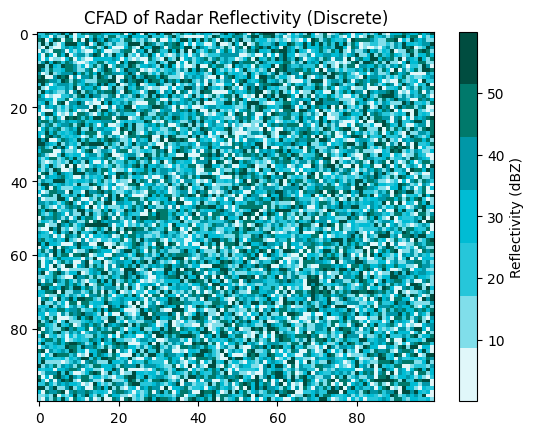

In [50]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap

# Define discrete levels for reflectivity
levels = [0, 10, 20, 30, 40, 50, 60]  # dBZ levels
colors = ['#e0f7fa', '#80deea', '#26c6da', '#00bcd4', '#0097a7', '#00796b', '#004d40']  # Color palette
cmap = ListedColormap(colors)

# Example radar data
data = np.random.rand(100, 100) * 60  # Random data from 0 to 60 dBZ

# Plot with the custom discrete colormap
plt.imshow(data, cmap=cmap, aspect='auto')
plt.colorbar(label='Reflectivity (dBZ)')
plt.title('CFAD of Radar Reflectivity (Discrete)')
plt.show()


In [ ]:
################## EarthCARE ############
nbin=25;

lon_min_deg, lon_max_deg = -31.5, -30.0
lat_min_deg, lat_max_deg = 7, 11

mask = ((lon_ec >= lon_min_deg) & (lon_ec <= lon_max_deg) & (lat_ec >= lat_min_deg) & (lat_ec <= lat_max_deg))

refl_dbz_ec_filt = refl_dbz_ec[mask]
lon_ec_filt = lon_ec[mask]
lat_ec_filt = lat_ec[mask]

refl_ec_filt1 = refl_dbz_ec_filt.copy()
mean_alt_ec_filt1 = mean_ht_ec.copy()

refl_ec_filt1[refl_ec_filt1 < -10.] = np.nan

mean_alt_ec_filt1[mean_alt_ec_filt1 < 0.] = np.nan


# Flatten refl to 1D
refl_flat = refl_ec_filt1.flatten()  # shape (864*217,)

# Repeat altitude vector for each profile (864 times)
alt_flat = np.tile(mean_alt_ec_filt1, refl_ec_filt1.shape[0])  # shape (864*217,)

# Define bins (for example, with nbin=100 or whatever you want)
dbz_ec_bins = np.linspace(np.nanmin(refl_flat), np.nanmax(refl_flat), nbin)
alt_ec_bins = np.linspace(np.nanmin(alt_flat), np.nanmax(alt_flat), nbin)

# 2D histogram
cfad_refl_ec, xedges_ec, yedges_ec = np.histogram2d(refl_flat, alt_flat, bins=[dbz_ec_bins, alt_ec_bins]) # count over all ht and dbz bins 

cfad_refl_ec_norm = cfad_refl_ec / np.sum(cfad_refl_ec, axis=0, keepdims=True) # normalized by height

refl_ec_filt1_masked = np.where((refl_ec_filt1 > -10.) & (refl_ec_filt1 < 40.), refl_ec_filt1, np.nan)
median_refl_ec = np.nanmedian(refl_ec_filt1_masked, axis=0)

#median_refl_ec[median_refl_ec > 20.] = np.nan
mean_refl_ec = np.nanmean(refl_ec_filt1_masked, axis=0)

############## EarthCARE CFAD End #######

In [ ]:
################## EarthCARE ############
nbin=25;

lon_min_deg, lon_max_deg = -31.5, -30.0
lat_min_deg, lat_max_deg = 7, 11

mask = ((lon_ec >= lon_min_deg) & (lon_ec <= lon_max_deg) & (lat_ec >= lat_min_deg) & (lat_ec <= lat_max_deg))

refl_dbz_ec_filt = refl_dbz_ec[mask]
lon_ec_filt = lon_ec[mask]
lat_ec_filt = lat_ec[mask]

refl_ec_filt1 = refl_dbz_ec_filt.copy()
mean_alt_ec_filt1 = mean_ht_ec.copy()

refl_ec_filt1[refl_ec_filt1 < -10.] = np.nan

mean_alt_ec_filt1[mean_alt_ec_filt1 < 0.] = np.nan


# Flatten refl to 1D
refl_flat = refl_ec_filt1.flatten()  # shape (864*217,)

# Repeat altitude vector for each profile (864 times)
alt_flat = np.tile(mean_alt_ec_filt1, refl_ec_filt1.shape[0])  # shape (864*217,)

# Define bins (for example, with nbin=100 or whatever you want)
dbz_ec_bins = np.linspace(np.nanmin(refl_flat), np.nanmax(refl_flat), nbin)
alt_ec_bins = np.linspace(np.nanmin(alt_flat), np.nanmax(alt_flat), nbin)

# 2D histogram
cfad_refl_ec, xedges_ec, yedges_ec = np.histogram2d(refl_flat, alt_flat, bins=[dbz_ec_bins, alt_ec_bins]) # count over all ht and dbz bins 

cfad_refl_ec_norm = cfad_refl_ec / np.sum(cfad_refl_ec, axis=0, keepdims=True) # normalized by height

refl_ec_filt1_masked = np.where((refl_ec_filt1 > -10.) & (refl_ec_filt1 < 40.), refl_ec_filt1, np.nan)
median_refl_ec = np.nanmedian(refl_ec_filt1_masked, axis=0)

#median_refl_ec[median_refl_ec > 20.] = np.nan
mean_refl_ec = np.nanmean(refl_ec_filt1_masked, axis=0)

############## EarthCARE CFAD End #######

In [20]:
import numpy as np


## EarthCARE-CPR

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16
mean_ht_ec = 1.e-3*ds_ec_orc.altitude.mean('time')

mask_refl = (ds_ec_orc.refl_cpr_1km > -10.) & (ds_ec_orc.refl_cpr_1km != 9.96921e+36)
filt_refl_1km = xr.where(mask_refl, ds_ec_orc.refl_cpr_1km, np.nan)

#lon_min_deg, lon_max_deg = -31.5, -30.0
#lat_min_deg, lat_max_deg = 7, 11

#mask = ((ds_ec.lon >= lon_min_deg) & (ds_ec.lon <= lon_max_deg) & (ds_ec.lat >= lat_min_deg) & (ds_ec.lat <= lat_max_deg))

refl_dbz_ec_filt = filt_refl_1km#[mask]
lon_ec_filt = ds_ec_orc.lon#[mask]
lat_ec_filt = ds_ec_orc.lat#[mask]

print(refl_dbz_ec_filt)
# Reflectivity values and height
refl_ec_filt1 = refl_dbz_ec_filt.copy()
mean_alt_ec_filt1 = mean_ht_ec.copy()

#refl_ec_filt1[refl_ec_filt1 < -10.] = np.nan

mean_alt_ec_filt1[mean_alt_ec_filt1 < 0.] = np.nan

print(mean_alt_ec_filt1.shape, refl_ec_filt1.shape)
finite_alt_mask = np.isfinite(mean_alt_ec_filt1)

#mean_alt_ec_filt1 = mean_alt_ec_filt1[finite_alt_mask]
refl_ec_filt1 = refl_ec_filt1[:, 1:len(mean_alt_ec_filt1)] #finite_alt_mask]  # Apply the same mask to columns

# Now, refl_ec_filt1.shape[1] == mean_alt_ec_filt1.shape[0]

nbin = 40
refl_ec_bins = np.linspace(np.nanmin(refl_ec_filt1), np.nanmax(refl_ec_filt1), nbin)
height_bins = np.linspace(np.nanmin(mean_alt_ec_filt1), np.nanmax(mean_alt_ec_filt1), nbin)

cfad_refl_ec = np.zeros((len(refl_ec_bins) - 1, len(height_bins) - 1))

for i in range(refl_ec_filt1.shape[0]):
    for j in range(refl_ec_filt1.shape[1]):
        if not np.isnan(refl_ec_filt1[i, j]):  
            refl_bin_idx = np.digitize(refl_ec_filt1[i, j], refl_ec_bins) - 1
            if refl_bin_idx >= len(refl_ec_bins) - 1:  
                refl_bin_idx = len(refl_ec_bins) - 2  # Clamp to valid range
            
            height_bin_idx = np.digitize(mean_alt_ec_filt1[j], height_bins) - 1
            if height_bin_idx >= len(height_bins) - 1:  
                height_bin_idx = len(height_bins) - 2  # Clamp to valid range
            
            cfad_refl_ec[refl_bin_idx, height_bin_idx] += 1

#=========== Calculate median for values < 40
refl_ec_filt1_masked = np.where((refl_ec_filt1 > -10.) & (refl_ec_filt1 < 40.), refl_ec_filt1, np.nan)
median_refl_ec = np.nanmedian(refl_ec_filt1_masked, axis=0)

median_refl_ec[median_refl_ec > 20.] = np.nan

<xarray.DataArray 'refl_cpr_1km' (time: 431, height: 206)> Size: 355kB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * time     (time) object 3kB 2024-09-03T16:08:25.639902+00:00 ... 2024-09-0...
    height   (time, height) float32 355kB 2e+04 1.99e+04 ... -400.0 -500.0
    lon      (time) float64 3kB -30.37 -30.37 -30.37 ... -31.12 -31.12 -31.12
    lat      (time) float64 3kB 10.99 10.98 10.97 10.96 ... 7.028 7.019 7.007
(206,) (431, 206)


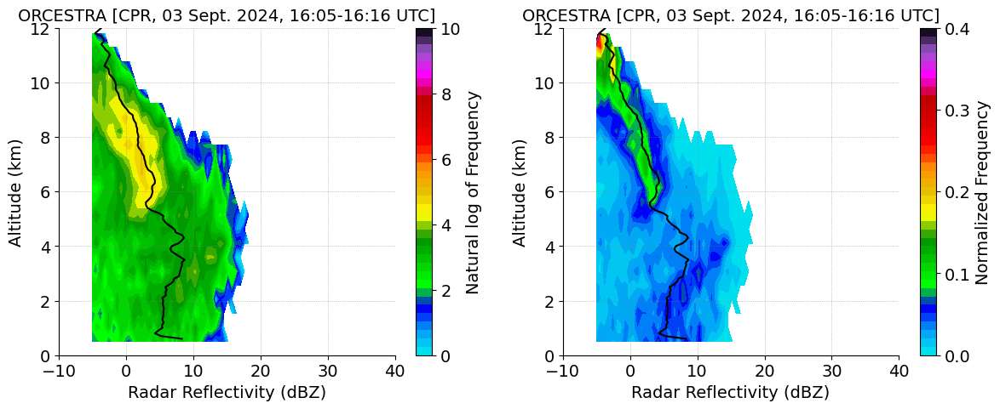

In [19]:
#median_refl_ec[mean_alt_ec_filt1 < 0.4] = np.nan

colors = ['grey', 'cyan', 'deepskyblue', 'mediumblue', 'lawngreen', 'limegreen', 'green', 'yellow', 'gold', 'goldenrod',
          'coral', 'orangered', 'red', 'lightcoral', 'magenta', 'darkorchid', 'pink']
cmap = ListedColormap(colors)

cfad_refl_ec_norm = cfad_refl_ec / np.sum(cfad_refl_ec, axis=0, keepdims=True) # normalized by height

height_bin_centers = 0.5 * (height_bins[:-1] + height_bins[1:])
cfad_refl_ec_norm[:, height_bin_centers > 13.] = np.nan

cfad_refl_ec_norm[cfad_refl_ec_norm <= 0.] = np.nan

#lev_refl = np.linspace(0., 20000, 400)
fnt = 14
lev1 = np.linspace(0., 10, 40)
lev2 = np.linspace(0., 0.4, 40)
plt.figure(figsize=(14, 5))
plt.style.use('default')

plt.subplot(1,2,1)
contour = plt.contourf(refl_ec_bins[:-1], height_bins[:-1], np.log(cfad_refl_ec.T), levels=lev1, cmap='pyart_NWSRef')
plt.plot(median_refl_ec,mean_alt_ec_filt1[:-1], 'k-')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Radar Reflectivity (dBZ)", fontsize=fnt)
plt.ylabel("Altitude (km)", fontsize=fnt)
plt.title("ORCESTRA [CPR, 03 Sept. 2024, 16:05-16:16 UTC]", fontsize=fnt)

plt.xlim(-10, 40)
plt.ylim(0, 12)
cbar = plt.colorbar(contour, ticks=[0, 2, 4, 6, 8, 10], label='Natural log of Frequency', orientation='vertical')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Natural log of Frequency', size=fnt)

# Customize tick labels and rotation
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xticks(rotation=0)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)


plt.subplot(1,2,2)
contour = plt.contourf(refl_ec_bins[:-1], height_bins[:-1], (cfad_refl_ec_norm.T), levels=lev2, cmap='pyart_NWSRef')
plt.plot(median_refl_ec,mean_alt_ec_filt1[:-1], 'k-')
plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Radar Reflectivity (dBZ)", fontsize=fnt)
plt.ylabel("Altitude (km)", fontsize=fnt)
plt.title("ORCESTRA [CPR, 03 Sept. 2024, 16:05-16:16 UTC]", fontsize=fnt)

plt.xlim(-10, 40)
plt.ylim(0, 12)
#cbar = plt.colorbar(contour, ticks=[0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], label='Normalized Frequency', orientation='vertical')
cbar = plt.colorbar(contour, ticks=[0, 0.1, 0.2, 0.3, 0.4], label='Normalized Frequency', orientation='vertical')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Normalized Frequency', size=fnt)

# Customize tick labels and rotation
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xticks(rotation=0)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()


In [ ]:

mean_alt_ec_filt1 = mean_alt_ec_filt1[:median_refl_ec.shape[0]]
median_refl_ec[mean_alt_ec_filt1 > 13.] = np.nan

height_bin_centers = 0.5 * (height_bins[:-1] + height_bins[1:])
high_alt_ind = np.where(height_bin_centers > 12)[0]
cfad_refl_ec[:, high_alt_ind] = np.nan

fnt = 14
lev = np.linspace(0., 10, 40)
plt.figure(figsize=(16, 5))

plt.subplot(1,2,1)
contour = plt.contourf(refl_ec_bins[:-1], height_bins[:-1], np.log(cfad_refl_ec.T), levels=lev, cmap='turbo')
plt.plot(median_refl_ec,mean_alt_ec_filt1, 'k-', linewidth=2, label='Median')

plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Radar Reflectivity (dBZ)", fontsize=fnt)
plt.ylabel("Altitude (km)", fontsize=fnt)
plt.title("ORCESTRA [CPR, 03 Sept. 2024, 16:05-16:16 UTC]", fontsize=fnt)

plt.xlim(-10, 40)
plt.ylim(0, 16)
cbar = plt.colorbar(contour, ticks=[0, 2, 4, 6, 8, 10], label='Natural log of Frequency', orientation='vertical')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Natural log of Frequency', size=fnt)

# Customize tick labels and rotation
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xticks(rotation=0)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.subplot(1,2,2)
contour = plt.contourf(refl_4sip_bins[:-1], avg_alt_4sip, np.log(cfad_refl_4sip.T), levels=lev, cmap='turbo')
plt.plot(median_refl_4sip, avg_alt_4sip, color='k', linewidth=2, label='Median')


plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fontsize, loc='best')

plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)
plt.xlabel("Radar Reflectivity (dBZ)", fontsize=fnt)
plt.ylabel("Altitude (km)", fontsize=fnt)
plt.title("ORCESTRA [ICON, 03 Sept. 2024, 16:00 UTC]", fontsize=fnt)

plt.xlim(-10, 40)
plt.ylim(0, 16)
cbar = plt.colorbar(contour, ticks=[0, 2, 4, 6, 8, 10], label='Natural log of Frequency', orientation='vertical')
cbar.ax.tick_params(labelsize=fnt)
cbar.set_label(label='Natural log of Frequency', size=fnt)

# Customize tick labels and rotation
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xticks(rotation=0)


plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.show()

In [25]:

#### Select ICON region corresponding to EC area
min_ec_lon, max_ec_lon = ds_ec_orc.lon.min().values, ds_ec_orc.lon.max().values
min_ec_lat, max_ec_lat = ds_ec_orc.lat.min().values, ds_ec_orc.lat.max().values

clon_deg = np.degrees(ds_4sip_hfreq_new['clon'].values)
clat_deg = np.degrees(ds_4sip_hfreq_new['clat'].values)

mask_ec = (
    (clon_deg >= min_ec_lon) & (clon_deg <= max_ec_lon) &
    (clat_deg >= min_ec_lat) & (clat_deg <= max_ec_lat)
)

# Select only those cells
ds_filt_hf_4sip = ds_4sip_hfreq_new.isel(ncells=np.where(mask_ec)[0])
ds_filt_hf_nosip = ds_nosip_hfreq_new.isel(ncells=np.where(mask_ec)[0])
#### end select

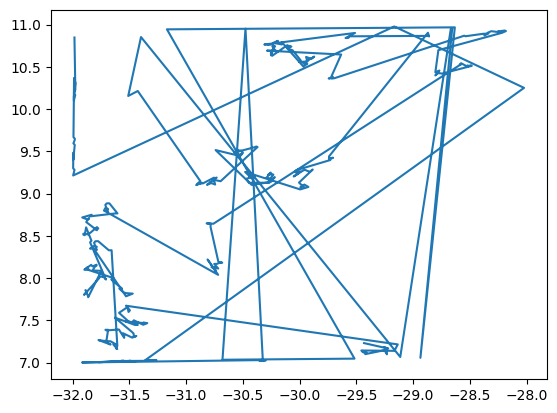

In [26]:
# EarthCARE track points (time-indexed)
ec_lons = ds_ec.lon.values
ec_lats = ds_ec.lat.values

# ICON grid cell centers (degrees)
clon_deg = np.degrees(ds_4sip['clon'].values)
clat_deg = np.degrees(ds_4sip['clat'].values)

# For each EarthCARE point, find the nearest ICON cell
curtain_indices = []
for lon, lat in zip(ec_lons, ec_lats):
    distances = np.sqrt((clon_deg - lon)**2 + (clat_deg - lat)**2)
    curtain_indices.append(np.argmin(distances))

#print('curt_ind :: ', np.unique(curtain_indices))

ds_dum = ds_4sip_hfreq.sel(ncells=mask_ncells_orc, time=slice('2024-09-03T15:45:00.000000000','2024-09-03T16:15:00.000000000'))

ds_4sip_curtain = ds_dum.sel(ncells=np.unique(curtain_indices))

plt.plot(np.degrees(ds_4sip_curtain.clon), np.degrees(ds_4sip_curtain.clat))
#plt.plot(np.degrees(ds_filt.clon), np.degrees(ds_filt.clat))

#plt.figure(figsize=(20,5))
#plt.subplot(1,2,1)
#plt.contourf(np.degrees(ds_4sip_curtain.clon), 1.e-3*ds_4sip_curtain.z_mc.mean(dim=('time','ncells')), ds_4sip_curtain.lwc_gperm3.mean('time'))
#plt.subplot(1,2,2)
#plt.contourf(np.degrees(ds_4sip_curtain.clat), 1.e-3*ds_4sip_curtain.z_mc.mean(dim=('time','ncells')), ds_4sip_curtain.lwc_gperm3.mean('time'))

Text(0.5, 1.0, 'Curtain of ORCETRA domain corresponding to EarthCare track')

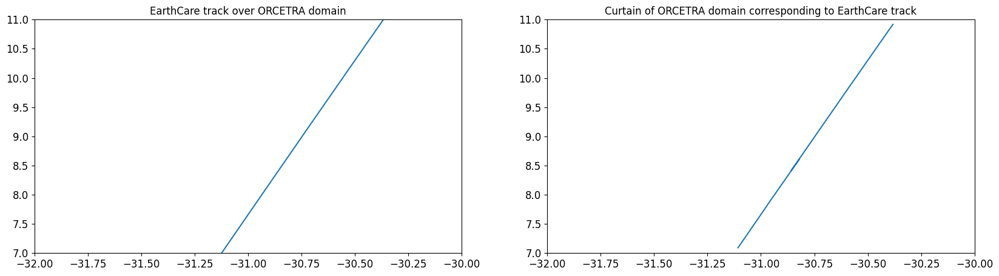

In [52]:
import numpy as np

# ICON cell centers in degrees
#clon_deg = np.degrees(ds_4sip['clon'].values)
#clat_deg = np.degrees(ds_4sip['clat'].values)

# EarthCARE track points
#ec_lons = ds_ec.lon.values
#ec_lats = ds_ec.lat.values

# Define a narrow radius (e.g., 0.05 degrees)
radius = 0.001

# For each ICON cell, check if it's within 'radius' of any track point
mask = np.zeros(clon_deg.shape, dtype=bool)
for lon, lat in zip(ec_lons, ec_lats):
    mask |= (np.abs(clon_deg - lon) < radius) & (np.abs(clat_deg - lat) < radius)

# Select these cells
ds_curtain = ds_4sip.isel(ncells=np.where(mask)[0])

fnt=12
plt.figure(figsize=(20,5))
plt.subplot(1,2,1)
plt.plot(ds_ec.lon, ds_ec.lat)
plt.xlim(-32, -30)
plt.ylim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.title('EarthCare track over ORCETRA domain', fontsize=fnt)

plt.subplot(1,2,2)
plt.plot(np.degrees(ds_curtain.clon), np.degrees(ds_curtain.clat))
plt.xlim(-32, -30)
plt.ylim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.title('Curtain of ORCETRA domain corresponding to EarthCare track', fontsize=fnt)


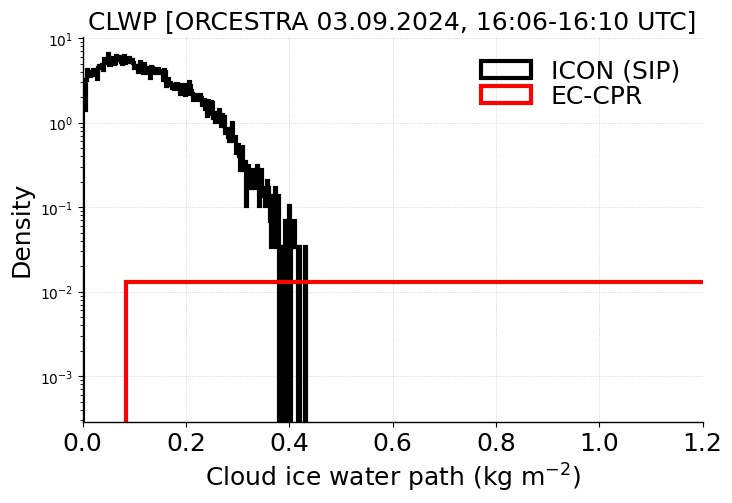

In [17]:


mask_iwp = (ds_ec_orc.iwp_1km > 0.) & (ds_ec_orc.iwp_1km != 9.96921e+36)
filt_iwp_1km = xr.where(mask_iwp, ds_ec_orc.iwp_1km, np.nan)

import seaborn as sns


ciwp_4sip1600_hf = ds_filt_hf_4sip.ciwp_kgperm2.sel(time=slice('2024-09-03T16:00:00.000000000','2024-09-03T16:10:00.000000000')).mean(dim='time').values
ciwp_4sip1600_hf[ciwp_4sip1600_hf <= 0.] = np.nan

#clwp_ec1500 = lwp_ec_orc1427.compressed() if np.ma.is_masked(lwp_ec_orc1427) else lwp_ec_orc[~np.isnan(lwp_ec_orc1427)]

fnt = 18;
ln = 3;
plt.figure(figsize=(8,5))
plt.style.use('default')

#sns.kdeplot(clwp_4sip1600_hf, color='k', linewidth=ln, label='ICON (4SIP)')
#sns.kdeplot(filt_iwp_1km, color='r', linewidth=ln, label='EC-CPR')

plt.hist(ciwp_4sip1600_hf, bins=200, density=True, histtype='step', edgecolor='k', linewidth=ln, label='ICON (SIP)')
plt.hist(filt_iwp_1km, bins=200, density=True, histtype='step', edgecolor='r', linewidth=ln, label='EC-CPR')

plt.xlim(0, 1.2); 
#plt.ylim(0, 6); 
plt.xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2], fontsize=fnt)
#plt.yticks([0, 1, 2, 3, 4, 5, 6], fontsize=fnt)
plt.yscale('log')
plt.xlabel('Cloud ice water path (kg m$^{-2}$)', fontsize=fnt)
plt.ylabel('Density', fontsize=fnt)
plt.title('CLWP [ORCESTRA 03.09.2024, 16:06-16:10 UTC]',fontsize=fnt)  

plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)
#plt.show()


plt.show()

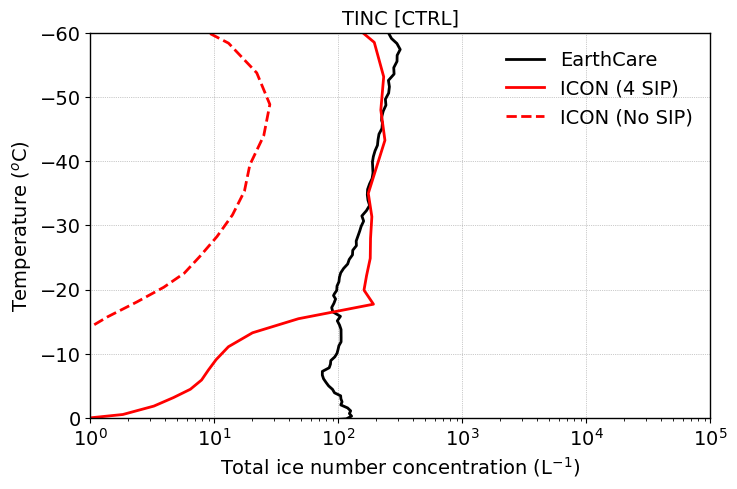

In [17]:

mask = (ds_ec_orc.tinc_1km > 0.) & (ds_ec_orc.tinc_1km != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16

mask = (ds_ec_orc.tinc_1km > 0.) & (ds_ec_orc.tinc_1km != 9.96921e+36)
filt_tinc_1km_ec = 1.e-3*xr.where(mask, ds_ec_orc.tinc_1km, np.nan)
median_tinc_1km_ec = filt_tinc_1km_ec.mean('time')

mask = (ds_filt_hf_4sip.inc_perl > 0.) & (ds_filt_hf_4sip.inc_perl < 1000.) #& (np.abs(ds_filt_hf_4sip.w_vel) < 1. )
fitl_tinc_4sip = xr.where(mask, ds_filt_hf_4sip.inc_perl, np.nan)
median_tinc_4sip = fitl_tinc_4sip.mean(dim=('time','ncells'))
mean_temp_4sip = ds_filt_hf_4sip.tempc.mean(dim=('time','ncells'))

mask = (ds_filt_hf_nosip.inc_perl > 0.) #& (np.abs(ds_filt_hf_nosip.w_vel) < 1. )
fitl_tinc_nosip = xr.where(mask, ds_filt_hf_nosip.inc_perl, np.nan)
median_tinc_nosip = fitl_tinc_nosip.mean(dim=('time','ncells'))
mean_temp_nosip = ds_filt_hf_nosip.tempc.mean(dim=('time','ncells'))


fnt=14;
ln=2;
alpha=0.6;

plt.figure(figsize=(8, 5))
plt.style.use('default')


plt.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt.plot(median_tinc_1km_ec, mean_temp_ec, 'k-', linewidth=ln, label='EarthCare')
plt.plot(median_tinc_4sip, mean_temp_4sip, 'r-', linewidth=ln, label='ICON (4 SIP)')
plt.plot(median_tinc_nosip, mean_temp_nosip, 'r--', linewidth=ln, label='ICON (No SIP)')


plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt.xscale('log')
plt.xlim(1.e0, 1.e5)
plt.ylim(0, -60)

#plt.xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt.yticks([0, -10, -20, -30, -40, -50, -60])

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)

plt.tick_params(axis='x', labelsize=fnt)
plt.tick_params(axis='y', labelsize=fnt)

plt.xlabel('Total ice number concentration (L$^{-1}$)', fontsize=fnt)
plt.ylabel('Temperature ($^{o}$C)', fontsize=fnt)



plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.5, fontsize=fnt, loc='best')

plt.title('TINC [CTRL]', fontsize=fnt)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

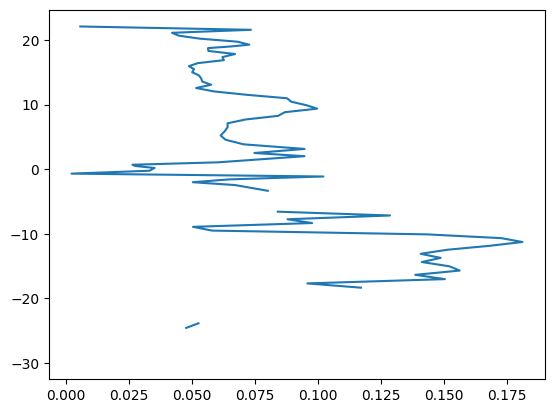

In [29]:

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16

mask = (ds_ec_orc.lwc_1km > 0.) & (ds_ec_orc.lwc_1km != 9.96921e+36)# & (ds_ec_orc.lwc1_1km < 12.)
filt_lwc_1km_ec = xr.where(mask, ds_ec_orc.lwc_1km, np.nan)
median_lwc_1km_ec = filt_lwc_1km_ec.mean('time')

plt.plot(median_lwc_1km_ec, mean_temp_ec)

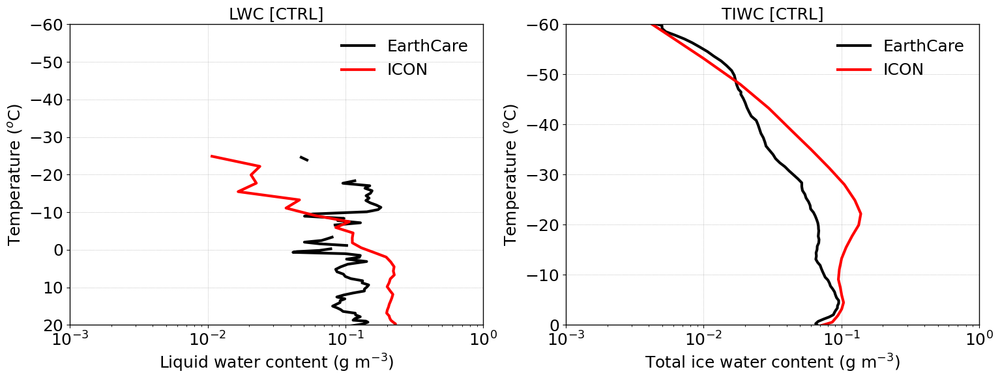

In [33]:

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16

mask = (ds_ec_orc.lwc_1km > 0.) & (ds_ec_orc.lwc_1km > 0.01) & (ds_ec_orc.lwc_1km != 9.96921e+36)# & (ds_ec_orc.lwc1_1km < 12.)
filt_lwc_1km_ec = xr.where(mask, ds_ec_orc.lwc_1km, np.nan)
median_lwc_1km_ec = filt_lwc_1km_ec.mean('time')

mask = ds_filt_hf_4sip.lwc_gperm3 > 1.e-4
fitl_lwc_4sip = xr.where(mask, ds_filt_hf_4sip.lwc_gperm3, np.nan)
median_lwc_4sip = fitl_lwc_4sip.mean(dim=('time','ncells'))
mean_temp_4sip = ds_filt_hf_4sip.tempc.mean(dim=('time','ncells'))

mask = (ds_ec_orc.iwc_1km > 0.) & (ds_ec_orc.iwc_1km != 9.96921e+36)
filt_iwc_1km_ec = xr.where(mask, ds_ec_orc.iwc_1km, np.nan)
median_iwc_1km_ec = filt_iwc_1km_ec.mean('time')

mask = ds_filt_hf_4sip.tiwc_gperm3 > 1.e-4
fitl_tiwc_4sip = xr.where(mask, ds_filt_hf_4sip.tiwc_gperm3, np.nan)
median_tiwc_4sip = fitl_tiwc_4sip.mean(dim=('time','ncells'))

fnt=18;
ln=3;
alpha=0.6;

plt.figure(figsize=(18, 6))
plt.style.use('default')

plt.subplot(1,2,1)
plt.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt.plot(median_lwc_1km_ec, mean_temp_ec, 'k-', linewidth=ln, label='EarthCare')
plt.plot(median_lwc_4sip, mean_temp_4sip, 'r-', linewidth=ln, label='ICON')


plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt.xscale('log')
plt.xlim(1.e-3, 1.e0)
#plt.xlim(0, 0.4)
plt.ylim(20, -60)

#plt.xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt.yticks([20, 10, 0, -10, -20, -30, -40, -50, -60])

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)

plt.tick_params(axis='x', labelsize=fnt)
plt.tick_params(axis='y', labelsize=fnt)

plt.xlabel('Liquid water content (g m$^{-3}$)', fontsize=fnt)
plt.ylabel('Temperature ($^{o}$C)', fontsize=fnt)



plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.5, fontsize=fnt, loc='best')

plt.title('LWC [CTRL]', fontsize=fnt)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')


plt.subplot(1,2,2)
plt.axvline(x=0, color='grey', linestyle='-', linewidth=2, alpha=0.6)
plt.plot(median_iwc_1km_ec, mean_temp_ec, 'k-', linewidth=ln, label='EarthCare')
plt.plot(median_tiwc_4sip, mean_temp_4sip, 'r-', linewidth=ln, label='ICON')


plt.grid(True, linestyle=':', linewidth=0.5, color='grey', alpha=0.8)

plt.xscale('log')
plt.xlim(1.e-3, 1.e0)
#plt.xlim(0, 0.4)
plt.ylim(0, -60)

#plt.xticks([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6])
plt.yticks([0, -10, -20, -30, -40, -50, -60])

plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)

plt.tick_params(axis='x', labelsize=fnt)
plt.tick_params(axis='y', labelsize=fnt)

plt.xlabel('Total ice water content (g m$^{-3}$)', fontsize=fnt)
plt.ylabel('Temperature ($^{o}$C)', fontsize=fnt)



plt.legend()
plt.legend(frameon=False, handlelength=2, labelspacing=0.5, fontsize=fnt, loc='best')

plt.title('TIWC [CTRL]', fontsize=fnt)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[spine].set_visible(True)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.show()

In [34]:


w_thres = 2.
thres_q = 1.e-6

####================== Boxplot of ICON-IWC [3-SIP]
mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16

mask = (ds_ec_orc.lwc_1km > 0.) & (ds_ec_orc.lwc_1km > 0.0011) & (ds_ec_orc.lwc_1km != 9.96921e+36)# & (ds_ec_orc.lwc1_1km < 12.)
#mask = (ds_ec_orc.lwc_1km > 0.) & (ds_ec_orc.lwc_1km > thres_q) & (ds_ec_orc.lwc_1km != 9.96921e+36)
filt_lwc_1km_ec = xr.where(mask, ds_ec_orc.lwc_1km, np.nan)
median_lwc_1km_ec = filt_lwc_1km_ec.mean('time')

###### Without SIP
# lwc gperm3
lwc_ec_gperm3 = filt_lwc_1km_ec 
tempc_ec = filt_temp_ec-273.16

lwc_ec_gperm3 = lwc_ec_gperm3.values.flatten()
tempc_ec = tempc_ec.values.flatten()

df_lwc_ec_raw = pd.DataFrame({
    'lwc_ec': lwc_ec_gperm3,
    'tempc': tempc_ec,
})

df_lwc_ec = pd.DataFrame({
    'lwc_ec': lwc_ec_gperm3,
    'tempc': tempc_ec,
})

#print(df_lwc_ec)

tempc_bin = np.arange(-30., 20., 5.)  # Temperature bins 
tempc_bin = np.sort(tempc_bin)

df_lwc_ec['temp_bin'] = np.digitize(df_lwc_ec['tempc'], bins=tempc_bin, right=False)

bin_edges = np.concatenate([tempc_bin - 2, [tempc_bin[-1] + 2]])  
df_lwc_ec['temp_bin'] = bin_edges[df_lwc_ec['temp_bin']]

df_lwc_ec = df_lwc_ec[['lwc_ec', 'temp_bin']].dropna()

df_lwc_ec = df_lwc_ec.dropna(subset=['temp_bin'])

print(df_lwc_ec)

#lwc_ec_by_bin = [df_lwc_ec[df_lwc_ec['temp_bin'] == temp]['lwc_ec'].values for temp in bin_edges]
bin_labels = sorted(df_lwc_ec['temp_bin'].unique())
lwc_ec_by_bin = [df_lwc_ec[df_lwc_ec['temp_bin'] == t]['lwc_ec'].values for t in bin_labels]

#print(lwc_ec_by_bin)

         lwc_ec  temp_bin
175    0.018206      13.0
176    0.478068      13.0
177    0.508131      13.0
178    0.537077      13.0
179    0.562549      17.0
...         ...       ...
85881  0.129858      17.0
85888  0.084230      17.0
86086  0.078130      17.0
86087  0.083441      17.0
86088  0.088892      17.0

[6121 rows x 2 columns]


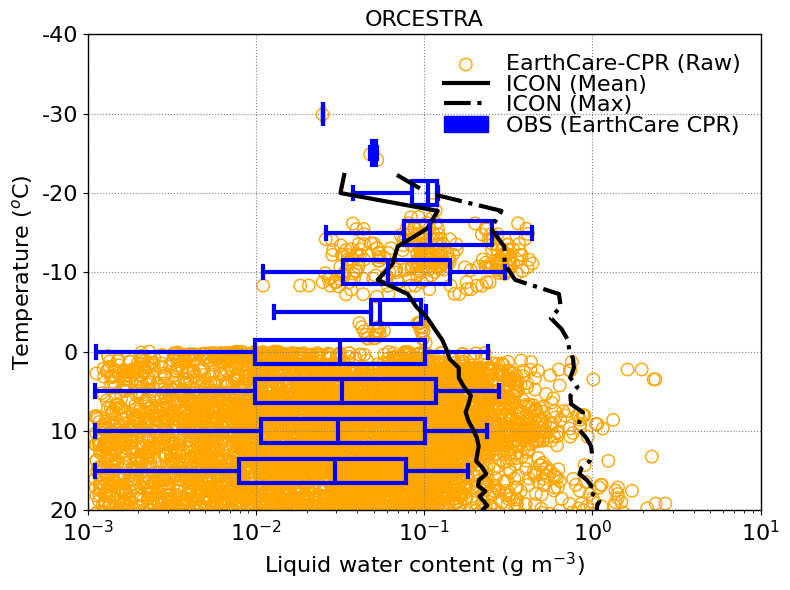

In [42]:


## ============== ICON
w_thres = 2.
thres_q = 1.e-6
###### Without SIP
# lwc gperm3
lwc_4sip_gperm3 = xr.where((ds_filt_hf_4sip.lwc_gperm3 > thres_q), ds_filt_hf_4sip.lwc_gperm3, np.nan)
median_lwc_4sip_gperm3 = lwc_4sip_gperm3.median(dim=('time','ncells'))
mean_lwc_4sip_gperm3 = lwc_4sip_gperm3.mean(dim=('time','ncells'))
min_lwc_4sip_gperm3 = lwc_4sip_gperm3.min(dim=('time','ncells'))
max_lwc_4sip_gperm3 = lwc_4sip_gperm3.max(dim=('time','ncells'))
avg_tempc_4sip = ds_filt_hf_4sip.tempc.mean(dim=('time','ncells')) 

std_lwc_4sip_gperm3 = lwc_4sip_gperm3.std(dim=('time', 'ncells'), skipna=True)
count_lwc_4sip_gperm3 = lwc_4sip_gperm3.count(dim=('time', 'ncells'))
se_lwc_4sip_gperm3 = std_lwc_4sip_gperm3 / np.sqrt(count_lwc_4sip_gperm3)


fnt=16;
ln=3;
ln1=3;
al1=1.#0.4;
al2=1.#0.6;
al3=0.8
alpha=al2;
wd=3
fig, ax = plt.subplots(figsize=(8,6))

ax.boxplot(lwc_ec_by_bin, positions=tempc_bin, vert=False, patch_artist=True, widths=wd,
           boxprops=dict(facecolor='none', edgecolor='blue', linewidth=ln, alpha=al2),
           medianprops=dict(color='blue', linewidth=ln),
           whiskerprops=dict(linewidth=ln, color='blue', alpha=al2),
           capprops=dict(linewidth=ln, color='blue', alpha=al2), showfliers=False)


ax.scatter(df_lwc_ec_raw['lwc_ec'], df_lwc_ec_raw['tempc'], marker='o', s=80, 
           facecolors='none', edgecolors='orange', alpha=al1, label='EarthCare-CPR (Raw)')


#ax.plot(median_lwc_4sip_gperm3, avg_tempc_4sip, 'k--', linewidth=ln, label='ICON (Median)');
#ax.plot(mean_lwc_4sip_gperm3, avg_tempc_4sip, 'k-', linewidth=ln, label='ICON (Mean)');

#ax.plot(min_lwc_4sip_gperm3, avg_tempc_4sip, 'k:', linewidth=ln, label='ICON (Min)');
ax.plot(mean_lwc_4sip_gperm3, avg_tempc_4sip, 'k-', linewidth=ln, label='ICON (Mean)');
ax.plot(max_lwc_4sip_gperm3, avg_tempc_4sip, 'k-.', linewidth=ln, label='ICON (Max)');

# Set the scale to log for the x-axis
ax.set_xscale('log')
ax.set_xlim(1.e-3, 1.e1)
ax.set_xticks([1.e-3, 1.e-2, 1.e-1, 1.e0, 1.e1])
#ax.set_xticklabels([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6], fontsize=fontsize)

ax.set_xlabel('Liquid water content (g m$^{-3}$)', fontsize=fnt)
ax.tick_params(axis='x', labelsize=fnt)

# Set y-axis labels
ax.set_ylim(20, -40)
ax.set_ylabel('Temperature ($^{o}$C)', fontsize=fnt)
ax.set_yticks([20, 10, 0, -10, -20, -30, -40])
ax.set_yticklabels(['20', '10', '0', '-10', '-20', '-30', '-40'], fontsize=fnt)


ax.set_title('ORCESTRA', fontsize=fnt)

# Customize grid
ax.grid(True, linestyle=':', color='grey', alpha=alpha)

# Add legends for boxplots and ICON line
handles, labels = ax.get_legend_handles_labels()

obs_icon_patch = mpatches.Patch(color='black', label='ICON')
obs_cip_patch = mpatches.Patch(color='blue', label='OBS (EarthCare CPR)')

#ax.legend(handles=handles + [obs_icon_patch, obs_cip_patch, obs_hvps_patch], frameon=False, loc='best', fontsize=fnt)
ax.legend(handles=handles + [obs_cip_patch], labelspacing=0.02, frameon=False, loc='best', fontsize=fnt)

# Customize axis spines
#ax.spines['top'].set_visible(False)
#ax.spines['right'].set_visible(False)
#ax.spines['left'].set_linewidth(2)
#ax.spines['bottom'].set_linewidth(2)

for spine in ['top', 'bottom', 'left', 'right']:
    ax.spines[spine].set_visible(True)
    ax.spines[spine].set_linewidth(1)
    ax.spines[spine].set_color('black')
# Display the plot
plt.tight_layout()
plt.show()

In [43]:

####================== Boxplot of ICON-IWC [3-SIP]
mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16

mask = (ds_ec_orc.iwc_1km > 0.) & (ds_ec_orc.iwc_1km > 1.e-4) & (ds_ec_orc.iwc_1km != 9.96921e+36)# & (ds_ec_orc.lwc1_1km < 12.)
filt_iwc_1km_ec = xr.where(mask, ds_ec_orc.iwc_1km, np.nan)
median_iwc_1km_ec = filt_iwc_1km_ec.mean('time')

w_thres = 2.
thres_q = 1.e-6
###### Without SIP
# lwc gperm3
iwc_ec_gperm3 = filt_iwc_1km_ec 
tempc_ec = filt_temp_ec-273.16

iwc_ec_gperm3 = iwc_ec_gperm3.values.flatten()
tempc_ec = tempc_ec.values.flatten()

df_iwc_ec_raw = pd.DataFrame({
    'iwc_ec': iwc_ec_gperm3,
    'tempc': tempc_ec,
})

df_iwc_ec = pd.DataFrame({
    'iwc_ec': iwc_ec_gperm3,
    'tempc': tempc_ec,
})

#print(df_lwc_ec)

tempc_bin = np.arange(-60., 0., 5.)  # Temperature bins 
tempc_bin = np.sort(tempc_bin)

df_iwc_ec['temp_bin'] = np.digitize(df_iwc_ec['tempc'], bins=tempc_bin, right=False)

bin_edges = np.concatenate([tempc_bin - 2, [tempc_bin[-1] + 2]])  
df_iwc_ec['temp_bin'] = bin_edges[df_iwc_ec['temp_bin']]

df_iwc_ec = df_iwc_ec[['iwc_ec', 'temp_bin']].dropna()

df_iwc_ec = df_iwc_ec.dropna(subset=['temp_bin'])

print(df_iwc_ec)

#lwc_ec_by_bin = [df_lwc_ec[df_lwc_ec['temp_bin'] == temp]['lwc_ec'].values for temp in bin_edges]
bin_labels = sorted(df_iwc_ec['temp_bin'].unique())
iwc_ec_by_bin = [df_iwc_ec[df_iwc_ec['temp_bin'] == t]['iwc_ec'].values for t in bin_labels]

#print(iwc_ec_by_bin)

         iwc_ec  temp_bin
87     0.002088     -42.0
88     0.002677     -42.0
89     0.003234     -42.0
90     0.003455     -37.0
91     0.003378     -37.0
...         ...       ...
88709  0.006861     -12.0
88710  0.009094     -12.0
88711  0.006884      -7.0
88712  0.003108      -7.0
88713  0.001784      -7.0

[23610 rows x 2 columns]


In [10]:
ds_filt_hf_nosip

<xarray.Dataset> Size: 2GB
Dimensions:      (time: 11, ncells: 13603, vertices: 3, height: 65, bnds: 2,
                  plev: 1, plev_2: 1, plev_3: 1, height_2: 66)
Coordinates:
  * time         (time) datetime64[ns] 88B 2024-09-03T16:00:00 ... 2024-09-03...
    clon         (ncells) float64 109kB dask.array<chunksize=(13603,), meta=np.ndarray>
    clat         (ncells) float64 109kB dask.array<chunksize=(13603,), meta=np.ndarray>
  * height       (height) float64 520B 1.0 2.0 3.0 4.0 ... 62.0 63.0 64.0 65.0
  * height_2     (height_2) float64 528B 1.0 2.0 3.0 4.0 ... 63.0 64.0 65.0 66.0
  * plev         (plev) float64 8B 800.0
  * plev_2       (plev_2) float64 8B 400.0
  * plev_3       (plev_3) float64 8B 0.0
Dimensions without coordinates: ncells, vertices, bnds
Data variables: (12/52)
    clon_bnds    (time, ncells, vertices) float64 4MB dask.array<chunksize=(1, 13603, 3), meta=np.ndarray>
    clat_bnds    (time, ncells, vertices) float64 4MB dask.array<chunksize=(1, 13603, 3), meta=np.ndarray>
    height_bnds  (time, height, bnds) float64 11kB dask.array<chunksize=(1, 65, 2), meta=np.ndarray>
    plev_bnds    (time, plev, bnds) float64 176B dask.array<chunksize=(1, 1, 2), meta=np.ndarray>
    plev_2_bnds  (time, plev_2, bnds) float64 176B dask.array<chunksize=(1, 1, 2), meta=np.ndarray>
    plev_3_bnds  (time, plev_3, bnds) float64 176B dask.array<chunksize=(1, 1, 2), meta=np.ndarray>
    ...           ...
    tq           (time, height, ncells) float32 39MB dask.array<chunksize=(1, 65, 13603), meta=np.ndarray>
    ciwc_gperm3  (time, height, ncells) float32 39MB dask.array<chunksize=(1, 65, 13603), meta=np.ndarray>
    tiwc_gperm3  (time, height, ncells) float32 39MB dask.array<chunksize=(1, 65, 13603), meta=np.ndarray>
    cdnc_percm3  (time, height, ncells) float32 39MB dask.array<chunksize=(1, 65, 13603), meta=np.ndarray>
    tinc_perl    (time, height, ncells) float32 39MB dask.array<chunksize=(1, 65, 13603), meta=np.ndarray>
    cinc_perl    (time, height, ncells) float32 39MB dask.array<chunksize=(1, 65, 13603), meta=np.ndarray>
Attributes:
    CDI:                  Climate Data Interface version 2.4.0 (https://mpime...
    Conventions:          CF-1.6
    number_of_grid_used:  99
    uuidOfHGrid:          572c63b4-5951-d138-93bd-61b05c102860
    uuidOfVGrid:          567425a0-32bf-151c-3811-4389b7cd21e0
    institution:          Max Planck Institute for Meteorology/Deutscher Wett...
    title:                ICON simulation
    source:               version: 2024.10; revision: 6f8e58b4040c0905b72f63e...
    history:              /home/b/b382718/continental_cases/phil_ds_julian/ic...
    references:           see MPIM/DWD publications
    comment:              Deepak Waman (b382718) on l10462 (Linux 4.18.0-513....

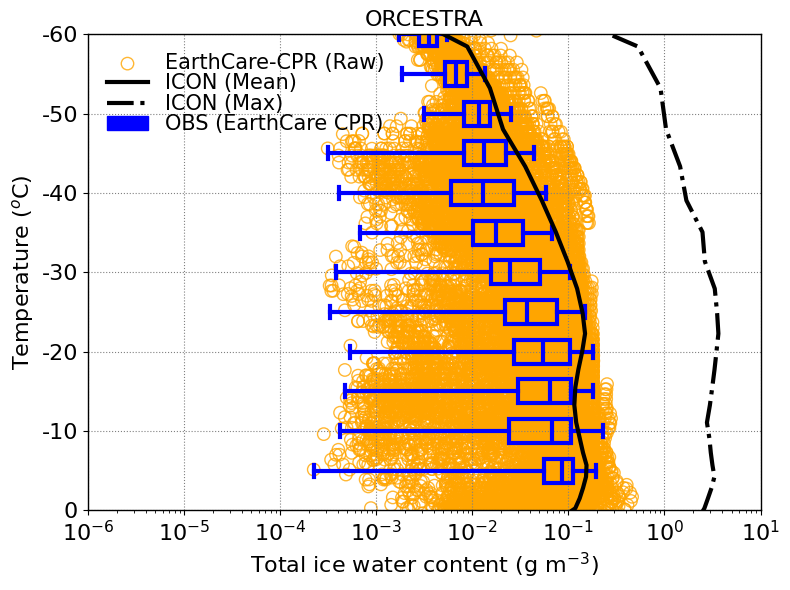

In [101]:


## ============== ICON
w_thres = 2.
thres_q = 1.e-4

###### With SIP
iwc_4sip_gperm3 = xr.where((ds_filt_hf_4sip.tiwc_gperm3 > thres_q), ds_filt_hf_4sip.tiwc_gperm3, np.nan)
median_iwc_4sip_gperm3 = iwc_4sip_gperm3.median(dim=('time','ncells'))
mean_iwc_4sip_gperm3 = iwc_4sip_gperm3.mean(dim=('time','ncells'))
min_iwc_4sip_gperm3 = ds_filt_hf_4sip.tiwc_gperm3.min(dim=('time','ncells')) #iwc_4sip_gperm3.min(dim=('time','ncells'))
max_iwc_4sip_gperm3 = iwc_4sip_gperm3.max(dim=('time','ncells'))
avg_tempc_4sip = ds_filt_hf_4sip.tempc.mean(dim=('time','ncells')) 

std_iwc_4sip_gperm3 = iwc_4sip_gperm3.std(dim=('time', 'ncells'), skipna=True)
count_iwc_4sip_gperm3 = iwc_4sip_gperm3.count(dim=('time', 'ncells'))
se_iwc_4sip_gperm3 = std_iwc_4sip_gperm3 / np.sqrt(count_iwc_4sip_gperm3)




fnt=16;
ln=3;
ln1=3;
al1=1.#0.4;
al2=1.#0.6;
al3=0.8
alpha=al2;
wd=3
fig, ax = plt.subplots(figsize=(8,6))

ax.boxplot(iwc_ec_by_bin[:-1], positions=tempc_bin, vert=False, patch_artist=True, widths=wd,
           boxprops=dict(facecolor='none', edgecolor='blue', linewidth=ln, alpha=al2),
           medianprops=dict(color='blue', linewidth=ln),
           whiskerprops=dict(linewidth=ln, color='blue', alpha=al2),
           capprops=dict(linewidth=ln, color='blue', alpha=al2), showfliers=False)


ax.scatter(df_iwc_ec_raw['iwc_ec'], df_iwc_ec_raw['tempc'], marker='o', s=80, 
           facecolors='none', edgecolors='orange', alpha=al3, label='EarthCare-CPR (Raw)')

#ax.plot(median_iwc_4sip_gperm3, avg_tempc_4sip, 'k--', linewidth=ln, label='ICON (Median)');
#ax.plot(mean_iwc_4sip_gperm3, avg_tempc_4sip, 'k-', linewidth=ln, label='ICON (SIP)');
##ax.plot(max_iwc_4sip_gperm3, avg_tempc_4sip, 'k:', linewidth=ln, label='ICON (Max)');

#ax.plot(min_iwc_4sip_gperm3, avg_tempc_4sip, 'k:', linewidth=ln, label='ICON (Min)');
ax.plot(mean_iwc_4sip_gperm3, avg_tempc_4sip, 'k-', linewidth=ln, label='ICON (Mean)');
ax.plot(max_iwc_4sip_gperm3, avg_tempc_4sip, 'k-.', linewidth=ln, label='ICON (Max)');

# Set the scale to log for the x-axis
ax.set_xscale('log')
ax.set_xlim(1.e-6, 1.e1)
#ax.set_xticks([1.e-4, 1.e-3, 1.e-2, 1.e-1, 1.e0, 1.e1, 1.e2])
#ax.set_xticklabels([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6], fontsize=fontsize)

ax.set_xlabel('Total ice water content (g m$^{-3}$)', fontsize=fnt)
ax.tick_params(axis='x', labelsize=fnt)

# Set y-axis labels
ax.set_ylim(0, -60)
ax.set_ylabel('Temperature ($^{o}$C)', fontsize=fnt)
ax.set_yticks([0, -10, -20, -30, -40, -50, -60])
ax.set_yticklabels(['0', '-10', '-20', '-30', '-40', '-50', '-60'], fontsize=fnt)


ax.set_title('ORCESTRA', fontsize=fnt)

# Customize grid
ax.grid(True, linestyle=':', color='grey', alpha=alpha)

# Add legends for boxplots and ICON line
handles, labels = ax.get_legend_handles_labels()

obs_icon_patch = mpatches.Patch(color='black', label='ICON')
obs_cip_patch = mpatches.Patch(color='blue', label='OBS (EarthCare CPR)')

#ax.legend(handles=handles + [obs_icon_patch, obs_cip_patch, obs_hvps_patch], frameon=False, loc='best', fontsize=fnt)
ax.legend(handles=handles + [obs_cip_patch], frameon=False, labelspacing=0.02, loc='best', fontsize=fnt-1)

# Customize axis spines
#ax.spines['top'].set_visible(False)
#ax.spines['right'].set_visible(False)
#ax.spines['left'].set_linewidth(2)
#ax.spines['bottom'].set_linewidth(2)

for spine in ['top', 'bottom', 'left', 'right']:
    ax.spines[spine].set_visible(True)
    ax.spines[spine].set_linewidth(1)
    ax.spines[spine].set_color('black')

plt.tight_layout()
plt.show()

In [125]:
ds_ec_orc

<xarray.Dataset> Size: 17MB
Dimensions:                 (time: 431, height: 206)
Coordinates:
  * time                    (time) object 3kB 2024-09-03T16:08:25.639902+00:0...
    height                  (time, height) float32 355kB 2e+04 ... -500.0
    lon                     (time) float64 3kB -30.37 -30.37 ... -31.12 -31.12
    lat                     (time) float64 3kB 10.99 10.98 10.97 ... 7.019 7.007
Data variables: (12/52)
    longitude               (time) float64 3kB -30.37 -30.37 ... -31.12 -31.12
    latitude                (time) float64 3kB 10.99 10.98 10.97 ... 7.019 7.007
    altitude                (time, height) float32 355kB 2e+04 ... -500.0
    pressure                (time, height) float32 355kB -9.999e+03 ... -9.99...
    temperature             (time, height) float32 355kB -9.999e+03 ... -9.99...
    relhum_1km              (time, height) float32 355kB -9.999e+03 ... -9.99...
    ...                      ...
    tinc_10km               (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tinc_1km                (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tcwnc_10km              (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tcwnc_1km               (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    refl_cpr_10km           (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    refl_cpr_1km            (time, height) float32 355kB 9.969e+36 ... 9.969e+36

In [55]:

####================== Boxplot of ICON-IWC [3-SIP]
mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16

mask = (ds_ec_orc.tinc_10km > 0.) & (ds_ec_orc.tinc_1km != 9.96921e+36) # & (ds_ec_orc.lwc1_1km < 12.)
filt_tinc_1km_ec = xr.where(mask, ds_ec_orc.tinc_10km, np.nan)
median_tinc_1km_ec = filt_tinc_1km_ec.mean('time')

w_thres = 2.
thres_q = 1.e-6
###### Without SIP
# lwc gperm3
tinc_ec_perl = filt_tinc_1km_ec 
tempc_ec = filt_temp_ec-273.16

tinc_ec_perl = tinc_ec_perl.values.flatten()
tempc_ec = tempc_ec.values.flatten()

df_tinc_ec_raw = pd.DataFrame({
    'tinc_ec': tinc_ec_perl,
    'tempc': tempc_ec,
})

df_tinc_ec = pd.DataFrame({
    'tinc_ec': tinc_ec_perl,
    'tempc': tempc_ec,
})

#print(df_lwc_ec)

tempc_bin = np.arange(-60., 0., 5.)  # Temperature bins 
tempc_bin = np.sort(tempc_bin)

df_tinc_ec['temp_bin'] = np.digitize(df_tinc_ec['tempc'], bins=tempc_bin, right=False)

bin_edges = np.concatenate([tempc_bin - 2, [tempc_bin[-1] + 2]])  
df_tinc_ec['temp_bin'] = bin_edges[df_tinc_ec['temp_bin']]

df_tinc_ec = df_tinc_ec[['tinc_ec', 'temp_bin']].dropna()

df_tinc_ec = df_tinc_ec.dropna(subset=['temp_bin'])

print(df_tinc_ec)

#lwc_ec_by_bin = [df_lwc_ec[df_lwc_ec['temp_bin'] == temp]['lwc_ec'].values for temp in bin_edges]
bin_labels = sorted(df_tinc_ec['temp_bin'].unique())
tinc_ec_by_bin = [df_tinc_ec[df_tinc_ec['temp_bin'] == t]['tinc_ec'].values for t in bin_labels]

#print(iwc_ec_by_bin)

            tinc_ec  temp_bin
87     94207.640625     -42.0
88     64738.019531     -42.0
89     50931.429688     -42.0
90     43456.429688     -37.0
91     41696.363281     -37.0
...             ...       ...
88711  31799.835938      -7.0
88712  25831.042969      -7.0
88713  12995.394531      -7.0
88714   9451.130859      -7.0
88715   6588.619629      -7.0

[25339 rows x 2 columns]


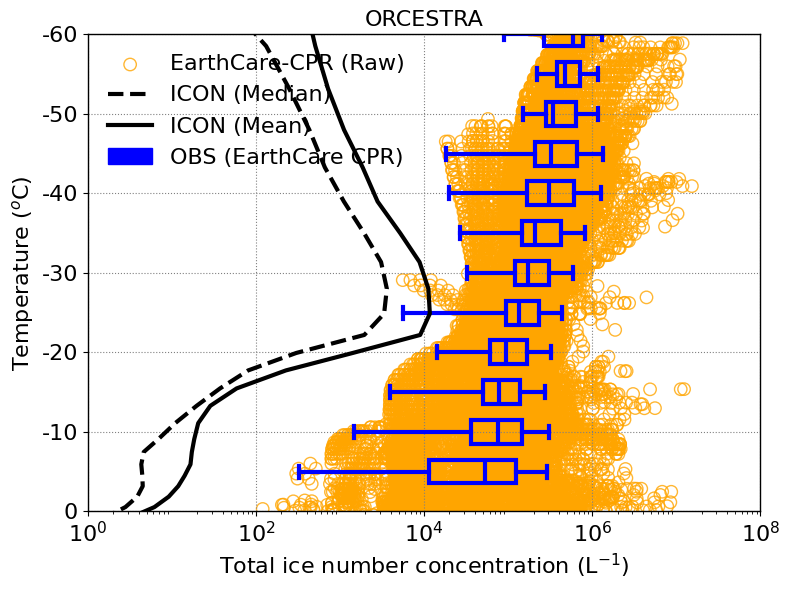

In [23]:


## ============== ICON
w_thres = 2.
thres_q = 1.e0
###### Without SIP

ds = ds_filt_hf_4sip.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:10:00.000000000'))

tinc_4sip_perl = xr.where((ds.inc_perl > thres_q), ds.inc_perl, np.nan)
median_tinc_4sip_perl = tinc_4sip_perl.median(dim=('time','ncells'))
mean_tinc_4sip_perl = tinc_4sip_perl.mean(dim=('time','ncells'))
min_tinc_4sip_perl = tinc_4sip_perl.min(dim=('time','ncells'))
max_tinc_4sip_perl = tinc_4sip_perl.max(dim=('time','ncells'))
avg_tempc_4sip = ds_filt_hf_4sip.tempc.mean(dim=('time','ncells')) 

std_tinc_4sip_perl = tinc_4sip_perl.std(dim=('time', 'ncells'), skipna=True)
count_tinc_4sip_perl = tinc_4sip_perl.count(dim=('time', 'ncells'))
se_tinc_4sip_perl = std_tinc_4sip_perl / np.sqrt(count_tinc_4sip_perl)


###### Without SIP
ds = ds_filt_hf_nosip.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:10:00.000000000'))
inc_nosip_up_perl = xr.where((ds.tqi > thres_q) & (ds.w_vel > w_thres), ds.inc_perl, np.nan)
median_inc_nosip_up_perl = inc_nosip_up_perl.median(dim=('time','ncells'))
mean_inc_nosip_up_perl = inc_nosip_up_perl.mean(dim=('time','ncells'))
min_inc_nosip_up_perl = inc_nosip_up_perl.min(dim=('time','ncells'))
max_inc_nosip_up_perl = inc_nosip_up_perl.max(dim=('time','ncells'))
avg_nosip_tempc = ds_nosip_new.tempc.mean(dim=('time','ncells')) 

std_inc_nosip_up_perl = inc_nosip_up_perl.std(dim=('time', 'ncells'), skipna=True)
count_inc_nosip_up_perl = inc_nosip_up_perl.count(dim=('time', 'ncells'))
se_inc_nosip_up_perl = std_inc_nosip_up_perl / np.sqrt(count_inc_nosip_up_perl)
## ================


fnt=16;
ln=3;
ln1=3;
al1=1.#0.4;
al2=1.#0.6;
al3=0.8
alpha=al2;
wd=3
fig, ax = plt.subplots(figsize=(8,6))

ax.boxplot(tinc_ec_by_bin[:-1], positions=tempc_bin, vert=False, patch_artist=True, widths=wd,
           boxprops=dict(facecolor='none', edgecolor='blue', linewidth=ln, alpha=al2),
           medianprops=dict(color='blue', linewidth=ln),
           whiskerprops=dict(linewidth=ln, color='blue', alpha=al2),
           capprops=dict(linewidth=ln, color='blue', alpha=al2), showfliers=False)

ax.scatter(df_tinc_ec_raw['tinc_ec'], df_tinc_ec_raw['tempc'], marker='o', s=80, 
           facecolors='none', edgecolors='orange', alpha=al3, label='EarthCare-CPR (Raw)')

#ax.plot(median_tinc_4sip_perl, avg_tempc_4sip, 'k--', linewidth=ln, label='ICON (Median)');
ax.plot(mean_tinc_4sip_perl, avg_tempc_4sip, 'k-', linewidth=ln, label='ICON (SIP)') #, label='ICON (Mean)');

#ax.plot(median_tinc_nosip_perl, avg_tempc_nosip, 'k--', linewidth=ln, label='ICON (Median)');
#ax.plot(mean_tinc_nosip_perl, avg_tempc_nosip, 'k-', linewidth=ln, label='ICON (No SIP)') #, label='ICON (Mean)');

# Set the scale to log for the x-axis
ax.set_xscale('log')
ax.set_xlim(1.e0, 1.e8)
ax.set_xticks([1.e0, 1.e2, 1.e4, 1.e6, 1.e8])
#ax.set_xticklabels([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6], fontsize=fontsize)

ax.set_xlabel('Total ice number concentration (L$^{-1}$)', fontsize=fnt)
ax.tick_params(axis='x', labelsize=fnt)

# Set y-axis labels
ax.set_ylim(0, -60)
ax.set_ylabel('Temperature ($^{o}$C)', fontsize=fnt)
ax.set_yticks([0, -10, -20, -30, -40, -50, -60])
ax.set_yticklabels(['0', '-10', '-20', '-30', '-40', '-50', '-60'], fontsize=fnt)


ax.set_title('ORCESTRA', fontsize=fnt)

# Customize grid
ax.grid(True, linestyle=':', color='grey', alpha=alpha)

# Add legends for boxplots and ICON line
handles, labels = ax.get_legend_handles_labels()

obs_icon_patch = mpatches.Patch(color='black', label='ICON')
obs_cip_patch = mpatches.Patch(color='blue', label='OBS (EarthCare CPR)')

#ax.legend(handles=handles + [obs_icon_patch, obs_cip_patch, obs_hvps_patch], frameon=False, loc='best', fontsize=fnt)
ax.legend(handles=handles + [obs_cip_patch], frameon=False, loc='best', fontsize=fnt)

# Customize axis spines
#ax.spines['top'].set_visible(False)
#ax.spines['right'].set_visible(False)
#ax.spines['left'].set_linewidth(2)
#ax.spines['bottom'].set_linewidth(2)

for spine in ['top', 'bottom', 'left', 'right']:
    ax.spines[spine].set_visible(True)
    ax.spines[spine].set_linewidth(1)
    ax.spines[spine].set_color('black')
# Display the plot
plt.tight_layout()
plt.show()

In [91]:

### Select curtain
ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

lon_ec = ds_ec_orc.lon.values
lat_ec = ds_ec_orc.lat.values

ds_4sip_regcord_curtain = ds_4sip_regcord.sel(lon=lon_ec, lat=lat_ec, method='nearest')

###
ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16
mean_ht_ec = 1.e-3*ds_ec_orc.altitude.mean('time')

mask = (ds_ec_orc.tinc_1km > 0.) & (ds_ec_orc.tinc_1km != 9.96921e+36)
filt_cinc_1km = xr.where(mask, ds_ec_orc.tinc_1km, np.nan)

###
ds_4sip_curtain = ds_4sip_regcord_curtain.sel(time=slice('2024-09-03T15:00:00.000000000','2024-09-03T17:00:00.000000000'))
filt_cinc_4sip = xr.where(ds_4sip_curtain.cinc_perl > 0., ds_4sip_curtain.cinc_perl, np.nan)
mean_temp_4sip = ds_4sip_curtain.tempc.mean(dim=('time','lon', 'lat'))
mean_ht_4sip = 1.e-3*ds_4sip_curtain.z_mc.mean(dim=('time','lon', 'lat'))
mean_cinc_4sip = filt_cinc_4sip.mean('time')
clon_4sip = ds_4sip_curtain.lon
clat_4sip = ds_4sip_curtain.lat


In [80]:
ds_4sip_regcord_curtain.time

<xarray.DataArray 'time' (time: 121)> Size: 968B
array(['2024-09-03T15:00:00.000000000', '2024-09-03T15:01:00.000000000',
       '2024-09-03T15:02:00.000000000', '2024-09-03T15:03:00.000000000',
       '2024-09-03T15:04:00.000000000', '2024-09-03T15:05:00.000000000',
       '2024-09-03T15:06:00.000000000', '2024-09-03T15:07:00.000000000',
       '2024-09-03T15:08:00.000000000', '2024-09-03T15:09:00.000000000',
       '2024-09-03T15:10:00.000000000', '2024-09-03T15:11:00.000000000',
       '2024-09-03T15:12:00.000000000', '2024-09-03T15:13:00.000000000',
       '2024-09-03T15:14:00.000000000', '2024-09-03T15:15:00.000000000',
       '2024-09-03T15:16:00.000000000', '2024-09-03T15:17:00.000000000',
       '2024-09-03T15:18:00.000000000', '2024-09-03T15:19:00.000000000',
       '2024-09-03T15:20:00.000000000', '2024-09-03T15:21:00.000000000',
       '2024-09-03T15:22:00.000000000', '2024-09-03T15:23:00.000000000',
       '2024-09-03T15:24:00.000000000', '2024-09-03T15:25:00.000000000',
       '2024-09-03T15:26:00.000000000', '2024-09-03T15:27:00.000000000',
       '2024-09-03T15:28:00.000000000', '2024-09-03T15:29:00.000000000',
       '2024-09-03T15:30:00.000000000', '2024-09-03T15:31:00.000000000',
       '2024-09-03T15:32:00.000000000', '2024-09-03T15:33:00.000000000',
       '2024-09-03T15:34:00.000000000', '2024-09-03T15:35:00.000000000',
       '2024-09-03T15:36:00.000000000', '2024-09-03T15:37:00.000000000',
       '2024-09-03T15:38:00.000000000', '2024-09-03T15:39:00.000000000',
       '2024-09-03T15:40:00.000000000', '2024-09-03T15:41:00.000000000',
       '2024-09-03T15:42:00.000000000', '2024-09-03T15:43:00.000000000',
       '2024-09-03T15:44:00.000000000', '2024-09-03T15:45:00.000000000',
       '2024-09-03T15:46:00.000000000', '2024-09-03T15:47:00.000000000',
       '2024-09-03T15:48:00.000000000', '2024-09-03T15:49:00.000000000',
       '2024-09-03T15:50:00.000000000', '2024-09-03T15:51:00.000000000',
       '2024-09-03T15:52:00.000000000', '2024-09-03T15:53:00.000000000',
       '2024-09-03T15:54:00.000000000', '2024-09-03T15:55:00.000000000',
       '2024-09-03T15:56:00.000000000', '2024-09-03T15:57:00.000000000',
       '2024-09-03T15:58:00.000000000', '2024-09-03T15:59:00.000000000',
       '2024-09-03T16:00:00.000000000', '2024-09-03T16:01:00.000000000',
       '2024-09-03T16:02:00.000000000', '2024-09-03T16:03:00.000000000',
       '2024-09-03T16:04:00.000000000', '2024-09-03T16:05:00.000000000',
       '2024-09-03T16:06:00.000000000', '2024-09-03T16:07:00.000000000',
       '2024-09-03T16:08:00.000000000', '2024-09-03T16:09:00.000000000',
       '2024-09-03T16:10:00.000000000', '2024-09-03T16:11:00.000000000',
       '2024-09-03T16:12:00.000000000', '2024-09-03T16:13:00.000000000',
       '2024-09-03T16:14:00.000000000', '2024-09-03T16:15:00.000000000',
       '2024-09-03T16:16:00.000000000', '2024-09-03T16:17:00.000000000',
       '2024-09-03T16:18:00.000000000', '2024-09-03T16:19:00.000000000',
       '2024-09-03T16:20:00.000000000', '2024-09-03T16:21:00.000000000',
       '2024-09-03T16:22:00.000000000', '2024-09-03T16:23:00.000000000',
       '2024-09-03T16:24:00.000000000', '2024-09-03T16:25:00.000000000',
       '2024-09-03T16:26:00.000000000', '2024-09-03T16:27:00.000000000',
       '2024-09-03T16:28:00.000000000', '2024-09-03T16:29:00.000000000',
       '2024-09-03T16:30:00.000000000', '2024-09-03T16:31:00.000000000',
       '2024-09-03T16:32:00.000000000', '2024-09-03T16:33:00.000000000',
       '2024-09-03T16:34:00.000000000', '2024-09-03T16:35:00.000000000',
       '2024-09-03T16:36:00.000000000', '2024-09-03T16:37:00.000000000',
       '2024-09-03T16:38:00.000000000', '2024-09-03T16:39:00.000000000',
       '2024-09-03T16:40:00.000000000', '2024-09-03T16:41:00.000000000',
       '2024-09-03T16:42:00.000000000', '2024-09-03T16:43:00.000000000',
       '2024-09-03T16:44:00.000000000', '2024-09-03T16:45:00.000000000',
       '2024-09-03T16:46:00.000000000', '2024-09-03T16:47:00.000000000',
       '2

In [57]:

####================== Boxplot of ICON-IWC [3-SIP]
mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16

mask = (ds_ec_orc.tinc_1km > 0.) & (ds_ec_orc.tinc_1km != 9.96921e+36)# & (ds_ec_orc.lwc1_1km < 12.)
filt_tinc_1km_ec = xr.where(mask, ds_ec_orc.tinc_1km, np.nan)
median_tinc_1km_ec = filt_tinc_1km_ec.mean('time')

w_thres = 2.
thres_q = 1.e-6
###### Without SIP
# lwc gperm3
tinc_ec_perl = 1.e-3*filt_tinc_1km_ec 
tempc_ec = filt_temp_ec-273.16

tinc_ec_perl = tinc_ec_perl.values.flatten()
tempc_ec = tempc_ec.values.flatten()

df_tinc_ec_raw = pd.DataFrame({
    'tinc_ec': tinc_ec_perl,
    'tempc': tempc_ec,
})

df_tinc_ec = pd.DataFrame({
    'tinc_ec': tinc_ec_perl,
    'tempc': tempc_ec,
})

#print(df_lwc_ec)

tempc_bin = np.arange(-60., 0., 5.)  # Temperature bins 
tempc_bin = np.sort(tempc_bin)

df_tinc_ec['temp_bin'] = np.digitize(df_tinc_ec['tempc'], bins=tempc_bin, right=False)

bin_edges = np.concatenate([tempc_bin - 2, [tempc_bin[-1] + 2]])  
df_tinc_ec['temp_bin'] = bin_edges[df_tinc_ec['temp_bin']]

df_tinc_ec = df_tinc_ec[['tinc_ec', 'temp_bin']].dropna()

df_tinc_ec = df_tinc_ec.dropna(subset=['temp_bin'])

print(df_tinc_ec)

#lwc_ec_by_bin = [df_lwc_ec[df_lwc_ec['temp_bin'] == temp]['lwc_ec'].values for temp in bin_edges]
bin_labels = sorted(df_tinc_ec['temp_bin'].unique())
tinc_ec_by_bin = [df_tinc_ec[df_tinc_ec['temp_bin'] == t]['tinc_ec'].values for t in bin_labels]

#print(iwc_ec_by_bin)

         tinc_ec  temp_bin
87     37.256523     -42.0
88     33.493977     -42.0
89     30.752640     -42.0
90     29.941950     -37.0
91     30.230854     -37.0
...          ...       ...
88709  42.240158     -12.0
88710  62.543121     -12.0
88711  60.239738      -7.0
88712  38.281361      -7.0
88713  35.565746      -7.0

[23610 rows x 2 columns]


In [167]:
ds_4sip_curtain

<xarray.Dataset> Size: 14GB
Dimensions:       (time: 7, lon: 431, lat: 431, height: 65, height_2: 66,
                   plev: 1, plev_2: 1, plev_3: 1, bnds: 2)
Coordinates:
  * time          (time) datetime64[ns] 56B 2024-09-03T16:04:00 ... 2024-09-0...
  * lon           (lon) float64 3kB -30.37 -30.37 -30.37 ... -31.12 -31.12
  * lat           (lat) float64 3kB 10.99 10.98 10.97 10.96 ... 7.03 7.02 7.01
  * height        (height) float64 520B 1.0 2.0 3.0 4.0 ... 62.0 63.0 64.0 65.0
  * height_2      (height_2) float64 528B 1.0 2.0 3.0 4.0 ... 64.0 65.0 66.0
  * plev          (plev) float64 8B 800.0
  * plev_2        (plev_2) float64 8B 400.0
  * plev_3        (plev_3) float64 8B 0.0
Dimensions without coordinates: bnds
Data variables: (12/54)
    height_bnds   (time, height, bnds) float64 7kB dask.array<chunksize=(1, 65, 2), meta=np.ndarray>
    plev_bnds     (time, plev, bnds) float64 112B dask.array<chunksize=(1, 1, 2), meta=np.ndarray>
    plev_2_bnds   (time, plev_2, bnds) float64 112B dask.array<chunksize=(1, 1, 2), meta=np.ndarray>
    plev_3_bnds   (time, plev_3, bnds) float64 112B dask.array<chunksize=(1, 1, 2), meta=np.ndarray>
    z_mc          (time, height, lat, lon) float32 338MB dask.array<chunksize=(1, 65, 401, 401), meta=np.ndarray>
    u             (time, height, lat, lon) float32 338MB dask.array<chunksize=(1, 65, 401, 401), meta=np.ndarray>
    ...            ...
    tinc_perl     (time, height, lat, lon) float32 338MB dask.array<chunksize=(1, 65, 401, 401), meta=np.ndarray>
    cinc_perl     (time, height, lat, lon) float32 338MB dask.array<chunksize=(1, 65, 401, 401), meta=np.ndarray>
    dz            (time, height, lat, lon) float32 338MB dask.array<chunksize=(1, 32, 401, 401), meta=np.ndarray>
    clwp_kgperm2  (time, lat, lon) float32 5MB dask.array<chunksize=(1, 401, 401), meta=np.ndarray>
    ciwp_kgperm2  (time, lat, lon) float32 5MB dask.array<chunksize=(1, 401, 401), meta=np.ndarray>
    rwp_kgperm2   (time, lat, lon) float32 5MB dask.array<chunksize=(1, 401, 401), meta=np.ndarray>
Attributes:
    CDI:          Climate Data Interface version 2.4.0 (https://mpimet.mpg.de...
    Conventions:  CF-1.6
    uuidOfVGrid:  567425a0-32bf-151c-3811-4389b7cd21e0
    institution:  Max Planck Institute for Meteorology/Deutscher Wetterdienst
    title:        ICON simulation
    source:       version: 2024.10; revision: f3f9a5624ca4223a7fe2f0c972e0850...
    history:      /home/b/b382718/continental_cases/4sip/icon-oct2024/bin/ico...
    references:   see MPIM/DWD publications
    comment:      Deepak Waman (b382718) on l20392 (Linux 4.18.0-513.24.1.el8...

In [180]:
print(ds_4sip_curtain.tinc_perl.min().values)

0.0


In [76]:
ds_4sip_curtain.time

<xarray.DataArray 'time' (time: 0)> Size: 0B
array([], dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 0B

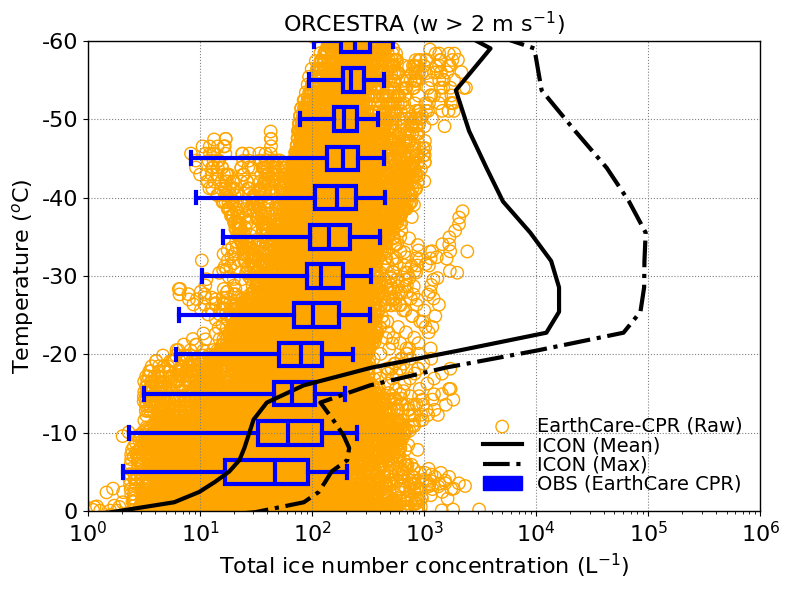

In [83]:


## ============== ICON
w_thres = 2.
thres_q = 1.e-6
###### Without SIP

ds = ds_4sip_curtain.sel(time=slice('2024-09-03T16:06:00.000000000','2024-09-03T16:10:00.000000000'))
mask= (ds.tinc_perl > thres_q) & (ds.tqi > 1.e-4) #& (ds.tinc_perl < 1.e5)
tinc_4sip_perl = xr.where(mask, ds.tinc_perl, np.nan)
median_tinc_4sip_perl = tinc_4sip_perl.median(dim=('time', 'lon', 'lat'))
mean_tinc_4sip_perl = tinc_4sip_perl.mean(dim=('time', 'lon', 'lat'))
min_tinc_4sip_perl = tinc_4sip_perl.min(dim=('time', 'lon', 'lat'))
max_tinc_4sip_perl = tinc_4sip_perl.max(dim=('time', 'lon', 'lat'))
avg_tempc_4sip = ds.tempc.mean(dim=('time', 'lon', 'lat')) 

std_tinc_4sip_perl = tinc_4sip_perl.std(dim=('time', 'lon', 'lat'), skipna=True)
count_tinc_4sip_perl = tinc_4sip_perl.count(dim=('time', 'lon', 'lat'))
se_tinc_4sip_perl = std_tinc_4sip_perl / np.sqrt(count_tinc_4sip_perl)

ds_filt_hf_nosip = ds_filt_hf_nosip.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:10:00.000000000'))

mask= (ds_filt_hf_nosip.tinc_perl > thres_q) #& (ds_filt_hf_nosip.tinc_perl < 1.e5)
tinc_nosip_perl = xr.where(mask, ds_filt_hf_nosip.tinc_perl, np.nan)
median_tinc_nosip_perl = tinc_nosip_perl.median(dim=('time', 'ncells'))
mean_tinc_nosip_perl = tinc_nosip_perl.mean(dim=('time', 'ncells'))
min_tinc_nosip_perl = tinc_nosip_perl.min(dim=('time', 'ncells'))
max_tinc_nosip_perl = tinc_nosip_perl.max(dim=('time', 'ncells'))
avg_tempc_nosip = ds_filt_hf_nosip.tempc.mean(dim=('time', 'ncells')) 

std_tinc_nosip_perl = tinc_nosip_perl.std(dim=('time', 'ncells'), skipna=True)
count_tinc_nosip_perl = tinc_nosip_perl.count(dim=('time', 'ncells'))
se_tinc_nosip_perl = std_tinc_nosip_perl / np.sqrt(count_tinc_nosip_perl)

fnt=16;
ln=3;
ln1=3;
al1=1.#0.4;
al2=1.#0.6;
al3=0.8
alpha=al2;
wd=3

plt.style.use('default')
fig, ax = plt.subplots(figsize=(8,6))

ax.boxplot(tinc_ec_by_bin[:-1], positions=tempc_bin, vert=False, patch_artist=True, widths=wd,
           boxprops=dict(facecolor='none', edgecolor='blue', linewidth=ln, alpha=al2),
           medianprops=dict(color='blue', linewidth=ln),
           whiskerprops=dict(linewidth=ln, color='blue', alpha=al2),
           capprops=dict(linewidth=ln, color='blue', alpha=al2), showfliers=False)



##ax.plot(median_tinc_4sip_perl, avg_tempc_4sip, 'k--', linewidth=ln, label='ICON (Median)');
#ax.plot(mean_tinc_4sip_perl, avg_tempc_4sip, 'k-', linewidth=ln, label='ICON (SIP)') #, label='ICON (Mean)');

##ax.plot(median_tinc_nosip_perl, avg_tempc_nosip, 'k--', linewidth=ln, label='ICON (Median)');
#ax.plot(mean_tinc_nosip_perl, avg_tempc_nosip, 'k--', linewidth=ln, label='ICON (No SIP)') #, label='ICON (Mean)');

ax.scatter(df_tinc_ec_raw['tinc_ec'], df_tinc_ec_raw['tempc'], marker='o', s=80, 
           facecolors='none', edgecolors='orange', alpha=al1, label='EarthCare-CPR (Raw)')


#ax.plot(min_tinc_4sip_perl, avg_tempc_4sip, 'k:', linewidth=ln, label='ICON (Min)');
ax.plot(mean_tinc_4sip_perl, avg_tempc_4sip, 'k-', linewidth=ln, label='ICON (Mean)');
ax.plot(max_tinc_4sip_perl, avg_tempc_4sip, 'k-.', linewidth=ln, label='ICON (Max)');

# Set the scale to log for the x-axis
ax.set_xscale('log')
ax.set_xlim(1.e0, 1.e6)
#ax.set_xticks([1.e0, 1.e1, 1.e2, 1.e3, 1.e4, 1.e5, 1.e6, 1.e7])
#ax.set_xticklabels([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6], fontsize=fontsize)

ax.set_xlabel('Total ice number concentration (L$^{-1}$)', fontsize=fnt)
ax.tick_params(axis='x', labelsize=fnt)

# Set y-axis labels
ax.set_ylim(0, -60)
ax.set_ylabel('Temperature ($^{o}$C)', fontsize=fnt)
ax.set_yticks([0, -10, -20, -30, -40, -50, -60])
ax.set_yticklabels(['0', '-10', '-20', '-30', '-40', '-50', '-60'], fontsize=fnt)


ax.set_title('ORCESTRA (w > 2 m s$^{-1}$)', fontsize=fnt)

# Customize grid
ax.grid(True, linestyle=':', color='grey', alpha=alpha)

# Add legends for boxplots and ICON line
handles, labels = ax.get_legend_handles_labels()

obs_icon_patch = mpatches.Patch(color='black', label='ICON')
obs_cip_patch = mpatches.Patch(color='blue', label='OBS (EarthCare CPR)')

#ax.legend(handles=handles + [obs_icon_patch, obs_cip_patch, obs_hvps_patch], frameon=False, loc='best', fontsize=fnt)
ax.legend(handles=handles + [obs_cip_patch], frameon=False, labelspacing=0.02, loc='best', fontsize=fnt-2)

# Customize axis spines
#ax.spines['top'].set_visible(False)
#ax.spines['right'].set_visible(False)
#ax.spines['left'].set_linewidth(2)
#ax.spines['bottom'].set_linewidth(2)

for spine in ['top', 'bottom', 'left', 'right']:
    ax.spines[spine].set_visible(True)
    ax.spines[spine].set_linewidth(1)
    ax.spines[spine].set_color('black')

plt.tight_layout()
plt.show()

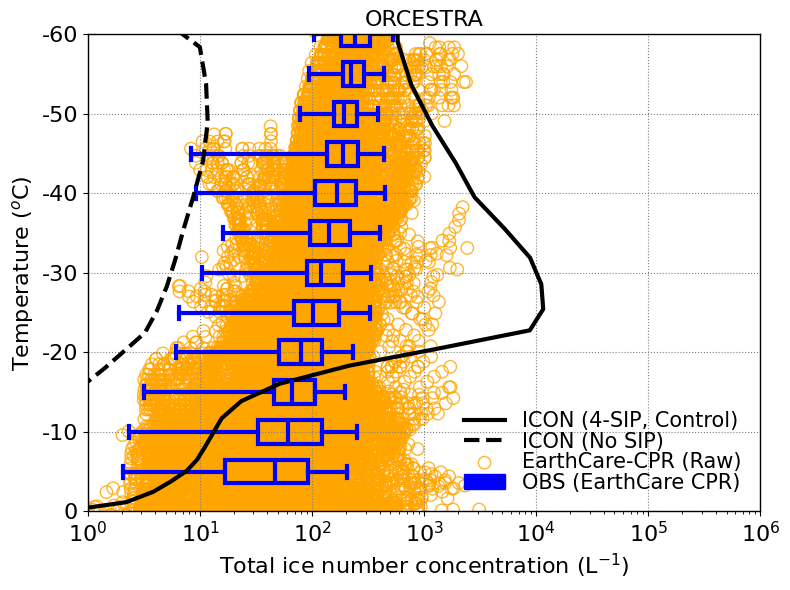

In [100]:


## ============== ICON
w_thres = 2.
thres_q = 1.e-6
###### Without SIP

ds = ds_4sip_curtain.sel(time=slice('2024-09-03T16:00:00.000000000','2024-09-03T16:14:00.000000000'))
mask= (ds.tqi > thres_q) & (ds.tinc_perl < 1.e5)
tinc_4sip_perl = xr.where(mask, ds.tinc_perl, np.nan)
median_tinc_4sip_perl = tinc_4sip_perl.median(dim=('time', 'lon', 'lat'))
mean_tinc_4sip_perl = tinc_4sip_perl.mean(dim=('time', 'lon', 'lat'))
min_tinc_4sip_perl = tinc_4sip_perl.min(dim=('time', 'lon', 'lat'))
max_tinc_4sip_perl = tinc_4sip_perl.max(dim=('time', 'lon', 'lat'))
avg_tempc_4sip = ds.tempc.mean(dim=('time', 'lon', 'lat')) 

std_tinc_4sip_perl = tinc_4sip_perl.std(dim=('time', 'lon', 'lat'), skipna=True)
count_tinc_4sip_perl = tinc_4sip_perl.count(dim=('time', 'lon', 'lat'))
se_tinc_4sip_perl = std_tinc_4sip_perl / np.sqrt(count_tinc_4sip_perl)

ds_filt_hf_nosip = ds_filt_hf_nosip.sel(time=slice('2024-09-03T15:44:00.000000000','2024-09-03T16:30:00.000000000'))

mask= (ds_filt_hf_nosip.tinc_perl > thres_q) & (ds_filt_hf_nosip.tinc_perl < 1.e5)
tinc_nosip_perl = xr.where(mask, ds_filt_hf_nosip.tinc_perl, np.nan)
median_tinc_nosip_perl = tinc_nosip_perl.median(dim=('time', 'ncells'))
mean_tinc_nosip_perl = tinc_nosip_perl.mean(dim=('time', 'ncells'))
min_tinc_nosip_perl = tinc_nosip_perl.min(dim=('time', 'ncells'))
max_tinc_nosip_perl = tinc_nosip_perl.max(dim=('time', 'ncells'))
avg_tempc_nosip = ds_filt_hf_nosip.tempc.mean(dim=('time', 'ncells')) 

std_tinc_nosip_perl = tinc_nosip_perl.std(dim=('time', 'ncells'), skipna=True)
count_tinc_nosip_perl = tinc_nosip_perl.count(dim=('time', 'ncells'))
se_tinc_nosip_perl = std_tinc_nosip_perl / np.sqrt(count_tinc_nosip_perl)

fnt=16;
ln=3;
ln1=3;
al1=1.#0.4;
al2=1.#0.6;
al3=0.8
alpha=al2;
wd=3
fig, ax = plt.subplots(figsize=(8,6))

ax.boxplot(tinc_ec_by_bin[:-1], positions=tempc_bin, vert=False, patch_artist=True, widths=wd,
           boxprops=dict(facecolor='none', edgecolor='blue', linewidth=ln, alpha=al2),
           medianprops=dict(color='blue', linewidth=ln),
           whiskerprops=dict(linewidth=ln, color='blue', alpha=al2),
           capprops=dict(linewidth=ln, color='blue', alpha=al2), showfliers=False)

#ax.plot(median_tinc_4sip_perl, avg_tempc_4sip, 'k--', linewidth=ln, label='ICON (Median)');
ax.plot(mean_tinc_4sip_perl, avg_tempc_4sip, 'k-', linewidth=ln, label='ICON (4-SIP, Control)');
ax.plot(mean_tinc_nosip_perl, avg_tempc_nosip, 'k--', linewidth=ln, label='ICON (No SIP)');

#ax.plot(median_tinc_nosip_perl, avg_tempc_nosip, 'r--', linewidth=ln, label='No SIP (Median)');
#ax.plot(mean_tinc_nosip_perl, avg_tempc_nosip, 'r-', linewidth=ln, label='No SIP (Mean)');

ax.scatter(df_tinc_ec_raw['tinc_ec'], df_tinc_ec_raw['tempc'], marker='o', s=80, 
           facecolors='none', edgecolors='orange', alpha=al3, label='EarthCare-CPR (Raw)')

# Set the scale to log for the x-axis
ax.set_xscale('log')
ax.set_xlim(1.e0, 1.e6)
#ax.set_xticks([1.e0, 1.e1, 1.e2, 1.e3, 1.e4, 1.e5, 1.e6, 1.e7])
#ax.set_xticklabels([1.e-4, 1.e-2, 1.e0, 1.e2, 1.e4, 1.e6], fontsize=fontsize)

ax.set_xlabel('Total ice number concentration (L$^{-1}$)', fontsize=fnt)
ax.tick_params(axis='x', labelsize=fnt)

# Set y-axis labels
ax.set_ylim(0, -60)
ax.set_ylabel('Temperature ($^{o}$C)', fontsize=fnt)
ax.set_yticks([0, -10, -20, -30, -40, -50, -60])
ax.set_yticklabels(['0', '-10', '-20', '-30', '-40', '-50', '-60'], fontsize=fnt)


ax.set_title('ORCESTRA', fontsize=fnt)

# Customize grid
ax.grid(True, linestyle=':', color='grey', alpha=alpha)

# Add legends for boxplots and ICON line
handles, labels = ax.get_legend_handles_labels()

obs_icon_patch = mpatches.Patch(color='black', label='ICON')
obs_cip_patch = mpatches.Patch(color='blue', label='OBS (EarthCare CPR)')

#ax.legend(handles=handles + [obs_icon_patch, obs_cip_patch, obs_hvps_patch], frameon=False, loc='best', fontsize=fnt)
ax.legend(handles=handles + [obs_cip_patch], frameon=False, labelspacing=0.02, loc='best', fontsize=fnt-1)

# Customize axis spines
#ax.spines['top'].set_visible(False)
#ax.spines['right'].set_visible(False)
#ax.spines['left'].set_linewidth(2)
#ax.spines['bottom'].set_linewidth(2)

for spine in ['top', 'bottom', 'left', 'right']:
    ax.spines[spine].set_visible(True)
    ax.spines[spine].set_linewidth(1)
    ax.spines[spine].set_color('black')

plt.tight_layout()
plt.show()

In [193]:
ds_ec_orc

<xarray.Dataset> Size: 17MB
Dimensions:                 (time: 431, height: 206)
Coordinates:
  * time                    (time) object 3kB 2024-09-03T16:08:25.639902+00:0...
    height                  (time, height) float32 355kB 2e+04 ... -500.0
    lon                     (time) float64 3kB -30.37 -30.37 ... -31.12 -31.12
    lat                     (time) float64 3kB 10.99 10.98 10.97 ... 7.019 7.007
Data variables: (12/52)
    longitude               (time) float64 3kB -30.37 -30.37 ... -31.12 -31.12
    latitude                (time) float64 3kB 10.99 10.98 10.97 ... 7.019 7.007
    altitude                (time, height) float32 355kB 2e+04 ... -500.0
    pressure                (time, height) float32 355kB -9.999e+03 ... -9.99...
    temperature             (time, height) float32 355kB -9.999e+03 ... -9.99...
    relhum_1km              (time, height) float32 355kB -9.999e+03 ... -9.99...
    ...                      ...
    tinc_10km               (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tinc_1km                (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tcwnc_10km              (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tcwnc_1km               (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    refl_cpr_10km           (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    refl_cpr_1km            (time, height) float32 355kB 9.969e+36 ... 9.969e+36

In [196]:
mask = (ds_4sip_regcord_curtain.tempc > -0.2) & (ds_4sip_regcord_curtain.tempc < 0.)
mean_freez_lev_4sip = 1.e-3*(ds_4sip_regcord_curtain.z_mc.where(mask)).mean(dim=('height','lon','lat'))
mask = (ds_4sip_regcord_curtain.tempc > -38.5) & (ds_4sip_regcord_curtain.tempc < -37.5)
mean_hom_lev_4sip = 1.e-3*(ds_4sip_regcord_curtain.z_mc.where(mask)).mean(dim=('height','lon','lat'))


ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)
mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)

mask = (filt_temp_ec-273.16 > -0.2) & (filt_temp_ec-273.16 < 0.)
mean_freez_lev_ec = 1.e-3*(ds_ec_orc.altitude.where(mask)).mean(dim=('height'))
mask = (filt_temp_ec-273.16 > -38.5) & (filt_temp_ec-273.16 < -37.5)
mean_hom_lev_ec = 1.e-3*(ds_ec_orc.altitude.where(mask)).mean(dim=('height'))

#plt.plot(ds_4sip.time, mean_hom_lev_4sip, 'k-', linewidth=ln, label='Control')

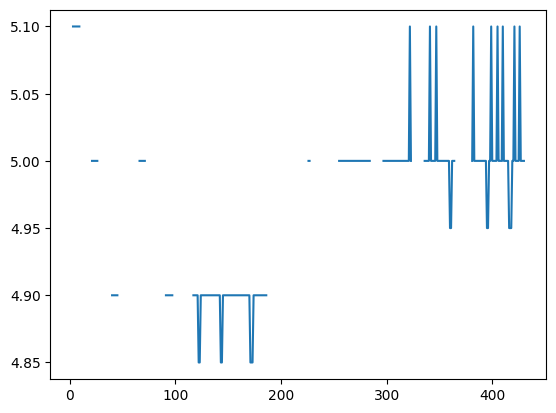

In [197]:
plt.plot(mean_freez_lev_ec)

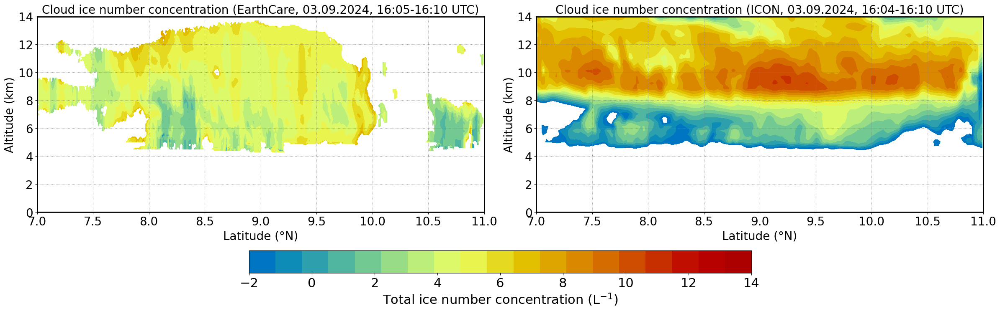

In [192]:

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16
mean_ht_ec = 1.e-3*ds_ec_orc.altitude.mean('time')

mask = (ds_ec_orc.tinc_1km > 0.) & (ds_ec_orc.tinc_1km != 9.96921e+36)
filt_cinc_1km = xr.where(mask, ds_ec_orc.tinc_1km, np.nan)

ds = ds_4sip_regcord_curtain.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:10:00.000000000'))
mask=(ds.tinc_perl > thres_q) & (ds.tinc_perl < 1.e5)
filt_tinc_4sip = xr.where(mask, ds.tinc_perl, np.nan)
filt_cinc_4sip = xr.where(mask, ds.cinc_perl, np.nan)
mean_temp_4sip = ds.tempc.mean(dim=('time','lon', 'lat'))
mean_ht_4sip = 1.e-3*ds.z_mc.mean(dim=('time','lon', 'lat'))
mean_tinc_4sip = filt_tinc_4sip.mean('time')
mean_cinc_4sip = filt_cinc_4sip.mean('time')
clon_4sip = ds.lon
clat_4sip = ds.lat

fnt=20
lev = np.linspace(-2, 14, 20)

plt.figure(figsize=(24,6))
plt.style.use('default')

plt.subplot(1,2,1)
#cnt=plt.contourf(ds_ec_orc.lon, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')
cnt=plt.contourf(ds_ec_orc.lat, mean_ht_ec, np.log(1.e-3*filt_cinc_1km.T), levels=lev, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
#colorbar = plt.colorbar(cnt, ticks=[0, 2, 4, 6, 8, 10, 12, 14])
#colorbar.ax.tick_params(labelsize=fnt)
#colorbar.set_label(label='Natural log of cloud-ice conc.', size=fnt)


plt.plot(ds_nosip.time, mean_freez_lev_nosip, '-', color='darkorchid', linewidth=ln)
plt.plot(ds_nosip.time, mean_hom_lev_nosip, '-', color='grey', linewidth=ln)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Cloud ice number concentration (EarthCare, 03.09.2024, 16:05-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    #plt.gca().spines['top'].set_visible(False)
    #plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(2)
    plt.gca().spines[spine].set_color('black')


plt.subplot(1,2,2)
cnt=plt.contourf(clat_4sip, mean_ht_4sip, np.log(mean_tinc_4sip.mean('lon')), levels=lev, cmap='pyart_HomeyerRainbow')#pyart_HomeyerRainbow')#pyart_NWSRef')
#colorbar = plt.colorbar(cnt, ticks=[0, 2, 4, 6, 8, 10, 12, 14])
#colorbar.ax.tick_params(labelsize=fnt)
#colorbar.set_label(label='Natural log of cloud-ice conc.', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Cloud ice number concentration (ICON, 03.09.2024, 16:04-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    #plt.gca().spines['top'].set_visible(False)
    #plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(2)
    plt.gca().spines[spine].set_color('black')


fig = plt.gcf()  # Get the current figure
cbar_ax = fig.add_axes([0.25, -0.1, 0.5, 0.09])  # [left, bottom, width, height]
cbar = fig.colorbar(cnt, cax=cbar_ax, ticks=[-2, 0, 2, 4, 6, 8, 10, 12, 14], orientation='horizontal')
cbar.set_label('Total ice number concentration (L$^{-1}$)', fontsize=fnt+2)
cbar.ax.tick_params(labelsize=fnt+2)

plt.tight_layout()
plt.show()

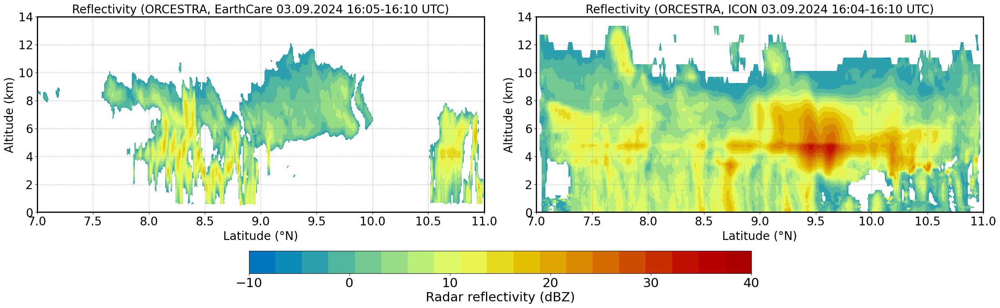

In [218]:

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16
mean_ht_ec = 1.e-3*ds_ec_orc.altitude.mean('time')

mask_refl = (ds_ec_orc.refl_cpr_1km > -5.) & (ds_ec_orc.refl_cpr_1km != 9.96921e+36)
filt_refl_1km = xr.where(mask_refl, ds_ec_orc.refl_cpr_1km, np.nan)

ds = ds_4sip_regcord_curtain.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:10:00.000000000'))
filt_refl_4sip = xr.where(ds.dbz > -5., ds.dbz, np.nan)
mean_temp_4sip = ds.tempc.mean(dim=('time','lon', 'lat'))
mean_ht_4sip = 1.e-3*ds.z_mc.mean(dim=('time','lon', 'lat'))
mean_refl_4sip = filt_refl_4sip.mean('time')
clon_4sip = ds.lon
clat_4sip = ds.lat

fnt=20
lev_refl = np.linspace(-10, 40, 20)

plt.figure(figsize=(24,6))
plt.style.use('default')

plt.subplot(1,2,1)
#cnt=plt.contourf(ds_ec_orc.lon, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')
cnt=plt.contourf(ds_ec_orc.lat, mean_ht_ec, filt_refl_1km.T, levels=lev_refl, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
#colorbar = plt.colorbar(cnt, ticks=[-5, 0, 5, 10, 15, 20, 25, 30, 35, 40])
#colorbar.ax.tick_params(labelsize=fnt)
#colorbar.set_label(label='Reflectivity (dBZ)', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Reflectivity (ORCESTRA, EarthCare 03.09.2024 16:05-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    #plt.gca().spines['top'].set_visible(False)
    #plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(2)
    plt.gca().spines[spine].set_color('black')


plt.subplot(1,2,2)
#cnt=plt.contourf(ds_ec_orc.lat, mean_temp_ec, filt_lwc1_1km.T, levels=lev_lwc, cmap='pyart_NWSRef')
#cnt=plt.contourf(ds_ec_orc.lat, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')#'HomeyerRainbow')
cnt=plt.contourf(clat_4sip, mean_ht_4sip, mean_refl_4sip.mean('lon'), levels=lev_refl, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
#colorbar = plt.colorbar(cnt, ticks=[-5, 0, 5, 10, 15, 20, 25, 30, 35, 40])
#colorbar.ax.tick_params(labelsize=fnt)
#colorbar.set_label(label='Reflectivity (dBZ)', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Reflectivity (ORCESTRA, ICON 03.09.2024 16:04-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    #plt.gca().spines['top'].set_visible(False)
    #plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(2)
    plt.gca().spines[spine].set_color('black')


fig = plt.gcf()  # Get the current figure
cbar_ax = fig.add_axes([0.25, -0.1, 0.5, 0.09])  # [left, bottom, width, height]
cbar = fig.colorbar(cnt, cax=cbar_ax, ticks=[-10, 0, 10, 20, 30, 40], orientation='horizontal')
cbar.set_label('Radar reflectivity (dBZ)', fontsize=fnt+2)
cbar.ax.tick_params(labelsize=fnt+2)

plt.tight_layout()
plt.show()

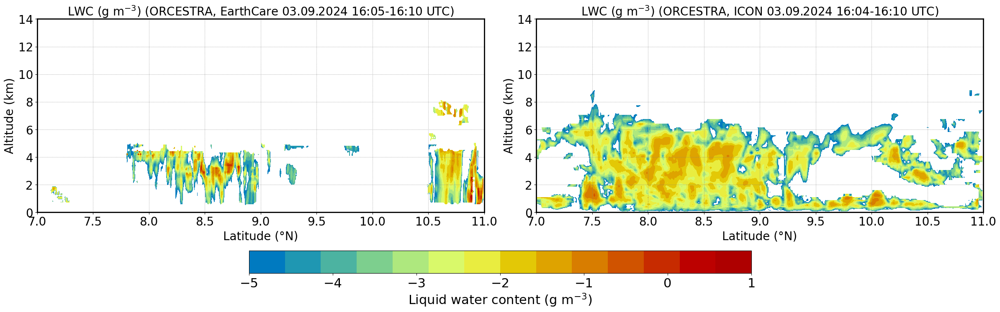

In [219]:

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16
mean_ht_ec = 1.e-3*ds_ec_orc.altitude.mean('time')

mask = (ds_ec_orc.lwc_1km > 0.) & (ds_ec_orc.lwc_1km != 9.96921e+36)
filt_lwc_1km = xr.where(mask, ds_ec_orc.lwc_1km, np.nan)

ds = ds_4sip_regcord_curtain.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:10:00.000000000'))
filt_lwc_4sip = xr.where(ds.lwc_gperm3 > 0., ds.lwc_gperm3, np.nan)
mean_temp_4sip = ds.tempc.mean(dim=('time','lon', 'lat'))
mean_ht_4sip = 1.e-3*ds.z_mc.mean(dim=('time','lon', 'lat'))
mean_lwc_4sip = filt_lwc_4sip.mean('time')
clon_4sip = ds.lon
clat_4sip = ds.lat

fnt=20
lev = np.linspace(-5, 1, 15)

plt.figure(figsize=(24,6))
plt.style.use('default')

plt.subplot(1,2,1)
#cnt=plt.contourf(ds_ec_orc.lon, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')
cnt=plt.contourf(ds_ec_orc.lat, mean_ht_ec, np.log(filt_lwc_1km.T), levels=lev, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
#colorbar = plt.colorbar(cnt, ticks=[-5, -4, -3, -2, -1, 0, 1])
#colorbar.ax.tick_params(labelsize=fnt)
#colorbar.set_label(label='Natural log of IWC', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('LWC (g m$^{-3}$) (ORCESTRA, EarthCare 03.09.2024 16:05-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    #plt.gca().spines['top'].set_visible(False)
    #plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(2)
    plt.gca().spines[spine].set_color('black')


plt.subplot(1,2,2)
#cnt=plt.contourf(ds_ec_orc.lat, mean_temp_ec, filt_lwc1_1km.T, levels=lev_lwc, cmap='pyart_NWSRef')
#cnt=plt.contourf(ds_ec_orc.lat, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')#'HomeyerRainbow')
cnt=plt.contourf(clat_4sip, mean_ht_4sip, np.log(mean_lwc_4sip.mean('lon')), levels=lev, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
#colorbar = plt.colorbar(cnt, ticks=[-5, -4, -3, -2, -1, 0, 1])
#colorbar.ax.tick_params(labelsize=fnt)
#colorbar.set_label(label='Natural log of IWC', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('LWC (g m$^{-3}$) (ORCESTRA, ICON 03.09.2024 16:04-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    #plt.gca().spines['top'].set_visible(False)
    #plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(2)
    plt.gca().spines[spine].set_color('black')


fig = plt.gcf()  # Get the current figure
cbar_ax = fig.add_axes([0.25, -0.1, 0.5, 0.09])  # [left, bottom, width, height]
cbar = fig.colorbar(cnt, cax=cbar_ax, ticks=[-5, -4, -3, -2, -1, 0, 1], orientation='horizontal')
cbar.set_label('Liquid water content (g m$^{-3}$)', fontsize=fnt+2)
cbar.ax.tick_params(labelsize=fnt+2)

plt.tight_layout()
plt.show()

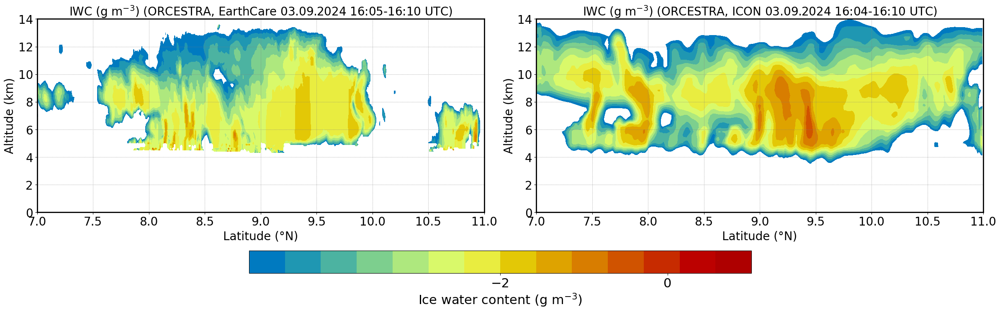

In [220]:

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16
mean_ht_ec = 1.e-3*ds_ec_orc.altitude.mean('time')

mask = (ds_ec_orc.iwc_1km > 0.) & (ds_ec_orc.iwc_1km != 9.96921e+36)
filt_tiwc_1km = xr.where(mask, ds_ec_orc.iwc_1km, np.nan)

ds = ds_4sip_regcord_curtain.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:10:00.000000000'))
filt_tiwc_4sip = xr.where(ds.tiwc_gperm3 > 0., ds.tiwc_gperm3, np.nan)
mean_temp_4sip = ds.tempc.mean(dim=('time','lon', 'lat'))
mean_ht_4sip = 1.e-3*ds.z_mc.mean(dim=('time','lon', 'lat'))
mean_tiwc_4sip = filt_tiwc_4sip.mean('time')
clon_4sip = ds.lon
clat_4sip = ds.lat

fnt=20
lev = np.linspace(-5, 1, 15)

plt.figure(figsize=(24,6))
plt.style.use('default')

plt.subplot(1,2,1)
#cnt=plt.contourf(ds_ec_orc.lon, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')
cnt=plt.contourf(ds_ec_orc.lat, mean_ht_ec, np.log(filt_tiwc_1km.T), levels=lev, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
#colorbar = plt.colorbar(cnt, ticks=[-5, -4, -3, -2, -1, 0, 1])
#colorbar.ax.tick_params(labelsize=fnt)
#colorbar.set_label(label='Natural log of IWC', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('IWC (g m$^{-3}$) (ORCESTRA, EarthCare 03.09.2024 16:05-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    #plt.gca().spines['top'].set_visible(False)
    #plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(2)
    plt.gca().spines[spine].set_color('black')


plt.subplot(1,2,2)
#cnt=plt.contourf(ds_ec_orc.lat, mean_temp_ec, filt_lwc1_1km.T, levels=lev_lwc, cmap='pyart_NWSRef')
#cnt=plt.contourf(ds_ec_orc.lat, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')#'HomeyerRainbow')
cnt=plt.contourf(clat_4sip, mean_ht_4sip, np.log(mean_tiwc_4sip.mean('lon')), levels=lev, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
#colorbar = plt.colorbar(cnt, ticks=[-5, -4, -3, -2, -1, 0, 1])
#colorbar.ax.tick_params(labelsize=fnt)
#colorbar.set_label(label='Natural log of IWC', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('IWC (g m$^{-3}$) (ORCESTRA, ICON 03.09.2024 16:04-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    #plt.gca().spines['top'].set_visible(False)
    #plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(2)
    plt.gca().spines[spine].set_color('black')


fig = plt.gcf()  # Get the current figure
cbar_ax = fig.add_axes([0.25, -0.1, 0.5, 0.09])  # [left, bottom, width, height]
cbar = fig.colorbar(cnt, cax=cbar_ax, ticks=[-2, 0, 2, 4, 6, 8, 10, 12, 14], orientation='horizontal')
cbar.set_label('Ice water content (g m$^{-3}$)', fontsize=fnt+2)
cbar.ax.tick_params(labelsize=fnt+2)

plt.tight_layout()
plt.show()

#### Kernel Density Estimate (KDE) plot
##### KDE plots provide a smoothed estimate of the data distribution, making it easier to compare the overall
##### shapes and modes of the two datasets. Libraries like seaborn or matplotlib can generate interactive KDE plots.
##### Overlaying KDEs for both datasets can highlight subtle differences or similarities in their distributions

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import h5py
from datetime import datetime

file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/lwp_iwp/GW1AM2_202409030345_218D_L2SGCLWLD2220220.h5'

# Open the HDF5 file
with h5py.File(file, 'r') as f:
    geophysical_data = f['Geophysical Data'][:]        # 3D (1976, 243, 1)
    #The original geophysical_data is in g/m2 (although defined as kg/m2) and its scale factor is given, apply it later 
    #to get 'true' CLWP 
    #geophysical_data = geophysical_data * g_data.attrs['SCALE FACTOR'][0]
    lat_0345 = f['Latitude of Observation Point'][:]   # 2D (1976, 243)
    lon_0345 = f['Longitude of Observation Point'][:]  # 2D (1976, 243)
    tim_0345 = f['Scan Time'][:]                       # 1D (1976)
    scan_time = f['Scan Time']
    g_data = f['Geophysical Data']
    for key in g_data.attrs.keys():                 
        print(f"{key}: {g_data.attrs[key]}")
    for key in scan_time.attrs.keys():                 # check the unit of time used
        print(f"{key}: {scan_time.attrs[key]}")

#time_hr_0345 = np.linspace(3.45, 4.34, 1976)

scale_factor = 0.001 # from the description of the data
# Extract LWP data and convert to float32
lwp_0345 = scale_factor*geophysical_data[:, :, 0].astype(np.float32) # 2D (1976, 243) [True CLWP in kg/m2]
lwp_0345[lwp_0345 < 0.] = np.nan

# Satellite time (epoch) starts from 01.01.1993, so time_0345 is actually recorded in seconds, say from epoch
# Get this converted to dd.mm.yyyy.hh.mm.ss format 
unix_seconds = tim_0345[0]
epoch_ec = datetime(1993, 1, 1, tzinfo=timezone.utc)
dt = epoch_ec + timedelta(seconds=float(unix_seconds))

time_ec0345 = np.array([epoch_ec + timedelta(seconds=float(s)) for s in tim_0345])

### Resample this data for ORCESTRA region
lon_min, lon_max = -32., -28.
lat_min, lat_max = 7, 11

mask_orc0345 = (lon_0345 >= lon_min) & (lon_0345 <= lon_max) & (lat_0345 >= lat_min) & (lat_0345 <= lat_max)

# Get indices of mask to get 'time' for which the EC sampled the ORCESTRA region: Update, this is not really needed as 
#time_ec0345 is enough for the selected region
indices_i, indices_j = np.where(mask_orc0345)
time_ec_orc = tim_0345[indices_j]

# Longitude & Latitude
lon_ec_orc0345 = np.ma.masked_where(~mask_orc0345, lon_0345)
lat_ec_orc0345 = np.ma.masked_where(~mask_orc0345, lat_0345)

#unix_seconds = time_ec_orc[0]
#time_ec_orc = np.array([epoch_ec + timedelta(seconds=float(s)) for s in time_ec_orc])

# Get lwp
lwp_ec_orc0345 = np.ma.masked_where(~mask_orc0345, lwp_0345)




SCALE FACTOR: [0.001]
UNIT: [b'Kg/m2']
SCALE FACTOR: [1.]
UNIT: [b'sec']


In [29]:

import numpy as np
import matplotlib.pyplot as plt
import h5py



file = '/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/lwp_iwp/GW1AM2_202409031427_081A_L2SGCLWLD2220220.h5'

# Open the HDF5 file
with h5py.File(file, 'r') as f:
    geophysical_data = f['Geophysical Data'][:]        # 3D (1976, 243, 1)
    lat_1427 = f['Latitude of Observation Point'][:]   # 2D (1976, 243)
    lon_1427 = f['Longitude of Observation Point'][:]  # 2D (1976, 243)
    tim_1427 = f['Scan Time'][:]                       # 1D (1976)
    #The original geophysical_data is in g/m2 (although defined as kg/m2) and its scale factor is given, apply it to get 'true' CLWP 
    #geophysical_data = geophysical_data * g_data.attrs['SCALE FACTOR'][0]
    scan_time = f['Scan Time']
    g_data = f['Geophysical Data']
    for key in g_data.attrs.keys():                 
        print(f"{key}: {g_data.attrs[key]}")
    for key in scan_time.attrs.keys():                 # check the unit of time used
        print(f"{key}: {scan_time.attrs[key]}")

#time_hr_1427 = np.linspace(14.27, 15.17, 1976)


scale_factor = 0.001 # from the description of the data

# Extract LWP data and convert to float32
lwp_1427 = scale_factor*geophysical_data[:, :, 0].astype(np.float32) # 2D (1976, 243) [True CLWP in kg/m2]
lwp_1427[lwp_1427 < 0.] = np.nan

# Satellite time (epoch) starts from 01.01.1993, so time_1427 is actually recorded in seconds, say from epoch
# Get this converted to dd.mm.yyyy.hh.mm.ss format 
unix_seconds = tim_1427[0]
epoch_ec = datetime(1993, 1, 1, tzinfo=timezone.utc)
dt = epoch_ec + timedelta(seconds=float(unix_seconds))

time_ec1427 = np.array([epoch_ec + timedelta(seconds=float(s)) for s in tim_1427])

### Resample this data for ORCESTRA region
lon_min, lon_max = -32., -28.
lat_min, lat_max = 7, 11

mask_orc1427 = (lon_1427 >= lon_min) & (lon_1427 <= lon_max) & (lat_1427 >= lat_min) & (lat_1427 <= lat_max)

# Get indices of mask to get 'time' for which the EC sampled the ORCESTRA region: Update, this is not really needed as 
#time_ec1427 is enough for the selected region
indices_i, indices_j = np.where(mask_orc1427)
time_ec_orc = tim_1427[indices_j]

# Longitude & Latitude
lon_ec_orc = np.ma.masked_where(~mask_orc1427, lon_1427)
lat_ec_orc = np.ma.masked_where(~mask_orc1427, lat_1427)

#unix_seconds = time_ec_orc[0]
#time_ec_orc = np.array([epoch_ec + timedelta(seconds=float(s)) for s in time_ec_orc])

# Get lwp
lwp_ec_orc1427 = np.ma.masked_where(~mask_orc1427, lwp_1427)



SCALE FACTOR: [0.001]
UNIT: [b'Kg/m2']
SCALE FACTOR: [1.]
UNIT: [b'sec']


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import h5py
from datetime import datetime

file_0345 = '/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/lwp_iwp/GW1AM2_202409030345_218D_L2SGCLWLD2220220.h5'
file_1427 = '/work/bk1415/b382718/output/orcestra/observations/earthcare/20240903_new/lwp_iwp/GW1AM2_202409031427_081A_L2SGCLWLD2220220.h5'

# Open the HDF5 file
with h5py.File(file_0345, 'r') as f:
    geophysical_data = f['Geophysical Data'][:]        # 3D (1976, 243, 1)
    #The original geophysical_data is in g/m2 (although defined as kg/m2) and its scale factor is given, apply it later 
    #to get 'true' CLWP 
    #geophysical_data = geophysical_data * g_data.attrs['SCALE FACTOR'][0]
    lat_0345 = f['Latitude of Observation Point'][:]   # 2D (1976, 243)
    lon_0345 = f['Longitude of Observation Point'][:]  # 2D (1976, 243)
    tim_0345 = f['Scan Time'][:]                       # 1D (1976)
    scan_time = f['Scan Time']
    g_data = f['Geophysical Data']
    for key in g_data.attrs.keys():                 
        print(f"{key}: {g_data.attrs[key]}")
    for key in scan_time.attrs.keys():                 # check the unit of time used
        print(f"{key}: {scan_time.attrs[key]}")

#time_hr_0345 = np.linspace(3.45, 4.34, 1976)

scale_factor = 0.001 # from the description of the data
# Extract LWP data and convert to float32
lwp_0345 = scale_factor*geophysical_data[:, :, 0].astype(np.float32) # 2D (1976, 243) [True CLWP in kg/m2]
lwp_0345[lwp_0345 < 0.] = np.nan

# Satellite time (epoch) starts from 01.01.1993, so time_0345 is actually recorded in seconds, say from epoch
# Get this converted to dd.mm.yyyy.hh.mm.ss format 
unix_seconds = tim_0345[0]
epoch_ec = datetime(1993, 1, 1, tzinfo=timezone.utc)
dt = epoch_ec + timedelta(seconds=float(unix_seconds))

time_ec0345 = np.array([epoch_ec + timedelta(seconds=float(s)) for s in tim_0345])

### Resample this data for ORCESTRA region
lon_min, lon_max = -32., -28.
lat_min, lat_max = 7, 11

mask_orc0345 = (lon_0345 >= lon_min) & (lon_0345 <= lon_max) & (lat_0345 >= lat_min) & (lat_0345 <= lat_max)

# Get indices of mask to get 'time' for which the EC sampled the ORCESTRA region: Update, this is not really needed as 
#time_ec0345 is enough for the selected region
indices_i, indices_j = np.where(mask_orc0345)
time_ec_orc = tim_0345[indices_j]

# Longitude & Latitude
lon_ec_orc0345 = np.ma.masked_where(~mask_orc0345, lon_0345)
lat_ec_orc0345 = np.ma.masked_where(~mask_orc0345, lat_0345)

#unix_seconds = time_ec_orc[0]
#time_ec_orc = np.array([epoch_ec + timedelta(seconds=float(s)) for s in time_ec_orc])

# Get lwp
lwp_ec_orc0345 = np.ma.masked_where(~mask_orc0345, lwp_0345)




# Open the HDF5 file
with h5py.File(file_1427, 'r') as f:
    geophysical_data = f['Geophysical Data'][:]        # 3D (1976, 243, 1)
    lat_1427 = f['Latitude of Observation Point'][:]   # 2D (1976, 243)
    lon_1427 = f['Longitude of Observation Point'][:]  # 2D (1976, 243)
    tim_1427 = f['Scan Time'][:]                       # 1D (1976)
    #The original geophysical_data is in g/m2 (although defined as kg/m2) and its scale factor is given, apply it to get 'true' CLWP 
    #geophysical_data = geophysical_data * g_data.attrs['SCALE FACTOR'][0]
    scan_time = f['Scan Time']
    g_data = f['Geophysical Data']
    for key in g_data.attrs.keys():                 
        print(f"{key}: {g_data.attrs[key]}")
    for key in scan_time.attrs.keys():                 # check the unit of time used
        print(f"{key}: {scan_time.attrs[key]}")

#time_hr_1427 = np.linspace(14.27, 15.17, 1976)


scale_factor = 0.001 # from the description of the data

# Extract LWP data and convert to float32
lwp_1427 = scale_factor*geophysical_data[:, :, 0].astype(np.float32) # 2D (1976, 243) [True CLWP in kg/m2]
lwp_1427[lwp_1427 < 0.] = np.nan

# Satellite time (epoch) starts from 01.01.1993, so time_1427 is actually recorded in seconds, say from epoch
# Get this converted to dd.mm.yyyy.hh.mm.ss format 
unix_seconds = tim_1427[0]
epoch_ec = datetime(1993, 1, 1, tzinfo=timezone.utc)
dt = epoch_ec + timedelta(seconds=float(unix_seconds))

time_ec1427 = np.array([epoch_ec + timedelta(seconds=float(s)) for s in tim_1427])

### Resample this data for ORCESTRA region
lon_min, lon_max = -32., -28.
lat_min, lat_max = 7, 11

mask_orc1427 = (lon_1427 >= lon_min) & (lon_1427 <= lon_max) & (lat_1427 >= lat_min) & (lat_1427 <= lat_max)

# Get indices of mask to get 'time' for which the EC sampled the ORCESTRA region: Update, this is not really needed as 
#time_ec1427 is enough for the selected region
indices_i, indices_j = np.where(mask_orc1427)
time_ec_orc = tim_1427[indices_j]

# Longitude & Latitude
lon_ec_orc = np.ma.masked_where(~mask_orc1427, lon_1427)
lat_ec_orc = np.ma.masked_where(~mask_orc1427, lat_1427)

#unix_seconds = time_ec_orc[0]
#time_ec_orc = np.array([epoch_ec + timedelta(seconds=float(s)) for s in time_ec_orc])

# Get lwp
lwp_ec_orc1427 = np.ma.masked_where(~mask_orc1427, lwp_1427)


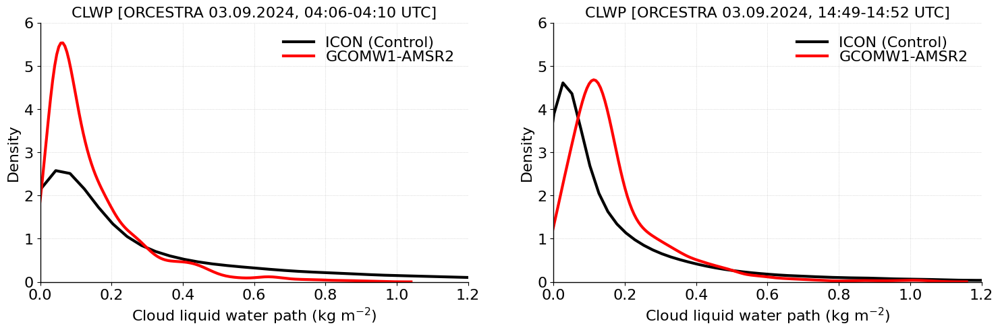

In [33]:
import seaborn as sns

clwp_4sip0400_hf = ds_4sip_hfreq.clwp_kgperm2.sel(time=slice('2024-09-03T04:06:00.000000000','2024-09-03T04:10:00.000000000')).mean(dim='time').values
clwp_4sip0400_hf[clwp_4sip0400_hf <= 0.] = np.nan

clwp_4sip1500_hf = ds_4sip_hfreq.clwp_kgperm2.sel(time=slice('2024-09-03T14:50:00.000000000','2024-09-03T14:52:00.000000000')).mean(dim='time').values
clwp_4sip1500_hf[clwp_4sip1500_hf <= 0.] = np.nan

clwp_ec0400 = lwp_ec_orc0345.compressed() if np.ma.is_masked(lwp_ec_orc0345) else lwp_ec_orc[~np.isnan(lwp_ec_orc0345)]
clwp_ec1500 = lwp_ec_orc1427.compressed() if np.ma.is_masked(lwp_ec_orc1427) else lwp_ec_orc[~np.isnan(lwp_ec_orc1427)]

fnt = 16;
ln = 3;
plt.figure(figsize=(18,5))
plt.style.use('default')

plt.subplot(1,2,1)
sns.kdeplot(clwp_4sip0400_hf, color='k', linewidth=ln, label='ICON (Control)')
sns.kdeplot(clwp_ec0400, color='r', linewidth=ln, label='GCOMW1-AMSR2')

plt.xlim(0, 1.2); 
plt.ylim(0, 6); 
plt.xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2], fontsize=fnt)
plt.yticks([0, 1, 2, 3, 4, 5, 6], fontsize=fnt)
plt.xlabel('Cloud liquid water path (kg m$^{-2}$)', fontsize=fnt)
plt.ylabel('Density', fontsize=fnt)
plt.title('CLWP [ORCESTRA 03.09.2024, 04:06-04:10 UTC]',fontsize=fnt)  

plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)
#plt.show()

plt.subplot(1,2,2)

sns.kdeplot(clwp_4sip1500_hf, color='k', linewidth=ln, label='ICON (Control)')
sns.kdeplot(clwp_ec1500, color='r', linewidth=ln, label='GCOMW1-AMSR2')

#plt.yscale('log')
plt.xlim(0, 1.2); 
plt.ylim(0, 6); 
plt.xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2], fontsize=fnt)
plt.yticks([0, 1, 2, 3, 4, 5, 6], fontsize=fnt)
plt.xlabel('Cloud liquid water path (kg m$^{-2}$)', fontsize=fnt)
plt.ylabel('Density', fontsize=fnt)
plt.title('CLWP [ORCESTRA 03.09.2024, 14:49-14:52 UTC]',fontsize=fnt)  

plt.legend(frameon=False, handlelength=2, labelspacing=0.05, fontsize=fnt, loc='best')

plt.grid(True, linestyle=':', color='grey', linewidth=0.5, alpha=0.5)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_linewidth(1)
plt.gca().spines['left'].set_linewidth(1)
plt.show()

In [146]:
mask = (ds_ec_orc.tinc_1km > 0.) & (ds_ec_orc.tinc_1km != 9.96921e+36)
filt_cinc_1km = xr.where(mask, ds_ec_orc.tinc_1km, np.nan)
print(filt_cinc_1km.min().values, filt_cinc_1km.max().values)

65.578995 9493851.0


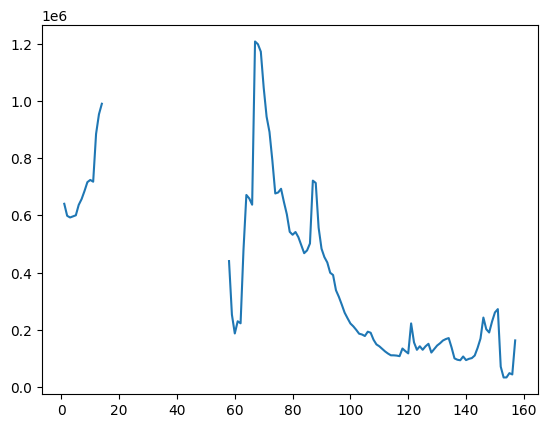

In [147]:
mask = (ds_ec_orc.tinc_10km > 0.) & (ds_ec_orc.tinc_10km != 9.96921e+36)
filt_cinc_1km = xr.where(mask, ds_ec_orc.tinc_10km, np.nan)

plt.plot(filt_cinc_1km.mean(dim=('time')))

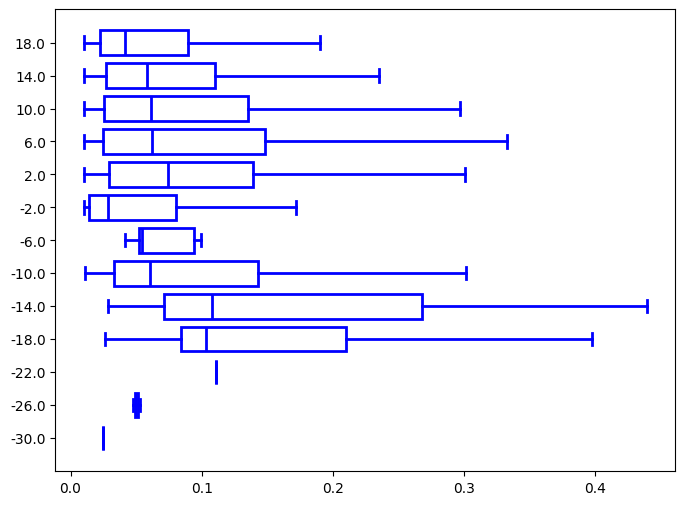

In [68]:

fnt=16;
ln=2;
ln1=2;
al1=1.#0.4;
al2=1.#0.6;
al3=0.3
alpha=al2;
wd=3
fig, ax = plt.subplots(figsize=(8,6))
ax.boxplot(lwc_ec_by_bin, positions=tempc_bin, vert=False, patch_artist=True, widths=wd,
           boxprops=dict(facecolor='none', edgecolor='blue', linewidth=ln, alpha=al2),
           medianprops=dict(color='blue', linewidth=ln),
           whiskerprops=dict(linewidth=ln, color='blue', alpha=al2),
           capprops=dict(linewidth=ln, color='blue', alpha=al2), showfliers=False)

plt.show()

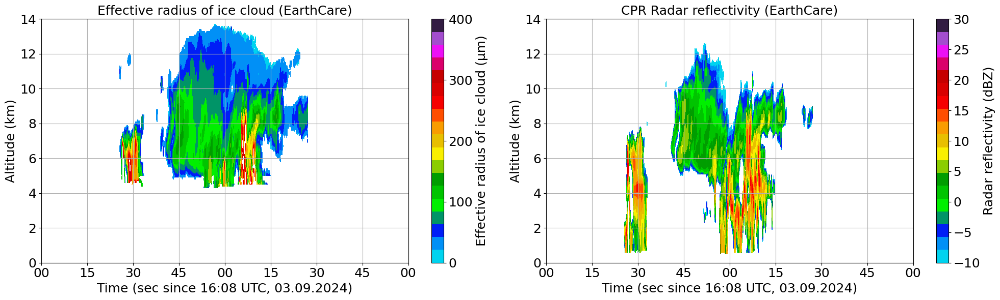

In [21]:


ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)


#ds_ec_orc = ds_ec.sel(lon=slice(-32, -28), lat=slice(7, 11))

ds_ec_orc.lwc1_1km

mask_clwer = (ds_ec_orc.clwer_1km > 0.) & (ds_ec_orc.clwer_1km != 9.96921e+36)
mask_cier = (ds_ec_orc.cier_1km > 0.) & (ds_ec_orc.cier_1km <= 300.) #!= 9.96921e+36)

mask_vertvel = (ds_ec_orc.cld_air_vel_1km > -10.) & (ds_ec_orc.cld_air_vel_1km != 9.96921e+36)
mask_refl = (ds_ec_orc.refl_cpr_1km > -10.) & (ds_ec_orc.refl_cpr_1km != 9.96921e+36)
#mask_tcwnc = (ds_ec_orc.tcwnc_1km > 0.) & (ds_ec_orc.tcwnc_1km != 9.96921e+36)

filt_clwer_1km = xr.where(mask_clwer, ds_ec_orc.clwer_1km, np.nan)
filt_cier_1km = xr.where(mask_cier, ds_ec_orc.cier_1km, np.nan)
filt_vertvel_1km = xr.where(mask_vertvel, ds_ec_orc.cld_air_vel_1km, np.nan)
filt_refl_1km = xr.where(mask_refl, ds_ec_orc.refl_cpr_1km, np.nan)
#filt_tcwnc_1km = xr.where(mask_tcwnc, ds_ec_orc.tcwnc_1km, np.nan)

fnt=18
lev_clwer = np.linspace(0, 800, 20)
lev_cier = np.linspace(0, 400, 20)
lev_vertvel = np.linspace(-1, 4, 20)
lev_refl = np.linspace(-10, 30, 20)

plt.figure(figsize=(20,6))
plt.style.use('default')


plt.subplot(1,2,1)
cnt=plt.contourf(ds_ec_orc.time, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')#'HomeyerRainbow')
colorbar = plt.colorbar(cnt, ticks=[0, 100, 200, 300, 400], label='Cloud ice effective radius (µm)')
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Effective radius of ice cloud (µm)', size=fnt)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%S'))
start_date = datetime(2024, 9, 3, 16, 8) 
end_date = datetime(2024, 9, 3, 16, 10)
plt.ylim(0, 14.)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Time (sec since 16:08 UTC, 03.09.2024)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Effective radius of ice cloud (EarthCare)', fontsize=fnt)
plt.grid()


plt.subplot(1,2,2)
cnt=plt.contourf(ds_ec_orc.time, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_refl_1km.T, levels=lev_refl, cmap='pyart_NWSRef')#'HomeyerRainbow')
colorbar = plt.colorbar(cnt, ticks=[-10, -5, 0, 5, 10, 15, 20, 25, 30])#, label='Total ice number concentration (L$^{-1}$)')
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Radar reflectivity (dBZ)', size=fnt)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%S'))
start_date = datetime(2024, 9, 3, 16, 8) 
end_date = datetime(2024, 9, 3, 16, 10)
plt.ylim(0, 14.)

plt.xlim(start_date, end_date)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Time (sec since 16:08 UTC, 03.09.2024)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('CPR Radar reflectivity (EarthCare)', fontsize=fnt)
plt.grid()

plt.tight_layout()
plt.show()

In [44]:

mean_cier_4sip

<xarray.DataArray 'reff_qi' (height: 65, ncells: 13603)> Size: 4MB
dask.array<mean_agg-aggregate, shape=(65, 13603), dtype=float32, chunksize=(65, 13603), chunktype=numpy.ndarray>
Coordinates:
  * height   (height) float64 520B 1.0 2.0 3.0 4.0 5.0 ... 62.0 63.0 64.0 65.0
    clon     (ncells) float64 109kB dask.array<chunksize=(13603,), meta=np.ndarray>
    clat     (ncells) float64 109kB dask.array<chunksize=(13603,), meta=np.ndarray>
Dimensions without coordinates: ncells

In [17]:
#####################################################
### Select CURTAIN corresponding to the EarthCare ###
#####################################################

# ICON cell centers in degrees
clon_deg = np.degrees(ds_4sip_hfreq['clon'].values)
clat_deg = np.degrees(ds_4sip_hfreq['clat'].values)

# EarthCARE track points
ec_lons = ds_ec.lon.values
ec_lats = ds_ec.lat.values

# Define a narrow radius (e.g., 0.05 degrees)
radius = 0.005#0.001

# For each ICON cell, check if it's within 'radius' of any track point
mask = np.zeros(clon_deg.shape, dtype=bool)
for lon, lat in zip(ec_lons, ec_lats):
    mask |= (np.abs(clon_deg - lon) < radius) & (np.abs(clat_deg - lat) < radius)

# Select these cells
ds_dum = ds_4sip_hfreq.sel(time=slice('2024-09-03T15:45:00.000000000','2024-09-03T16:15:00.000000000'))#,ncells=mask_ncells_orc)
#ds_dum = ds_4sip.sel(time=slice('2024-09-03T15:45:00.000000000','2024-09-03T16:15:00.000000000'))#,ncells=mask_ncells_orc)
ds_curtain = ds_dum.isel(ncells=np.where(mask)[0])

#fnt=12;
#ln1=8; ln2=2;
#plt.figure(figsize=(8,5))
#plt.plot(-1*ds_ec.lon, ds_ec.lat, 'k-', linewidth=ln1, label='EarthCare track')
#plt.plot(-1*np.degrees(ds_curtain.clon), np.degrees(ds_curtain.clat), 'r-', linewidth=ln2, label='ICON Curtain')
#plt.xlim(30, 32)
#plt.ylim(7, 11)
#plt.xticks(fontsize=fnt)
#plt.yticks(fontsize=fnt)
#plt.xlabel('Longitude (°W)', fontsize=fnt)
#plt.xlabel('Latitude (°N)', fontsize=fnt)
#plt.legend()
#plt.title('EarthCare track over ORCETRA domain', fontsize=fnt)
#plt.show()

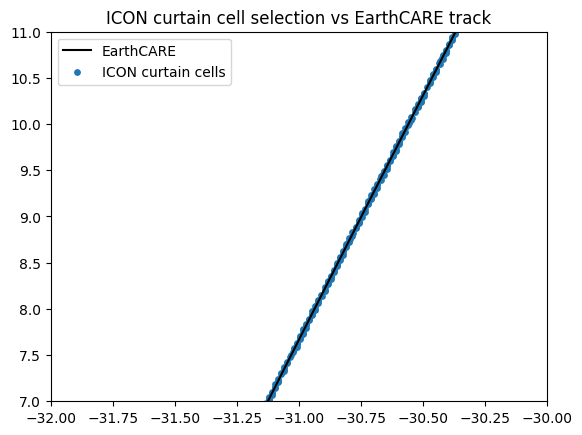

In [18]:
plt.plot(ec_lons, ec_lats, 'k-', label='EarthCARE')
plt.scatter(clon_deg[mask], clat_deg[mask], s=15, label='ICON curtain cells')
plt.legend()
plt.xlim(-32, -30)
plt.ylim(7, 11)
plt.title("ICON curtain cell selection vs EarthCARE track");


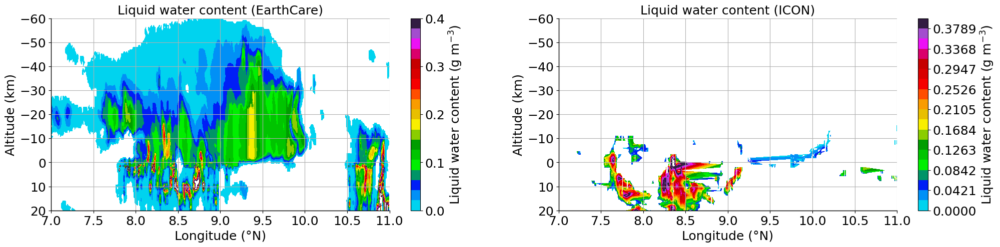

In [72]:

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16
mean_ht_ec = 1.e-3*ds_ec_orc.altitude.mean('time')

mask_lwc = (ds_ec_orc.lwc1_1km > 0.) & (ds_ec_orc.lwc1_1km < 12.) & (ds_ec_orc.lwc_1km != 9.96921e+36)

filt_lwc1_1km = xr.where(mask_lwc, ds_ec_orc.lwc1_1km, np.nan)


filt_lwc_4sip = xr.where(ds_curtain.lwc_gperm3 > 0., ds_curtain.lwc_gperm3, np.nan)
mean_temp_4sip = ds_curtain.tempc.mean(dim=('time','ncells'))
mean_ht_4sip = 1.e-3*ds_curtain.z_mc.mean(dim=('time','ncells'))
mean_lwc_4sip = filt_lwc_4sip.mean('time')
clon_4sip = np.degrees(ds_curtain.clon)
clat_4sip = np.degrees(ds_curtain.clat)

fnt=18
lev_lwc = np.linspace(0, 0.4, 20)

plt.figure(figsize=(24,5))
plt.style.use('default')

plt.subplot(1,2,1)
#cnt=plt.contourf(ds_ec_orc.lon, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')
cnt=plt.contourf(ds_ec_orc.lat, mean_ht_ec, filt_lwc1_1km.T, levels=lev_lwc, cmap='pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[0, 0.1, 0.2, 0.3, 0.4])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Liquid water content (g m$^{-3}$)', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Longitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Liquid water content (EarthCare)', fontsize=fnt)
plt.grid()

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')


plt.subplot(1,2,2)
#cnt=plt.contourf(ds_ec_orc.lat, mean_temp_ec, filt_lwc1_1km.T, levels=lev_lwc, cmap='pyart_NWSRef')
#cnt=plt.contourf(ds_ec_orc.lat, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')#'HomeyerRainbow')
cnt=plt.contourf(clat_4sip, mean_ht_4sip, mean_lwc_4sip, levels=lev_lwc, cmap='pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[0, 0.1, 0.2, 0.3, 0.4])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Liquid water content (g m$^{-3}$)', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Longitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Liquid water content (ICON)', fontsize=fnt)
plt.grid()

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')
plt.show()

In [111]:
print(filt_tinc_1km.min().values, filt_tinc_1km.max().values)

65.578995 9493851.0


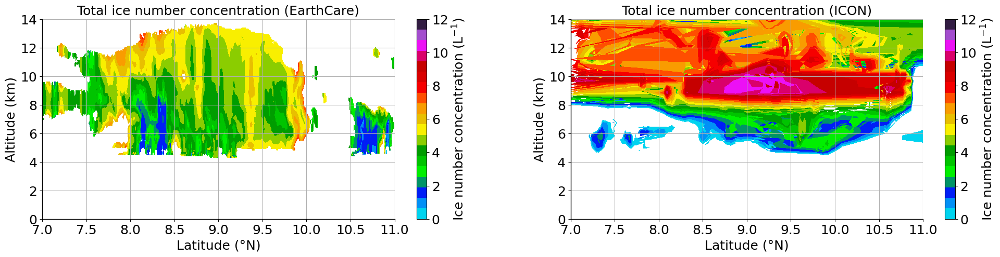

In [133]:

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16
mean_ht_ec = 1.e-3*ds_ec_orc.altitude.mean('time')

mask_tinc = (ds_ec_orc.tinc_1km > 0.) & (ds_ec_orc.tinc_1km != 9.96921e+36)
filt_tinc_1km = xr.where(mask_tinc, ds_ec_orc.tinc_1km, np.nan)

ds = ds_curtain.sel(time=slice('2024-09-03T15:50:00.000000000','2024-09-03T16:10:00.000000000'))
filt_tinc_4sip = xr.where(ds.inc_perl > 0., ds.inc_perl, np.nan)
mean_temp_4sip = ds.tempc.mean(dim=('time','ncells'))
mean_ht_4sip = 1.e-3*ds.z_mc.mean(dim=('time','ncells'))
mean_tinc_4sip = filt_tinc_4sip.mean('time')
clon_4sip = np.degrees(ds.clon)
clat_4sip = np.degrees(ds.clat)

fnt=18
lev_tinc = np.linspace(0, 12, 20)

plt.figure(figsize=(24,5))
plt.style.use('default')

plt.subplot(1,2,1)
#cnt=plt.contourf(ds_ec_orc.lon, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')
cnt=plt.contourf(ds_ec_orc.lat, mean_ht_ec, np.log(1.e-3*filt_tinc_1km.T), levels=lev_tinc, cmap='pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[0, 2, 4, 6, 8, 10, 12])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Ice number concentration (L$^{-1}$)', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)
#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Total ice number concentration (EarthCare)', fontsize=fnt)
plt.grid()

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')


plt.subplot(1,2,2)
#cnt=plt.contourf(ds_ec_orc.lat, mean_ht_ec, np.log(filt_tinc_1km.T), levels=lev_tinc, cmap='pyart_NWSRef')
#cnt=plt.contourf(ds_ec_orc.lat, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')#'HomeyerRainbow')
cnt=plt.contourf(clat_4sip, mean_ht_4sip, np.log(mean_tinc_4sip), levels=lev_tinc, cmap='pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[0, 2, 4, 6, 8, 10, 12])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Ice number concentration (L$^{-1}$)', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)
#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Total ice number concentration (ICON)', fontsize=fnt)
plt.grid()

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')
plt.show()

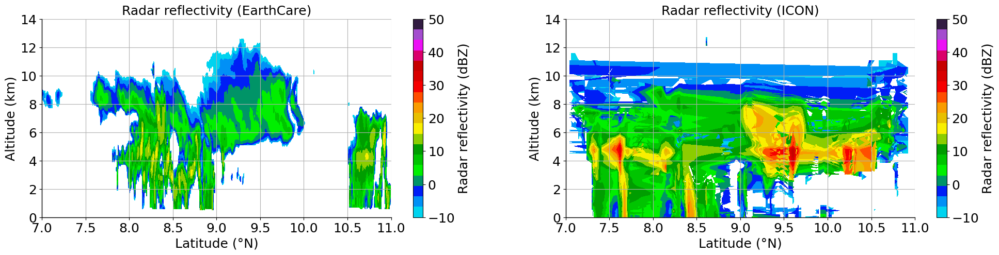

In [134]:

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16
mean_ht_ec = 1.e-3*ds_ec_orc.altitude.mean('time')

mask_refl = (ds_ec_orc.refl_cpr_1km > -10.) & (ds_ec_orc.refl_cpr_1km != 9.96921e+36)
filt_refl_1km = xr.where(mask_refl, ds_ec_orc.refl_cpr_1km, np.nan)

ds = ds_curtain.sel(time=slice('2024-09-03T15:45:00.000000000','2024-09-03T16:15:00.000000000'))
filt_refl_4sip = xr.where(ds.dbz > -10., ds.dbz, np.nan)
mean_temp_4sip = ds.tempc.mean(dim=('time','ncells'))
mean_ht_4sip = 1.e-3*ds.z_mc.mean(dim=('time','ncells'))
mean_refl_4sip = filt_refl_4sip.mean('time')
clon_4sip = np.degrees(ds.clon)
clat_4sip = np.degrees(ds.clat)

fnt=18
lev_refl = np.linspace(-10, 50, 20)

plt.figure(figsize=(24,5))
plt.style.use('default')

plt.subplot(1,2,1)
#cnt=plt.contourf(ds_ec_orc.lon, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')
cnt=plt.contourf(ds_ec_orc.lat, mean_ht_ec, filt_refl_1km.T, levels=lev_refl, cmap='pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[-10, 0, 10, 20, 30, 40, 50])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Radar reflectivity (dBZ)', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Radar reflectivity (EarthCare)', fontsize=fnt)
plt.grid()

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')


plt.subplot(1,2,2)
#cnt=plt.contourf(ds_ec_orc.lat, mean_temp_ec, filt_lwc1_1km.T, levels=lev_lwc, cmap='pyart_NWSRef')
#cnt=plt.contourf(ds_ec_orc.lat, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')#'HomeyerRainbow')
cnt=plt.contourf(clat_4sip, mean_ht_4sip, mean_refl_4sip, levels=lev_refl, cmap='pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[-10, 0, 10, 20, 30, 40, 50])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Radar reflectivity (dBZ)', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Radar reflectivity (ICON)', fontsize=fnt)
plt.grid()

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')
plt.show()

In [125]:
#refl_smoothed_2d.shape
mean_refl_4sip.shape

(65, 175)


### Regular coordinate

In [15]:
ds_ec_orc

<xarray.Dataset> Size: 17MB
Dimensions:                 (time: 431, height: 206)
Coordinates:
  * time                    (time) object 3kB 2024-09-03T16:08:25.639902+00:0...
    height                  (time, height) float32 355kB 2e+04 ... -500.0
    lon                     (time) float64 3kB -30.37 -30.37 ... -31.12 -31.12
    lat                     (time) float64 3kB 10.99 10.98 10.97 ... 7.019 7.007
Data variables: (12/52)
    longitude               (time) float64 3kB -30.37 -30.37 ... -31.12 -31.12
    latitude                (time) float64 3kB 10.99 10.98 10.97 ... 7.019 7.007
    altitude                (time, height) float32 355kB 2e+04 ... -500.0
    pressure                (time, height) float32 355kB -9.999e+03 ... -9.99...
    temperature             (time, height) float32 355kB -9.999e+03 ... -9.99...
    relhum_1km              (time, height) float32 355kB -9.999e+03 ... -9.99...
    ...                      ...
    tinc_10km               (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tinc_1km                (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tcwnc_10km              (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tcwnc_1km               (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    refl_cpr_10km           (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    refl_cpr_1km            (time, height) float32 355kB 9.969e+36 ... 9.969e+36

In [155]:

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

lon_ec = ds_ec_orc.lon.values
lat_ec = ds_ec_orc.lat.values

ds_4sip_regcord_curtain = ds_4sip_regcord.sel(lon=lon_ec, lat=lat_ec, method='nearest')

#plt.plot(ds_4sip_regcord_curtain.lon, ds_4sip_regcord_curtain.lat, 'k-', label='ICON')
#plt.plot(ds_ec_orc.lon, ds_ec_orc.lat, 'r-', label='EarthCare')
#plt.legend()
#plt.xlim(-32, -30)
#plt.ylim(7, 11)
#plt.title("ICON curtain cell selection vs EarthCARE track");

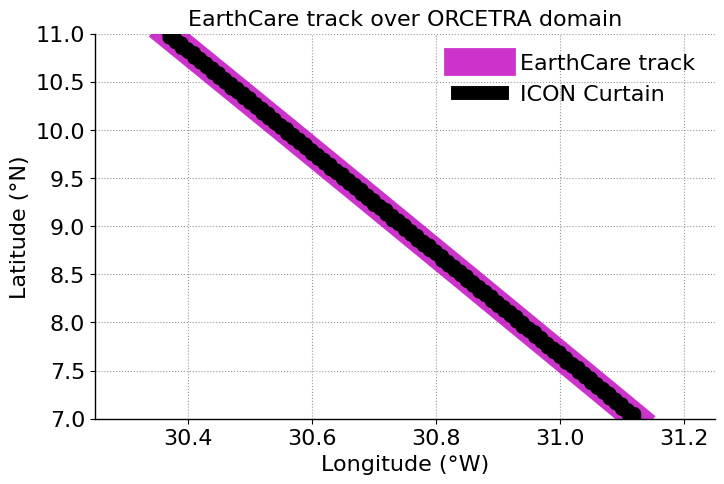

In [156]:

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)


fnt=16;
ln1=20; ln2=10;
plt.figure(figsize=(8,5))
plt.plot(-1*ds_ec_orc.lon, ds_ec_orc.lat, 'm-', linewidth=ln1, label='EarthCare track', alpha=0.8)
plt.plot(-1*ds_4sip_regcord_curtain.lon, ds_4sip_regcord_curtain.lat, 'k-', linewidth=ln2, label='ICON Curtain', alpha=1.0)
plt.xlim(30.25, 31.25)
plt.ylim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Longitude (°W)', fontsize=fnt)
plt.ylabel('Latitude (°N)', fontsize=fnt)
plt.legend(frameon=False, handlelength=2, labelspacing=0.5, fontsize=fnt, loc='best')
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)
plt.title('EarthCare track over ORCETRA domain', fontsize=fnt)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')
plt.show()

-4.9999795 57.418633
0.010000001 20.717802


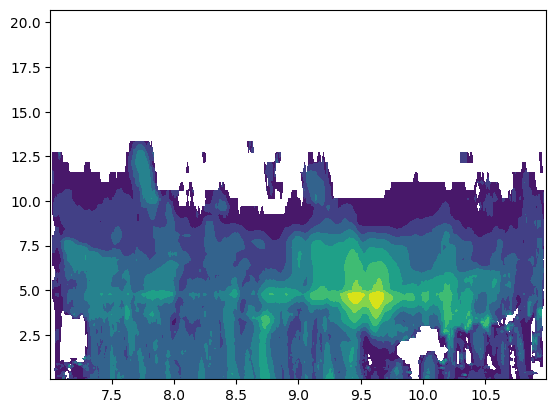

In [19]:
print(mean_refl_4sip.min().values, mean_refl_4sip.max().values)
print(mean_ht_4sip.min().values, mean_ht_4sip.max().values)
plt.contourf(mean_refl_4sip.lat, mean_ht_4sip, mean_refl_4sip.mean('lon'))

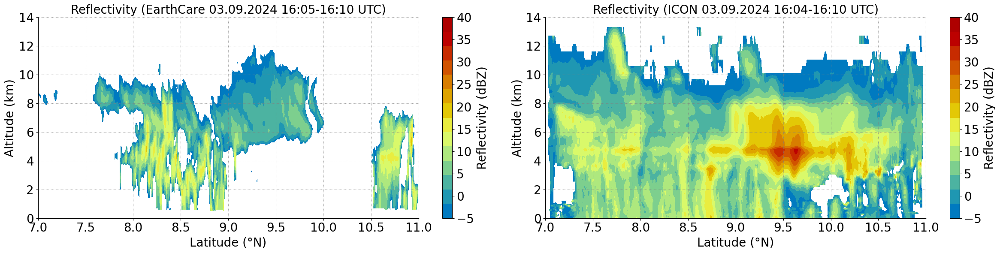

In [157]:

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16
mean_ht_ec = 1.e-3*ds_ec_orc.altitude.mean('time')

mask_refl = (ds_ec_orc.refl_cpr_1km > -5.) & (ds_ec_orc.refl_cpr_1km != 9.96921e+36)
filt_refl_1km = xr.where(mask_refl, ds_ec_orc.refl_cpr_1km, np.nan)

ds = ds_4sip_regcord_curtain.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:10:00.000000000'))
filt_refl_4sip = xr.where(ds.dbz > -5., ds.dbz, np.nan)
mean_temp_4sip = ds.tempc.mean(dim=('time','lon', 'lat'))
mean_ht_4sip = 1.e-3*ds.z_mc.mean(dim=('time','lon', 'lat'))
mean_refl_4sip = filt_refl_4sip.Freezing level altitude, defined as the mean height where temperature is close to 0 °C (−0.2 to 0 °C) and ice water content exceeds 10⁻⁶ kg kg⁻¹.mean('time')
clon_4sip = ds.lon
clat_4sip = ds.lat

fnt=20
lev_refl = np.linspace(-5, 40, 15)

plt.figure(figsize=(24,6))
plt.style.use('default')

plt.subplot(1,2,1)
#cnt=plt.contourf(ds_ec_orc.lon, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')
cnt=plt.contourf(ds_ec_orc.lat, mean_ht_ec, filt_refl_1km.T, levels=lev_refl, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[-5, 0, 5, 10, 15, 20, 25, 30, 35, 40])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Reflectivity (dBZ)', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Reflectivity (EarthCare 03.09.2024 16:05-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')


plt.subplot(1,2,2)
#cnt=plt.contourf(ds_ec_orc.lat, mean_temp_ec, filt_lwc1_1km.T, levels=lev_lwc, cmap='pyart_NWSRef')
#cnt=plt.contourf(ds_ec_orc.lat, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')#'HomeyerRainbow')
cnt=plt.contourf(clat_4sip, mean_ht_4sip, mean_refl_4sip.mean('lon'), levels=lev_refl, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[-5, 0, 5, 10, 15, 20, 25, 30, 35, 40])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Reflectivity (dBZ)', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Reflectivity (ICON 03.09.2024 16:04-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.tight_layout()
plt.show()

In [158]:
ds_ec_orc

<xarray.Dataset> Size: 17MB
Dimensions:                 (time: 431, height: 206)
Coordinates:
  * time                    (time) object 3kB 2024-09-03T16:08:25.639902+00:0...
    height                  (time, height) float32 355kB 2e+04 ... -500.0
    lon                     (time) float64 3kB -30.37 -30.37 ... -31.12 -31.12
    lat                     (time) float64 3kB 10.99 10.98 10.97 ... 7.019 7.007
Data variables: (12/52)
    longitude               (time) float64 3kB -30.37 -30.37 ... -31.12 -31.12
    latitude                (time) float64 3kB 10.99 10.98 10.97 ... 7.019 7.007
    altitude                (time, height) float32 355kB 2e+04 ... -500.0
    pressure                (time, height) float32 355kB -9.999e+03 ... -9.99...
    temperature             (time, height) float32 355kB -9.999e+03 ... -9.99...
    relhum_1km              (time, height) float32 355kB -9.999e+03 ... -9.99...
    ...                      ...
    tinc_10km               (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tinc_1km                (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tcwnc_10km              (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tcwnc_1km               (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    refl_cpr_10km           (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    refl_cpr_1km            (time, height) float32 355kB 9.969e+36 ... 9.969e+36

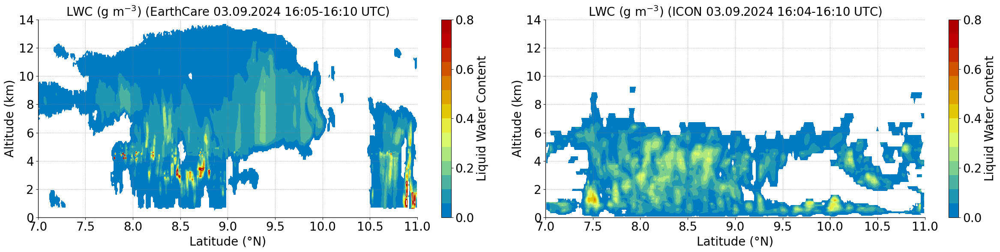

In [159]:

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16
mean_ht_ec = 1.e-3*ds_ec_orc.altitude.mean('time')

mask = (ds_ec_orc.lwc1_1km > 0.) & (ds_ec_orc.lwc1_1km != 9.96921e+36)
filt_lwc_1km = xr.where(mask, ds_ec_orc.lwc1_1km, np.nan)

ds = ds_4sip_regcord_curtain.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:10:00.000000000'))
filt_lwc_4sip = xr.where(ds.lwc_gperm3 > 0., ds.lwc_gperm3, np.nan)
mean_temp_4sip = ds.tempc.mean(dim=('time','lon', 'lat'))
mean_ht_4sip = 1.e-3*ds.z_mc.mean(dim=('time','lon', 'lat'))
mean_lwc_4sip = filt_lwc_4sip.mean('time')
clon_4sip = ds.lon
clat_4sip = ds.lat

fnt=20
lev = np.linspace(0, 0.8, 15)

plt.figure(figsize=(24,6))
plt.style.use('default')

plt.subplot(1,2,1)
#cnt=plt.contourf(ds_ec_orc.lon, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')
cnt=plt.contourf(ds_ec_orc.lat, mean_ht_ec, (filt_lwc_1km.T), levels=lev, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[0, 0.2, 0.4, 0.6, 0.8])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Liquid Water Content', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('LWC (g m$^{-3}$) (EarthCare 03.09.2024 16:05-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')


plt.subplot(1,2,2)
cnt=plt.contourf(clat_4sip, mean_ht_4sip, mean_lwc_4sip.mean('lon'), levels=lev, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[0, 0.2, 0.4, 0.6, 0.8])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Liquid Water Content', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('LWC (g m$^{-3}$) (ICON 03.09.2024 16:04-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.tight_layout()
plt.show()

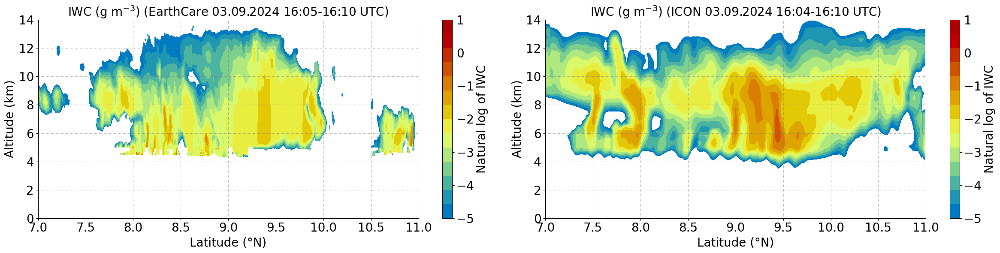

In [160]:

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16
mean_ht_ec = 1.e-3*ds_ec_orc.altitude.mean('time')

mask = (ds_ec_orc.iwc_1km > 0.) & (ds_ec_orc.iwc_1km != 9.96921e+36)
filt_tiwc_1km = xr.where(mask, ds_ec_orc.iwc_1km, np.nan)

ds = ds_4sip_regcord_curtain.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:10:00.000000000'))
filt_tiwc_4sip = xr.where(ds.tiwc_gperm3 > 0., ds.tiwc_gperm3, np.nan)
mean_temp_4sip = ds.tempc.mean(dim=('time','lon', 'lat'))
mean_ht_4sip = 1.e-3*ds.z_mc.mean(dim=('time','lon', 'lat'))
mean_tiwc_4sip = filt_tiwc_4sip.mean('time')
clon_4sip = ds.lon
clat_4sip = ds.lat

fnt=20
lev = np.linspace(-5, 1, 15)

plt.figure(figsize=(24,6))
plt.style.use('default')

plt.subplot(1,2,1)
#cnt=plt.contourf(ds_ec_orc.lon, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')
cnt=plt.contourf(ds_ec_orc.lat, mean_ht_ec, np.log(filt_tiwc_1km.T), levels=lev, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[-5, -4, -3, -2, -1, 0, 1])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Natural log of IWC', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('IWC (g m$^{-3}$) (EarthCare 03.09.2024 16:05-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')


plt.subplot(1,2,2)
#cnt=plt.contourf(ds_ec_orc.lat, mean_temp_ec, filt_lwc1_1km.T, levels=lev_lwc, cmap='pyart_NWSRef')
#cnt=plt.contourf(ds_ec_orc.lat, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')#'HomeyerRainbow')
cnt=plt.contourf(clat_4sip, mean_ht_4sip, np.log(mean_tiwc_4sip.mean('lon')), levels=lev, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[-5, -4, -3, -2, -1, 0, 1])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Natural log of IWC', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('IWC (g m$^{-3}$) (ICON 03.09.2024 16:04-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.tight_layout()
plt.show()

In [100]:
ds_ec_orc

<xarray.Dataset> Size: 17MB
Dimensions:                 (time: 431, height: 206)
Coordinates:
  * time                    (time) object 3kB 2024-09-03T16:08:25.639902+00:0...
    height                  (time, height) float32 355kB 2e+04 ... -500.0
    lon                     (time) float64 3kB -30.37 -30.37 ... -31.12 -31.12
    lat                     (time) float64 3kB 10.99 10.98 10.97 ... 7.019 7.007
Data variables: (12/52)
    longitude               (time) float64 3kB -30.37 -30.37 ... -31.12 -31.12
    latitude                (time) float64 3kB 10.99 10.98 10.97 ... 7.019 7.007
    altitude                (time, height) float32 355kB 2e+04 ... -500.0
    pressure                (time, height) float32 355kB -9.999e+03 ... -9.99...
    temperature             (time, height) float32 355kB -9.999e+03 ... -9.99...
    relhum_1km              (time, height) float32 355kB -9.999e+03 ... -9.99...
    ...                      ...
    tinc_10km               (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tinc_1km                (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tcwnc_10km              (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tcwnc_1km               (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    refl_cpr_10km           (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    refl_cpr_1km            (time, height) float32 355kB 9.969e+36 ... 9.969e+36

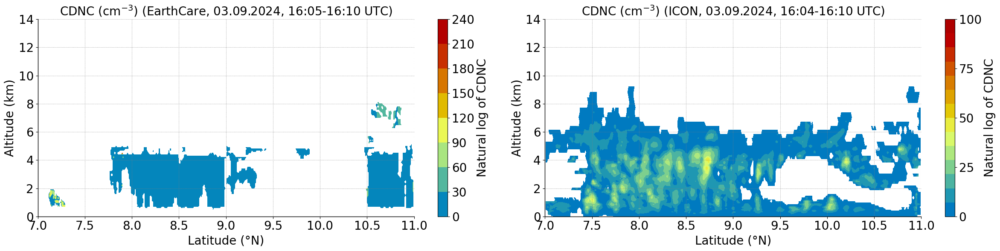

In [161]:

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16
mean_ht_ec = 1.e-3*ds_ec_orc.altitude.mean('time')

mask = (ds_ec_orc.tcwnc_1km > 0.) & (ds_ec_orc.tcwnc_1km != 9.96921e+36)
filt_cdnc_1km = xr.where(mask, ds_ec_orc.tcwnc_1km, np.nan)

ds = ds_4sip_regcord_curtain.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:10:00.000000000'))
filt_cdnc_4sip = xr.where(ds.cdnc_percm3 > 0., ds.cdnc_percm3, np.nan)
mean_temp_4sip = ds.tempc.mean(dim=('time','lon', 'lat'))
mean_ht_4sip = 1.e-3*ds.z_mc.mean(dim=('time','lon', 'lat'))
mean_cdnc_4sip = filt_cdnc_4sip.mean('time')
clon_4sip = ds.lon
clat_4sip = ds.lat

fnt=20
lev = np.linspace(0, 2, 15)

plt.figure(figsize=(24,6))
plt.style.use('default')

plt.subplot(1,2,1)
#cnt=plt.contourf(ds_ec_orc.lon, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')
cnt=plt.contourf(ds_ec_orc.lat, mean_ht_ec, 1.e-6*filt_cdnc_1km.T, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt)#, ticks=[0, 50, 100, 150, 200])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Natural log of CDNC', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('CDNC (cm$^{-3}$) (EarthCare, 03.09.2024, 16:05-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')


plt.subplot(1,2,2)
cnt=plt.contourf(clat_4sip, mean_ht_4sip, mean_cdnc_4sip.mean('lon'), levels=np.linspace(0,100,15), cmap='pyart_HomeyerRainbow')#pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[0, 25, 50, 75, 100])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Natural log of CDNC', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('CDNC (cm$^{-3}$) (ICON, 03.09.2024, 16:04-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.tight_layout()
plt.show()

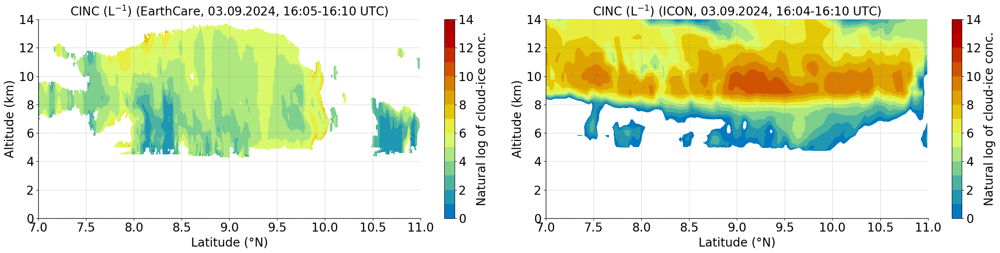

In [162]:

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16
mean_ht_ec = 1.e-3*ds_ec_orc.altitude.mean('time')

mask = (ds_ec_orc.tinc_1km > 0.) & (ds_ec_orc.tinc_1km != 9.96921e+36)
filt_cinc_1km = xr.where(mask, ds_ec_orc.tinc_1km, np.nan)

ds = ds_4sip_regcord_curtain.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:10:00.000000000'))
filt_cinc_4sip = xr.where(ds.cinc_perl > 0., ds.cinc_perl, np.nan)
mean_temp_4sip = ds.tempc.mean(dim=('time','lon', 'lat'))
mean_ht_4sip = 1.e-3*ds.z_mc.mean(dim=('time','lon', 'lat'))
mean_cinc_4sip = filt_cinc_4sip.mean('time')
clon_4sip = ds.lon
clat_4sip = ds.lat

fnt=20
lev = np.linspace(0, 14, 15)

plt.figure(figsize=(24,6))
plt.style.use('default')

plt.subplot(1,2,1)
#cnt=plt.contourf(ds_ec_orc.lon, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')
cnt=plt.contourf(ds_ec_orc.lat, mean_ht_ec, np.log(1.e-3*filt_cinc_1km.T), levels=lev, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[0, 2, 4, 6, 8, 10, 12, 14])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Natural log of cloud-ice conc.', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('CINC (L$^{-1}$) (EarthCare, 03.09.2024, 16:05-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')


plt.subplot(1,2,2)
cnt=plt.contourf(clat_4sip, mean_ht_4sip, np.log(mean_cinc_4sip.mean('lon')), levels=lev, cmap='pyart_HomeyerRainbow')#pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[0, 2, 4, 6, 8, 10, 12, 14])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Natural log of cloud-ice conc.', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('CINC (L$^{-1}$) (ICON, 03.09.2024, 16:04-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.tight_layout()
plt.show()

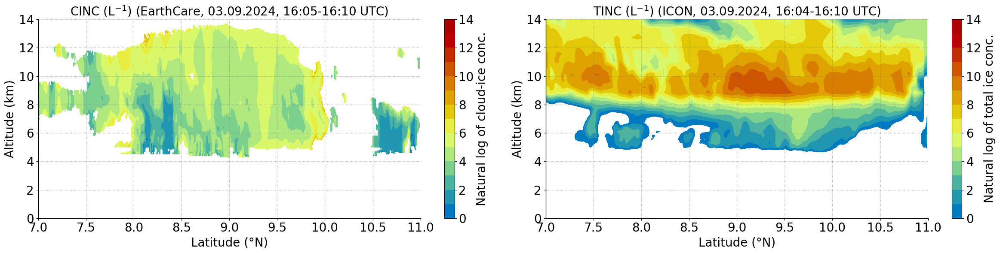

In [26]:

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16
mean_ht_ec = 1.e-3*ds_ec_orc.altitude.mean('time')

mask = (ds_ec_orc.tinc_1km > 0.) & (ds_ec_orc.tinc_1km != 9.96921e+36)
filt_cinc_1km = xr.where(mask, ds_ec_orc.tinc_1km, np.nan)

ds = ds_4sip_regcord_curtain.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:10:00.000000000'))
filt_tinc_4sip = xr.where(ds.tinc_perl > 0., ds.tinc_perl, np.nan)
mean_temp_4sip = ds.tempc.mean(dim=('time','lon', 'lat'))
mean_ht_4sip = 1.e-3*ds.z_mc.mean(dim=('time','lon', 'lat'))
mean_tinc_4sip = filt_tinc_4sip.mean('time')
clon_4sip = ds.lon
clat_4sip = ds.lat

fnt=20
lev = np.linspace(0, 14, 15)

plt.figure(figsize=(24,6))
plt.style.use('default')

plt.subplot(1,2,1)
#cnt=plt.contourf(ds_ec_orc.lon, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')
cnt=plt.contourf(ds_ec_orc.lat, mean_ht_ec, np.log(1.e-3*filt_cinc_1km.T), levels=lev, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[0, 2, 4, 6, 8, 10, 12, 14])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Natural log of cloud-ice conc.', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('CINC (L$^{-1}$) (EarthCare, 03.09.2024, 16:05-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')


plt.subplot(1,2,2)
cnt=plt.contourf(clat_4sip, mean_ht_4sip, np.log(mean_tinc_4sip.mean('lon')), levels=lev, cmap='pyart_HomeyerRainbow')#pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[0, 2, 4, 6, 8, 10, 12, 14])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Natural log of total ice conc.', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('TINC (L$^{-1}$) (ICON, 03.09.2024, 16:04-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.tight_layout()
plt.show()

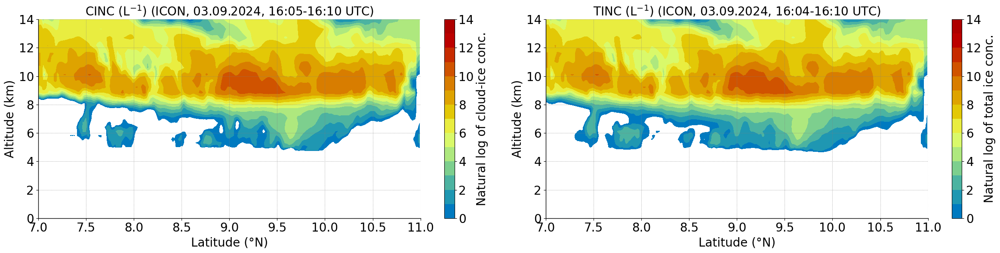

In [28]:

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16
mean_ht_ec = 1.e-3*ds_ec_orc.altitude.mean('time')

mask = (ds_ec_orc.tinc_1km > 0.) & (ds_ec_orc.tinc_1km != 9.96921e+36)
filt_cinc_1km = xr.where(mask, ds_ec_orc.tinc_1km, np.nan)

ds = ds_4sip_regcord_curtain.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:10:00.000000000'))
filt_tinc_4sip = xr.where(ds.tinc_perl > 0., ds.tinc_perl, np.nan)
mean_temp_4sip = ds.tempc.mean(dim=('time','lon', 'lat'))
mean_ht_4sip = 1.e-3*ds.z_mc.mean(dim=('time','lon', 'lat'))
mean_tinc_4sip = filt_tinc_4sip.mean('time')
clon_4sip = ds.lon
clat_4sip = ds.lat

fnt=20
lev = np.linspace(0, 14, 15)

plt.figure(figsize=(24,6))
plt.style.use('default')

plt.subplot(1,2,1)
#cnt=plt.contourf(ds_ec_orc.lon, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')
cnt=plt.contourf(clat_4sip, mean_ht_4sip, np.log(mean_cinc_4sip.mean('lon')), levels=lev, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[0, 2, 4, 6, 8, 10, 12, 14])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Natural log of cloud-ice conc.', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('CINC (L$^{-1}$) (ICON, 03.09.2024, 16:05-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')


plt.subplot(1,2,2)
cnt=plt.contourf(clat_4sip, mean_ht_4sip, np.log(mean_tinc_4sip.mean('lon')), levels=lev, cmap='pyart_HomeyerRainbow')#pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[0, 2, 4, 6, 8, 10, 12, 14])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Natural log of total ice conc.', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('TINC (L$^{-1}$) (ICON, 03.09.2024, 16:04-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.tight_layout()
plt.show()

In [40]:
ds_ec_orc

<xarray.Dataset> Size: 17MB
Dimensions:                 (time: 431, height: 206)
Coordinates:
  * time                    (time) object 3kB 2024-09-03T16:08:25.639902+00:0...
    height                  (time, height) float32 355kB 2e+04 ... -500.0
    lon                     (time) float64 3kB -30.37 -30.37 ... -31.12 -31.12
    lat                     (time) float64 3kB 10.99 10.98 10.97 ... 7.019 7.007
Data variables: (12/52)
    longitude               (time) float64 3kB -30.37 -30.37 ... -31.12 -31.12
    latitude                (time) float64 3kB 10.99 10.98 10.97 ... 7.019 7.007
    altitude                (time, height) float32 355kB 2e+04 ... -500.0
    pressure                (time, height) float32 355kB -9.999e+03 ... -9.99...
    temperature             (time, height) float32 355kB -9.999e+03 ... -9.99...
    relhum_1km              (time, height) float32 355kB -9.999e+03 ... -9.99...
    ...                      ...
    tinc_10km               (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tinc_1km                (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tcwnc_10km              (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tcwnc_1km               (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    refl_cpr_10km           (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    refl_cpr_1km            (time, height) float32 355kB 9.969e+36 ... 9.969e+36

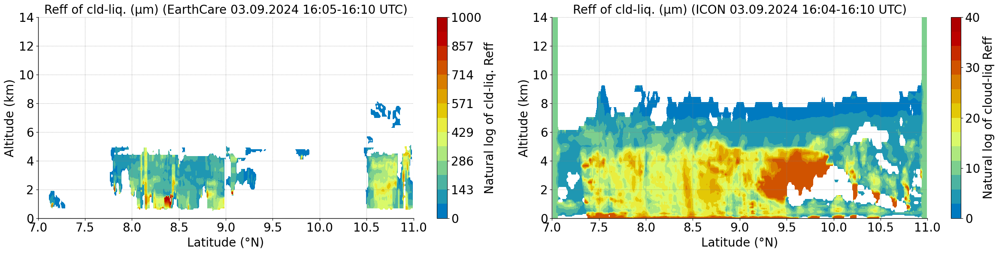

In [55]:

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16
mean_ht_ec = 1.e-3*ds_ec_orc.altitude.mean('time')

mask = (ds_ec_orc.clwer_1km > 0.) & (ds_ec_orc.clwer_1km != 9.96921e+36)
filt_clwer_1km = xr.where(mask, ds_ec_orc.clwer_1km, np.nan)

ds = ds_4sip_regcord_curtain.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:10:00.000000000'))
filt_clwer_4sip = xr.where(ds.reff_qc > 0., ds.reff_qc, np.nan)
mean_temp_4sip = ds.tempc.mean(dim=('time','lon', 'lat'))
mean_ht_4sip = 1.e-3*ds.z_mc.mean(dim=('time','lon', 'lat'))
mean_clwer_4sip = filt_clwer_4sip.mean('time')
clon_4sip = ds.lon
clat_4sip = ds.lat

fnt=20
lev = np.linspace(0, 40, 15)

plt.figure(figsize=(24,6))
plt.style.use('default')

plt.subplot(1,2,1)
#cnt=plt.contourf(ds_ec_orc.lon, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')
cnt=plt.contourf(ds_ec_orc.lat, mean_ht_ec, filt_clwer_1km.T, levels=np.linspace(0,1000,15), cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt)#, ticks=[0, 10, 20, 30, 40])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Natural log of cld-liq. Reff', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Reff of cld-liq. (µm) (EarthCare 03.09.2024 16:05-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')


plt.subplot(1,2,2)
#cnt=plt.contourf(ds_ec_orc.lat, mean_temp_ec, filt_lwc1_1km.T, levels=lev_lwc, cmap='pyart_NWSRef')
#cnt=plt.contourf(ds_ec_orc.lat, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')#'HomeyerRainbow')
cnt=plt.contourf(clat_4sip, mean_ht_4sip, 1.e6*mean_clwer_4sip.mean('lon'), levels=lev, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Natural log of cloud-liq Reff', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Reff of cld-liq. (µm) (ICON 03.09.2024 16:04-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.tight_layout()
plt.show()

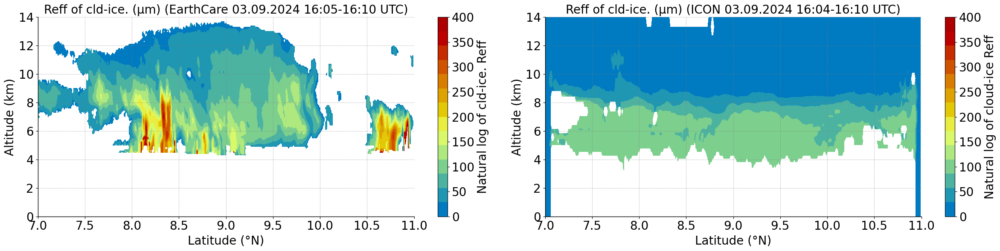

In [70]:

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16
mean_ht_ec = 1.e-3*ds_ec_orc.altitude.mean('time')

mask = (ds_ec_orc.cier_1km > 0.) & (ds_ec_orc.cier_1km != 9.96921e+36)
filt_cier_1km = xr.where(mask, ds_ec_orc.cier_1km, np.nan)

ds = ds_4sip_regcord_curtain.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:10:00.000000000'))
filt_cier_4sip = xr.where(ds.reff_qi > 0., ds.reff_qi, np.nan)
mean_temp_4sip = ds.tempc.mean(dim=('time','lon', 'lat'))
mean_ht_4sip = 1.e-3*ds.z_mc.mean(dim=('time','lon', 'lat'))
mean_cier_4sip = filt_cier_4sip.mean('time')
clon_4sip = ds.lon
clat_4sip = ds.lat

fnt=20
lev = np.linspace(0, 400, 15)

plt.figure(figsize=(24,6))
plt.style.use('default')

plt.subplot(1,2,1)
#cnt=plt.contourf(ds_ec_orc.lon, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')
cnt=plt.contourf(ds_ec_orc.lat, mean_ht_ec, filt_cier_1km.T, levels=lev, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[0, 50, 100, 150, 200, 250, 300, 350, 400])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Natural log of cld-ice. Reff', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Reff of cld-ice. (µm) (EarthCare 03.09.2024 16:05-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')


plt.subplot(1,2,2)
#cnt=plt.contourf(ds_ec_orc.lat, mean_temp_ec, filt_lwc1_1km.T, levels=lev_lwc, cmap='pyart_NWSRef')
#cnt=plt.contourf(ds_ec_orc.lat, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')#'HomeyerRainbow')
cnt=plt.contourf(clat_4sip, mean_ht_4sip, 1.e6*mean_cier_4sip.mean('lon'), levels=lev, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[0, 50, 100, 150, 200, 250, 300, 350, 400])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Natural log of cloud-ice Reff', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Reff of cld-ice. (µm) (ICON 03.09.2024 16:04-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.tight_layout()
plt.show()



In [101]:

# classification of cloud phase in ICON
cld_phase_4sip = np.zeros_like(ds_4sip_regcord_curtain.qc)  # Initialize with liquid phase (0)

# Mixed-phase condition (1)
mixed_mask = (ds_4sip_regcord_curtain.qc > 1e-6) & (ds_4sip_regcord_curtain.qi == 0.)
cld_phase_4sip[mixed_mask] = 0

# Mixed-phase condition (1)
mixed_mask = (ds_4sip_regcord_curtain.qc > 1e-6) & (ds_4sip_regcord_curtain.qi > 1e-6)
cld_phase_4sip[mixed_mask] = 1

# Ice-phase condition (2)
ice_mask = (ds_4sip_regcord_curtain.qc == 0.) & (ds_4sip_regcord_curtain.qi > 1.e-6)
cld_phase_4sip[ice_mask] = 2

#ds_4sip_regcord_curtain['cld_phase'] = cld_phase_4sip 

In [102]:
print(np.min(cld_phase_4sip), np.mean(cld_phase_4sip), np.max(cld_phase_4sip))
print(cld_phase_4sip.shape)

0.0 0.40686736 2.0
(121, 65, 431, 431)


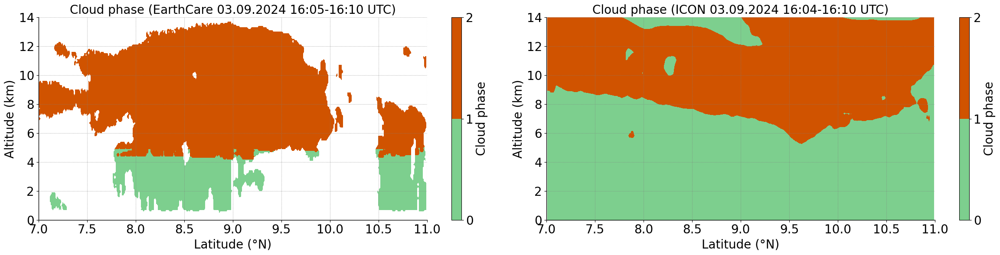

In [105]:

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16
mean_ht_ec = 1.e-3*ds_ec_orc.altitude.mean('time')

mask = (ds_ec_orc.cld_phase1_1km > 0.) & (ds_ec_orc.cld_phase1_1km != 9.96921e+36)
filt_cld_phase_1km = xr.where(mask, ds_ec_orc.cld_phase1_1km, np.nan)

ds = ds_4sip_regcord_curtain.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:10:00.000000000'))
filt_cier_4sip = xr.where(ds.reff_qi > 0., ds.reff_qi, np.nan)
mean_temp_4sip = ds.tempc.mean(dim=('time','lon', 'lat'))
mean_ht_4sip = 1.e-3*ds.z_mc.mean(dim=('time','lon', 'lat'))
mean_cier_4sip = filt_cier_4sip.mean('time')
clon_4sip = ds.lon
clat_4sip = ds.lat

fnt=20
lev = np.linspace(0, 2, 3)

plt.figure(figsize=(24,6))
plt.style.use('default')

plt.subplot(1,2,1)
#cnt=plt.contourf(ds_ec_orc.lon, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')
cnt=plt.contourf(ds_ec_orc.lat, mean_ht_ec, filt_cld_phase_1km.T, levels=lev, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[0, 1, 2])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Cloud phase', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Cloud phase (EarthCare 03.09.2024 16:05-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')


plt.subplot(1,2,2)
#cnt=plt.contourf(ds_ec_orc.lat, mean_temp_ec, filt_lwc1_1km.T, levels=lev_lwc, cmap='pyart_NWSRef')
#cnt=plt.contourf(ds_ec_orc.lat, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')#'HomeyerRainbow')
cnt=plt.contourf(clat_4sip, mean_ht_4sip, np.mean(cld_phase_4sip, axis=(0,3)), levels=lev, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[0, 1, 2])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Cloud phase', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Cloud phase (ICON 03.09.2024 16:04-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.tight_layout()
plt.show()


In [122]:

ds_ec_orc

<xarray.Dataset> Size: 17MB
Dimensions:                 (time: 431, height: 206)
Coordinates:
  * time                    (time) object 3kB 2024-09-03T16:08:25.639902+00:0...
    height                  (time, height) float32 355kB 2e+04 ... -500.0
    lon                     (time) float64 3kB -30.37 -30.37 ... -31.12 -31.12
    lat                     (time) float64 3kB 10.99 10.98 10.97 ... 7.019 7.007
Data variables: (12/52)
    longitude               (time) float64 3kB -30.37 -30.37 ... -31.12 -31.12
    latitude                (time) float64 3kB 10.99 10.98 10.97 ... 7.019 7.007
    altitude                (time, height) float32 355kB 2e+04 ... -500.0
    pressure                (time, height) float32 355kB -9.999e+03 ... -9.99...
    temperature             (time, height) float32 355kB -9.999e+03 ... -9.99...
    relhum_1km              (time, height) float32 355kB -9.999e+03 ... -9.99...
    ...                      ...
    tinc_10km               (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tinc_1km                (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tcwnc_10km              (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    tcwnc_1km               (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    refl_cpr_10km           (time, height) float32 355kB 9.969e+36 ... 9.969e+36
    refl_cpr_1km            (time, height) float32 355kB 9.969e+36 ... 9.969e+36

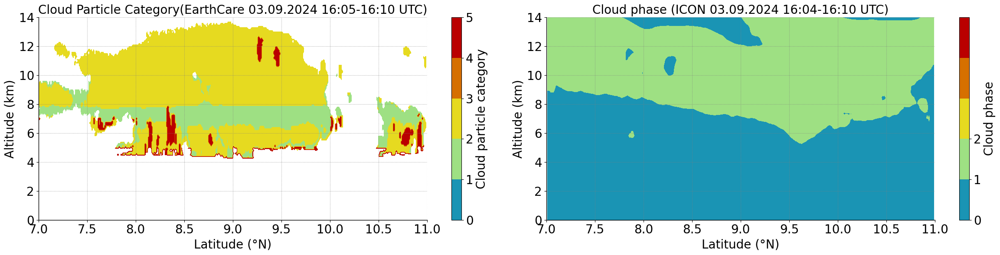

In [121]:

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16
mean_ht_ec = 1.e-3*ds_ec_orc.altitude.mean('time')

mask = (ds_ec_orc.cld_particle_cat_1km > 0.) & (ds_ec_orc.cld_particle_cat_1km != 9.96921e+36)
filt_cld_part_cat_1km = xr.where(mask, ds_ec_orc.cld_particle_cat_1km, np.nan)

ds = ds_4sip_regcord_curtain.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:10:00.000000000'))
filt_cier_4sip = xr.where(ds.reff_qi > 0., ds.reff_qi, np.nan)
mean_temp_4sip = ds.tempc.mean(dim=('time','lon', 'lat'))
mean_ht_4sip = 1.e-3*ds.z_mc.mean(dim=('time','lon', 'lat'))
mean_cier_4sip = filt_cier_4sip.mean('time')
clon_4sip = ds.lon
clat_4sip = ds.lat

fnt=20
lev = np.linspace(0, 5, 6)

plt.figure(figsize=(24,6))
plt.style.use('default')

plt.subplot(1,2,1)
#cnt=plt.contourf(ds_ec_orc.lon, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')
cnt=plt.contourf(ds_ec_orc.lat, mean_ht_ec, filt_cld_part_cat_1km.T, levels=lev, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[0, 1, 2, 3, 4, 5])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Cloud particle category', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Cloud Particle Category(EarthCare 03.09.2024 16:05-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')


plt.subplot(1,2,2)
#cnt=plt.contourf(ds_ec_orc.lat, mean_temp_ec, filt_lwc1_1km.T, levels=lev_lwc, cmap='pyart_NWSRef')
#cnt=plt.contourf(ds_ec_orc.lat, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')#'HomeyerRainbow')
cnt=plt.contourf(clat_4sip, mean_ht_4sip, np.mean(cld_phase_4sip, axis=(0,3)), levels=lev, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[0, 1, 2])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Cloud phase', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Cloud phase (ICON 03.09.2024 16:04-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.tight_layout()
plt.show()


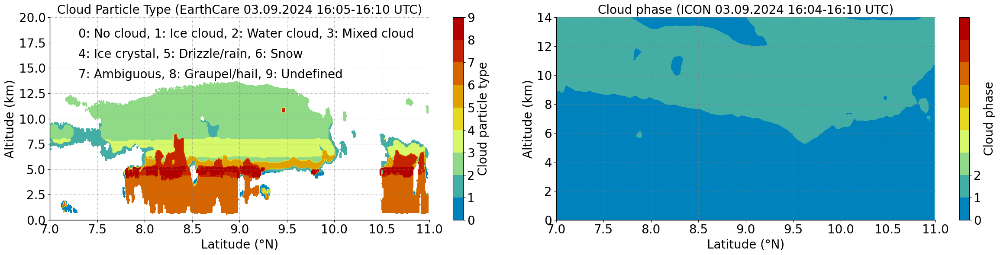

In [132]:

ds_ec_orc = ds_ec.where((ds_ec.lon >= -32) & (ds_ec.lon <= -28) & (ds_ec.lat >= 7) & (ds_ec.lat <= 11), drop=True)

mask = (ds_ec_orc.temperature > 0.) & (ds_ec_orc.temperature != 9.96921e+36)
filt_temp_ec = xr.where(mask, ds_ec_orc.temperature, np.nan)
mean_temp_ec = filt_temp_ec.mean('time')-273.16
mean_ht_ec = 1.e-3*ds_ec_orc.altitude.mean('time')

mask = (ds_ec_orc.cld_particle_type_1km > 0.) & (ds_ec_orc.cld_particle_type_1km != 9.96921e+36)
filt_cld_part_type_1km = xr.where(mask, ds_ec_orc.cld_particle_type_1km, np.nan)

ds = ds_4sip_regcord_curtain.sel(time=slice('2024-09-03T16:04:00.000000000','2024-09-03T16:10:00.000000000'))
filt_cier_4sip = xr.where(ds.reff_qi > 0., ds.reff_qi, np.nan)
mean_temp_4sip = ds.tempc.mean(dim=('time','lon', 'lat'))
mean_ht_4sip = 1.e-3*ds.z_mc.mean(dim=('time','lon', 'lat'))
mean_cier_4sip = filt_cier_4sip.mean('time')
clon_4sip = ds.lon
clat_4sip = ds.lat

fnt=20
lev = np.linspace(0, 9, 10)

plt.figure(figsize=(24,6))
plt.style.use('default')

plt.subplot(1,2,1)
#cnt=plt.contourf(ds_ec_orc.lon, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')
cnt=plt.contourf(ds_ec_orc.lat, mean_ht_ec, filt_cld_part_type_1km.T, levels=lev, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Cloud particle type', size=fnt)

plt.text(7.3, 18, '0: No cloud, 1: Ice cloud, 2: Water cloud, 3: Mixed cloud', fontsize=fnt)
plt.text(7.3, 16, '4: Ice crystal, 5: Drizzle/rain, 6: Snow', fontsize=fnt)
plt.text(7.3, 14, '7: Ambiguous, 8: Graupel/hail, 9: Undefined ', fontsize=fnt)
plt.ylim(0, 20.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Cloud Particle Type (EarthCare 03.09.2024 16:05-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')


plt.subplot(1,2,2)
#cnt=plt.contourf(ds_ec_orc.lat, mean_temp_ec, filt_lwc1_1km.T, levels=lev_lwc, cmap='pyart_NWSRef')
#cnt=plt.contourf(ds_ec_orc.lat, 1.e-3*ds_ec_orc.altitude.mean('time'), filt_cier_1km.T, levels=lev_cier, cmap='pyart_NWSRef')#'HomeyerRainbow')
cnt=plt.contourf(clat_4sip, mean_ht_4sip, np.mean(cld_phase_4sip, axis=(0,3)), levels=lev, cmap='pyart_HomeyerRainbow')#pyart_NWSRef')
colorbar = plt.colorbar(cnt, ticks=[0, 1, 2])
colorbar.ax.tick_params(labelsize=fnt)
colorbar.set_label(label='Cloud phase', size=fnt)

plt.ylim(0, 14.)
#plt.ylim(20, -60)

#plt.xlim(-31.2, -30.2)
plt.xlim(7, 11)
plt.xticks(fontsize=fnt)
plt.yticks(fontsize=fnt)
plt.xlabel('Latitude (°N)', fontsize=fnt)
plt.ylabel('Altitude (km)', fontsize=fnt)
plt.title('Cloud phase (ICON 03.09.2024 16:04-16:10 UTC)', fontsize=fnt)
plt.grid(True, linestyle=':', linewidth=0.8, color='grey', alpha=0.8)

for spine in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines[spine].set_linewidth(1)
    plt.gca().spines[spine].set_color('black')

plt.tight_layout()
plt.show()
